<a id='final_project'></a>

# CS109 Final Project


## Title: A Real-Bogus Detection Classifier for Pan-STARRS-1 Astronomical Data

![Pan-STARRS](ps1.PNG)

Team: The Real-Bogus Classifiers

Chris Apgar <apgar@g.harvard.edu>

Matthew Holman <mholman@cfa.harvard.edu>

Freddy Vallenilla <fvallenilladorta@g.harvard.edu>

Evan Zimmerman <zimmerman@college.harvard.edu>


#Table of Contents
* [CS109 Final Project](#final_project)
    * [Overview and Motivation](#overview)
    * [Related Work](#related)
	* [Data Wrangling & EDA](#data_wrangling)
    * [Model Selection](#model_selection)
    * [Cost & Profit Curves](#cost_profit)
    * [Identifying Known Sources](#identifying)
    * [Acknowledgements](#acknowledgements)


<a id='overview'></a>
## Overview and Motivation

Pan-STARRS is a 1.8m telescope on Hale'akala, Maui, that is repeatedly imaging the night sky. The primary input is files of the detections of sources (stars, galaxies, asteroids, comets, etc) in each of the Pan-STARRS images. The image processing and source detection is done by the Pan-STARRS Image Processing Pipeline. We will take the results, which are FITS files with tables of detections. One of the first stages is to remove known stationary sources from the input. These are stars and galaxies.  Any detection that lands with 0.5 arcsec of a known stationary source is filtered out.  Each exposure contains about 10^5 detections. Roughly 80-90% of those will coincide with a known source.

The remaining 10-20% are "non-stationary" detections, which form the input to the downstream moving object pipeline. However, the vast majority of those 10-20% are false detections (detector defects, scattered light, noise fluctuations, etc.) Out of the 10^4 to 2x10^4 non-stationary detections, only about 200 are actually real moving objects, mostly main belt asteroids. Because the speed of the search depends at all stages on the number of detections, eliminating false detections would be a big win.

We are building a real-bogus classifier. Every detection comes with tens of features (location, brightness, filter, shape parameters, and a long list of flags from the Image Processing Pipeline). Even better, each exposure comes with its own training set. That is the 80-90% of the detections that coincide with a known source and are likely to be real. Each of those detections has the same set of features. The rest of the detections are most likely false. It is not a perfectly pure training set, but it is a good start. And there is a huge number of exposures to use for training. The result is important enough that it could possibly be published in an astronomy journal if the classifier is good. It also has a lot of practical implications if we can find a good single-exposure classifier, because it would lower the amount of junk downstream software has to process (which would make it run faster and more accurately).


<a id='related'></a>
## Related Work

One of our team members, Matthew Holman, is an astronomer and the interim director of the IAU's Minor Planet Center.  Holman is also the lead of the Pan-STARRS-1 Outer Solar System Key Project, which is using the Pan-STARRS-1 data to look for slow-mvoing bodies beyond Jupiter.

...

<a id='data_wrangling'></a>
## Data Wrangling and Exploratory Data Analysis

The data is a series of exposures (basically, pictures) from the Pan-STARRS telescope. We will be using preprocessed data from the Pan-STARRS image processing pipeline. We also have a catalog of known stationary sources (determined from the exposures themselves) and a catalog of known moving objects from the Minor Planet Center.  Each exposure contains roughly one hundred thousand “observations” (rows). The observations contain dozens of characteristics (columns).  Within each exposure there should be several hundred moving objects (asteroids).

This notebook will focus on the process of collecting the data, putting it into a form that is convenient for our work as a team, and exploring the trends that might inform a more detailed analysis.


In [1]:
%matplotlib inline
import numpy as np
import scipy as sp
import matplotlib.gridspec as gridspec
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import pandas as pd
pd.set_option('display.width', 500)
pd.set_option('display.max_columns', 200)
pd.set_option('display.notebook_repr_html', True)
import seaborn as sns
sns.set_style("whitegrid")
sns.set_context("poster")

/Users/mholman/anaconda/lib/python2.7/site-packages/matplotlib/__init__.py:872: UserWarning: axes.color_cycle is deprecated and replaced with axes.prop_cycle; please use the latter.
  warnings.warn(self.msg_depr % (key, alt_key))


In [2]:
import sys, math, commands, os
from math import degrees
import ephem
from astropy.io import fits
from scipy import spatial
#import healpy as hp
import warnings
import collections
import json
import cPickle

Here are some additional python modules that need to be loaded.  These should be accessible with the anaconda python distribution, but we'll find out for sure.

I needed to type

> pip install ephem

> pip install healpy

at the command line.  

Something failed with the healpy installation; need to sort that out.  
Tried

> pip install healpy==1.8.6

> pip install healpy==1.6.3

Same problems.

The healpy routines are only needed for managing the catalogs of known sources.  What I can do to circumvent the problem is to run a version of this on the odyssey cluster (where healpy works fine).  All we need to know is whether a given detection in the smf file coincides on the sky with a source in the catalogs.  I'll try to add a column to the tables in the smf files that as a 1 if the detection coincides with known source, and 0 if not.  Once we have that column, we no longer need the healpy routines.

Ok, I sorted this out.  It turns out I had an old xcode developer package in /Developer on my mac.  That was interfering with the healpy installation.  Regardless, we probably won't need this package.


In [3]:
# Here are various utility routines.

def sunradec(jd):
    day = jd -2415020
    sun = ephem.Sun(day)
    return degrees(sun.a_ra), degrees(sun.a_dec)

# =============================
# JD Convertor (use pyephem)
# This piece came from one of Ed's codes.
# =============================
def date2JD(Cinput):
    #2010-07-22T10:17:00.187239
    Cinput=str(Cinput)
    Cdate = Cinput.split('T')[0]
    Ctime = Cinput.split('T')[1]
    Cyear = Cdate.split('-')[0]
    Cmonth= Cdate.split('-')[1]
    Cday  = Cdate.split('-')[2]
    d = ephem.Date('%s/%s/%s %s' %(Cyear,Cmonth,Cday,Ctime))
    #print '%s/%s/%s %s' %(Cyear,Cmonth,Cday,Ctime)
    #print float(d)+2415020
    return float(d)+2415020


def get_deteff(hdu, zpt_obs, exptime):
    #print hdu.columns
    #print hdu.data
    mag_ref = hdu.header["DETEFF.MAGREF"]
    count_max = hdu.header["DETEFF.NUM"]
    mag_limit = mag_ref + zpt_obs + 2.5*math.log10(exptime)
    results = []
    for offset, count, diff_mean, diff_stdev, err_mean in hdu.data:
        results.append((offset, count, diff_mean, diff_stdev, err_mean))
    return (mag_limit, count_max, results)

def det_eff_func(x, a, b, c):
    return a*0.5*(1.0-np.tanh((x-b)/c))

# This is not used.
def adjustnan(x):
    if(np.isnan(x) or np.isinf(x)):
        return 99.0
    else:
        return x

def pick_mag(x, y):
    if(not(np.isnan(x)) and not(np.isinf(x))):
        return x
    else:
        return y

def xfold(x, xgap=8, ygap=10):
    nx = x%(600+xgap)
    return nx

def yfold(y, xgap=8, ygap=10):
    ny = y%(600+ygap)
    return ny

def mag_err2snr(mag_err):
    nsr = 1.0 - math.pow(10.0, -0.4*math.fabs(mag_err))
    if(nsr != 0.0):
        snr = 1.0/nsr
    else:
        small_err = 0.0001
        nsr = 1.0 - math.pow(10.0, -0.4*small_err)
        snr = 1.0/nsr
    return snr

def inBox(x, y, xgap=8, ygap=10, xmin=10, xmax=580, ymin=5, ymax=585):
    x_fold = xfold(x, xgap=xgap, ygap=ygap)
    y_fold = yfold(y, xgap=xgap, ygap=ygap)
    # This is what it was initially.
    #inbox = (10 < x_fold < 582 and 5 < y_fold < 589)
    # Then I tried this.
    #inbox = (10 < x_fold < 580 and 5 < y_fold < 585)
    # If I use extremely agressive masking like this, 
    # then I can get rid of the remaining striping.
    # That implies to me that some of the chips have defect 
    # regions that are much farther from the edges.
    #inbox = (200 < x_fold < 400 and 200 < y_fold < 400)
    # It seems that the x cut is more critical than the y cut.
    inbox = (xmin < x_fold < xmax and ymin < y_fold < ymax)
    return inbox

def xfold_dm(x, xgap=8, ygap=10):
    cx, nx = divmod(x, (600+xgap))
    return cx, nx

def yfold_dm(y, xgap=8, ygap=10):
    cy, ny = divmod(y,(600+ygap))
    return cy, ny

def whichCell(x, y, xgap=8, ygap=10, xmin=10, xmax=580, ymin=5, ymax=585):
    cx, nx = xfold_dm(x, xgap=xgap, ygap=ygap)
    cy, ny = yfold_dm(y, xgap=xgap, ygap=ygap)
    return cy, cx

def magOK(mag, mag_err):
    mag_bad = np.isnan(mag) or np.isinf(mag) or np.isnan(mag_err) or np.isinf(mag_err)
    return not(mag_bad)

def flagOK(flag):
    return (0x1003bc88 & int(flag)) == 0

def poorFlag(flag):
    return (0xe0440130 & int(flag)) != 0


In [4]:
# Based on clever trick on
# http://stackoverflow.com/questions/9630563/bitmask-parsing-in-python-using-only-standard-library
#
def parse_flags(flag, size=32):
    return [bool(flag & (1 << size - i - 1)) for i in xrange(size)]
            
#parse_flags(0xF0F0F0F0)

FLAGS_dict = {
    'DEFAULT' :  0x00000000, # Initial value: resets all bits
    'PSFMODEL':  0x00000001, # Source fitted with a psf model (linear or non-linear)
    'EXTMODEL':  0x00000002, # Source fitted with an extended-source model
    'FITTED'  :  0x00000004, # Source fitted with non-linear model (PSF or EXT; good or bad)
    'FITFAIL' :  0x00000008, # Fit (non-linear) failed (non-converge, off-edge, run to zero)
    'POORFIT' :  0x00000010, # Fit succeeds, but low-SN, high-Chisq, or large (for PSF -- drop?)
    'PAIR'    :  0x00000020, # Source fitted with a double psf
    'PSFSTAR' :  0x00000040, # Source used to define PSF model
    'SATSTAR' :  0x00000080, # Source model peak is above saturation
    'BLEND'   :  0x00000100, # Source is a blend with other sourcers
    'EXTERNALPOS':  0x00000200, # Source based on supplied input position
    'BADPSF'   :  0x00000400, # Failed to get good estimate of object's PSF
    'DEFECT'   :  0x00000800, # Source is thought to be a defect
    'SATURATED':  0x00001000, # Source is thought to be saturated pixels (bleed trail)
    'CR_LIMIT' :  0x00002000, # Source has crNsigma above limit
    'EXT_LIMIT':  0x00004000, # Source has extNsigma above limit
    'MOMENTS_FAILURE':  0x00008000, # could not measure the moments
    'SKY_FAILURE'    :  0x00010000, # could not measure the local sky
    'SKYVAR_FAILURE' :  0x00020000, # could not measure the local sky variance
    'MOMENTS_SN'     :  0x00040000, # moments not measured due to low S/N
    'UNDEFINED'      :  0x00080000, # this bit is not defined
    'BIG_RADIUS'     :  0x00100000, # poor moments for small radius, try large radius
    'AP_MAGS'        :  0x00200000, # source has an aperture magnitude
    'BLEND_FIT'      :  0x00400000, # source was fitted as a blend
    'EXTENDED_FIT'   :  0x00800000, # full extended fit was used
    'EXTENDED_STATS' :  0x01000000, # extended aperture stats calculated
    'LINEAR_FIT'     :  0x02000000, # source fitted with the linear fit
    'NONLINEAR_FIT'  :  0x04000000, # source fitted with the non-linear fit
    'RADIAL_FLUX'    :  0x08000000, # radial flux measurements calculated
    'SIZE_SKIPPED'   :  0x10000000, # Warning:: if set, size could be determined
    'ON_SPIKE'       :  0x20000000, # peak lands on diffraction spike
    'ON_GHOST'       :  0x40000000, #peak lands on ghost or glint
    'OFF_CHIP'       :  0x80000000 #peak lands off edge of chip
    }

badlist  = ['FITFAIL', 'SATSTAR', 'BADPSF', 'DEFECT', 'SATURATED', 'CR_LIMIT', 'MOMENTS_FAILURE', 'SKY_FAILURE', 'SKYVAR_FAILURE', 'SIZE_SKIPPED']
poorlist = ['POORFIT', 'PAIR', 'BLEND', 'MOMENTS_SN', 'BLEND_FIT', 'ON_SPIKE', 'ON_GHOST', 'OFF_CHIP']

badflags = 0
for k in badlist:
    badflags += FLAGS_dict[k]
print "bad: %x" %  (badflags)

poorflags = 0
for k in poorlist:
    poorflags += FLAGS_dict[k]
print "poor: %x" % (poorflags)

FLAGS2_dict = {
    'DIFF_WITH_SINGLE': 0x00000001, # diff source matched to a single positive detection
    'DIFF_WITH_DOUBLE': 0x00000002, # diff source matched to positive detections in both images
    'MATCHED'         : 0x00000004, # source was supplied at this location from somewhere else (eg, another image, forced photometry location, etc)
    'ON_SPIKE'        : 0x00000008, # > 25% of (PSF-weighted) pixels land on diffraction spike
    'ON_STARCORE'     : 0x00000010, # > 25% of (PSF-weighted) pixels land on star core
    'ON_BURNTOOL'     : 0x00000020, # > 25% of (PSF-weighted) pixels land on burntool subtraction region
    'ON_CONVPOOR'     : 0x00000040, # > 25% of (PSF-weighted) pixels land on region where convolution had substantial masked fraction contribution
    'PASS1_SRC'       : 0x00000080, # source was detected in the first pass of psphot (bright detection stage)
    'HAS_BRIGHTER_NEIGHBOR': 0x00000100, # peak is not the brightest in its footprint
    'BRIGHT_NEIGHBOR_1'    : 0x00000200, # flux_n / (r2 flux_p) > 1
    'BRIGHT_NEIGHBOR_10'   : 0x00000400, # flux_n / (r2 flux_p) > 10
    'DIFF_SELF_MATCH'      : 0x00000800, # positive detection match is probably this source
    'SATSTAR_PROFILE'      : 0x00001000 # saturated source is modeled with a radial profile
}


bad: 1003bc88
poor: e0440130


The bit values of FLAGS and FLAGS2 are defined here:

http://svn.pan-starrs.ifa.hawaii.edu/trac/ipp/wiki/CMF_PS1_V3

The routine below processes a FITS file.  The end goal is to put the data into a pandas dataframe that can be used by the rest of the team for classification experiments.

The information that we have so far is:

0) The features that are common to all of the detections in the smf file.
1) The features that come with each detection.
2) Whether a detection coincides with a known stationary source.

Among the features that come with each detection are FLAGS and FLAGS2.  These are bitmasks that encode information from the Image Processing Pipeline.  Some of these are designated as 'poor'; they indicate that something is less than ideal about the fit, but the fit did not fail.  Others are designated as 'bad'; they indicate a failure.

```
Here is the information about the flags from Magnier et al. (2013):

FAIL             0x00000008 # Bad Fit (nonlinear) failed (non-converge, off-edge, run to zero)
POOR             0x00000010 # Poor Fit succeeds, but low-SN or high-Chisq
PAIR             0x00000020 # Poor Source fitted with a double psf
SATSTAR          0x00000080 # Bad Source model peak is above saturation
BLEND            0x00000100 # Poor Source is a blend with other sources
BADPSF           0x00000400 # Bad Failed to get good estimate of object’s PSF
DEFECT           0x00000800 # Bad Source is thought to be a defect
SATURATED        0x00001000 # Bad Source is thought to be saturated pixels (bleed trail)
CR_LIMIT         0x00002000 # Bad Source has crNsigma above limit
EXT_LIMIT        0x00004000 # Source has extNsigma above limit (Not bad)
MOMENTS_FAILURE  0x00008000 # Bad Could not measure the moments
SKY_FAILURE      0x00010000 # Bad Could not measure the local sky
SKYVAR_FAILURE   0x00020000 # Bad Could not measure the local sky variance
BELOW_MOMENTS_SN 0x00040000 # Poor Moments not measured due to low S/N
BLEND_FIT        0x00400000 # Poor Source was fitted as a blend
SIZE_SKIPPED     0x10000000 # Bad Size could not be determined
ON_SPIKE         0x20000000 # Poor Peak lands on diffraction spike
ON_GHOST         0x40000000 # Poor Peak lands on ghost or glint
OFF_CHIP         0x80000000 # Poor Peak lands off edge of chip

The sum of the bits that correspond to a 'bad' flag is:
                 0x1003bc88
                 
The sum of the bits that correspond to a 'poor' flag is:               
                 e0440130
                 
A very typical flag looks like:
                 0x02204001
 
```
                 
This means a linear fit was completed, with aperture magnitudes, extNsigma above the limit, with a psf model.  (nSigma deviations from psf to ext)

More information is available at:               
http://svn.pan-starrs.ifa.hawaii.edu/trac/ipp/wiki/CMF_PS1_V3

These things indicate that a detection is suspicious:

    * One of the "bad flag" bits is set

    * SNR < 5

    * PSF_QF_PERFECT < 0.4 or 0.5

    * detection is near the edge of a cell

There are a bunch of other features that might be relevant:

    * psf_npix

    * PSF_QF


In [5]:
# This routine opens a FITS file named infile and processes it.
# MJH: do we need to include this function, given that we use
# smf2pandas?

def process_file(infile, outfile, headerfile, txtfile):
    tfile = open(txtfile, "w")
    with fits.open(infile) as hdulist:

        warnings.resetwarnings()
        warnings.filterwarnings('ignore', category=UserWarning, append=True)

        # Collect some primary header information
        zpt_obs  = hdulist[0].header["ZPT_OBS"]
        filterID = hdulist[0].header["FILTERID"].rstrip('.00000')
        ra_c     = hdulist[0].header["RA"]
        dec_c    = hdulist[0].header["DEC"]
        exptime  = hdulist[0].header["EXPTIME"]
        mjdObs   = hdulist[0].header["MJD-OBS"]
        airmass  = hdulist[0].header["AIRMASS"]
    
        # Do a few calculations
        jd = mjdObs + 2400000.5
        sun_ra = sunradec(jd)[0]
        sun_dec = sunradec(jd)[1]

        snr_thresh = 5.0
        qfp_thresh = 0.4
        search_radius = 1.6*math.pi/180.
        '''
        tree = get_catalog_tree(ra_c, dec_c, search_radius)
        if tree == None:
            return None
        '''

        print filterID

        reject = 0
        bad = 0
        on_edge = 0
        low_snr = 0
        on_star_count = 0
        qfp_count = 0
        j = 0
        nrows_total = 0
        newhdus = []
        shutoutc = None
        ra_all = np.empty([])
        dec_all = np.empty([])
        x_all = np.empty([])
        y_all = np.empty([])
        
        det_eff_dict = {}
        chip_dict = {}
        
        for hdu in hdulist:
            #print hdu.name
            ext_type = hdu.name.split('.')[-1]
            if ext_type == 'deteff':
                #print hdu.header
                chip=hdu.header['EXTHEAD'].rstrip('.hdr')
                # One of the detection efficiency extensions.
                # We'll want to do something with this information.
                det_eff_tup = get_deteff(hdu, zpt_obs, exptime)
                det_eff_dict[chip] = det_eff_tup
                #offs = np.array(map(lambda v: v[0], det_eff_tup[2]), dtype=np.float64)
                #popt, pv = sp.optimize.curve_fit(det_eff_func, offs, fracs, p0=[0.5, 0.0, 0.3], sigma=mean_errs)

            elif ext_type == 'hdr':
                # One of the psf postage stamp extensions
                # We can get shutoutc from here, but we
                # only need to do that once.
                if shutoutc == None:
                    try:
                        shutoutc = hdu.header['SHUTOUTC']
                        shutcutc = hdu.header['SHUTCUTC']
                    except Exception,e:
                        pass
            
            elif ext_type == 'psf' and "EXTTYPE" in hdu.header and (hdu.header["EXTTYPE"] == "PS1_V3"):
            # One of the extensions with tables of detections.
            # This holds our primary data.
                chip=hdu.header['EXTHEAD'].rstrip('.hdr')
                hdu_name = hdu.name.split('.')[0]
                nrows = hdu.header['NAXIS2']
                nrows_total = nrows_total + nrows

                col_dict = {}
                series_dict = {}
                #print hdu.columns.names
                for col in hdu.columns.names:
                    col_dict[col] = hdu.data.field(col)
                    series_dict[col] = pd.Series(hdu.data.field(col).byteswap().newbyteorder())
                
                hdu_df = pd.DataFrame.from_dict(series_dict)
                chip_dict[chip] = hdu_df
                
                ras  = col_dict['RA_PSF']
                decs = col_dict['DEC_PSF']
                xs   = col_dict['X_PSF']
                ys   = col_dict['Y_PSF']
                x_sigs   = col_dict['X_PSF_SIG']
                y_sigs   = col_dict['Y_PSF_SIG']
                plts = col_dict['PLTSCALE']
                mag0s= col_dict['CAL_PSF_MAG']
                mag1s= col_dict['PSF_INST_MAG'] + zpt_obs + 2.5*math.log10(exptime)
                mags = map(pick_mag, mag0s, mag1s)
                mag_errs = col_dict['PSF_INST_MAG_SIG']
                psf_minors= col_dict['PSF_MINOR']*plts
                psf_majors= col_dict['PSF_MAJOR']*plts
                flags    = col_dict['FLAGS']
                flags2   = col_dict['FLAGS2']
                fwhms = 2.3548 * np.sqrt(psf_majors*psf_minors)
                moments_R1s = col_dict['MOMENTS_R1']*plts
                psf_qf_perfects = col_dict['PSF_QF_PERFECT']
                psf_extents = (moments_R1s*moments_R1s)/(psf_majors*psf_minors)
                on_stars = col_dict['on_star']
                
                snrs = map(mag_err2snr, mag_errs)
                
                # There really are just a few calculations in the lines above.
                # All can easily be done on the resulting dataframes instead.
                #
                # mag1s convert from instrumental magnitude
                # mags to chose the best magnitude between mag0 and mag1
                # psf_minor, psf_major, and moments_R1 converted to arcseconds
                # psf_extent calculated (but this needs to be fixed)
                # SNR calculation

                #qpoints = convert_points(ras, decs)
                #idx_fr = tree.query_ball_point(qpoints, sr)
                #offStar_mask = [matches == [] for matches in idx_fr]

                inBox_mask = [inBox(x, y) for x, y in zip(xs, ys)]
                magOK_mask = [magOK(mag, mag_err) for mag, mag_err in zip(mags, mag_errs)]
                qfp_mask   = [qfp >= qfp_thresh for qfp in psf_qf_perfects]
                offStar_mask = [on_star == 0 for on_star in on_stars]
                goodFlag_mask = [flagOK(flag) for flag in flags]
                snr_mask   = [snr >= snr_thresh for snr in snrs]

                mask = map(lambda u, v, w, x, y, z: (u and v and w and x and y and  z), inBox_mask, magOK_mask, offStar_mask, qfp_mask, goodFlag_mask, snr_mask)
                #mask = map(lambda x, y: (x and y), inBox_mask, magOK_mask)
                mask = np.array(mask)
                
                ra_all= np.append(ra_all, ras[mask])
                dec_all= np.append(dec_all, decs[mask])
                x_all= np.append(x_all, xs[mask])
                y_all= np.append(y_all, ys[mask])

                # Here we can check which detections are angularly close to known sources
                # by comparing to a catalog with a KD-tree.
                # 

                hdu.data = hdu.data[mask]

                for i, (ra, dec, x, y, x_sig, y_sig, mag, mag_err, fwhm, flag, flag2, psf_major, psf_minor, moments_R1, psf_qf_perfect, psf_extent, on_star) in enumerate(zip(ras, decs, xs, ys, x_sigs, y_sigs, mags, mag_errs, fwhms, flags, flags2, psf_majors, psf_minors, moments_R1s, psf_qf_perfects, psf_extents, on_stars)):
                    #if inBox_mask[i] and magOK_mask[i] and offStar_mask[i]:
                    #if inBox_mask[i] and magOK_mask[i]:
                    if True:
                        snr = mag_err2snr(mag_err)
                        #pix = ra_dec2pix(ra, dec, nside, nested=nested_scheme)
                        #pix = -1
                        #print flag
                        if (0x1003bc88 & int(flag)) != 0:
                            bad += 1
                            #print "|%32s" % ("{0:b}".format(int(flag)))
                            #print "|%32s" % ("{0:b}".format(0x1003bc88))
                            #print "|%32s" % ("{0:b}".format(0x1003bc88 & int(flag)))
                            #print parse_flags(int(flag))
                        if on_star==1:
                            on_star_count += 1
                        if psf_qf_perfect < qfp_thresh:
                            qfp_count +=1
                        if not(inBox_mask[i]):
                            on_edge +=1
                        if snr < snr_thresh:
                            low_snr +=1
                        if (0x1003bc88 & int(flag)) != 0 or snr < snr_thresh or not(inBox_mask[i]) or on_star or not(magOK_mask[i]) or psf_qf_perfect < qfp_thresh:
                            reject +=1
                        else:
                            wstring = "%d %lf %lf %lf %lf %x %s %.3lf %.3lf %.3lf %.3lf %.3lf %.3lf %.3lf %.3lf %.3lf %.3lf %.3lf %x %d %x %d %d\n" % \
                                (j, ra, dec, mag, mag_err, flag, chip, fwhm, snr, x, y, x_sig, y_sig, psf_major, psf_minor, moments_R1, psf_qf_perfect, psf_extent, flag2, on_star, (0x1003bc88 & int(flag)), psf_qf_perfect<0.5, inBox_mask[i])
                            tfile.write(wstring)

                    j = j+1

            elif hdu.name == 'PRIMARY':
                # One of the first extension.
                # There is nothing to do, at this point.
                pass
            
            elif hdu.name == 'MATCHED_REFS':
                # One of the first extension.
                # There is nothing to do, at this point.
                print hdu.columns.names
                col_dict = {}
                series_dict = {}
                #print hdu.columns.names
                for col in hdu.columns.names:
                    col_dict[col] = hdu.data.field(col)
                    series_dict[col] = pd.Series(hdu.data.field(col).byteswap().newbyteorder())
                matched_refs_df = pd.DataFrame.from_dict(series_dict)
                pass

            else:
                # Unknown type of extension.
                #print "Some other kind of extension " + hdu.name
                pass

            newhdus.append(hdu)

        thdulist = fits.HDUList(newhdus)
        thdulist.writeto(outfile, clobber=True, output_verify="silentfix")
        #print shutoutc
        shutoutc_jd = date2JD(shutoutc)
        output_txt = '%20.10f %6.3f %s %11.6f %12.6f %6.3f %8.4f %s %11.6f %12.6f' % (shutoutc_jd, exptime, str(filterID), ra_c, dec_c, airmass, zpt_obs, shutoutc, sun_ra, sun_dec)
        h = open(headerfile, 'w')
        h.write(output_txt+'\n')
        h.close()
        tfile.close()
        print "total rows: ", j
        print "reject:     ", reject
        print "bad:        ", bad
        print "on_star:    ", on_star_count
        print "low SNR:    ", low_snr
        print "on edge:    ", on_edge
        print "qfp bad:    ", qfp_count
        print "remaining:  ", j - reject
        return ra_all, dec_all, x_all, y_all, mask, chip_dict, det_eff_dict, matched_refs_df


In [6]:
# MJH: I should document and include the code that identifies the matching stationary
# sources and minor planets in these smf files.  Those matches underpin are a key ingredient
# to our classification system.
def smf2pandas(infile, snr_thresh=5.0, qfp_thresh=0.4, FLAGS_dict=None, FLAGS2_dict=None):

    with fits.open(infile) as hdulist:

        warnings.resetwarnings()
        warnings.filterwarnings('ignore', category=UserWarning, append=True)

        # Collect some primary header information
        ra_c     = hdulist[0].header["RA"]
        dec_c    = hdulist[0].header["DEC"]
        zpt_obs  = hdulist[0].header["ZPT_OBS"]
        filterID = hdulist[0].header["FILTERID"].rstrip('.00000')
        exptime  = hdulist[0].header["EXPTIME"]
        mjdObs   = hdulist[0].header["MJD-OBS"]
        airmass  = hdulist[0].header["AIRMASS"]
    
        # Do a few calculations
        jd = mjdObs + 2400000.5

        print filterID, ra_c, dec_c, mjdObs

        shutoutc = None
        
        chip_dict = {}
        
        for hdu in hdulist:
            #print hdu.name
            ext_type = hdu.name.split('.')[-1]
            if ext_type == 'deteff':
                #print hdu.header
                # One of the detection efficiency extensions.
                # We'll want to do something with this information.
                #det_eff_tup = get_deteff(hdu, zpt_obs, exptime)
                #popt, pv = sp.optimize.curve_fit(det_eff_func, offs, fracs, p0=[0.5, 0.0, 0.3], sigma=mean_errs)
                pass
            
            elif ext_type == 'hdr':
                # One of the psf postage stamp extensions
                # We can get shutoutc from here, but we
                # only need to do that once.
                if shutoutc == None:
                    try:
                        shutoutc = hdu.header['SHUTOUTC']
                        shutcutc = hdu.header['SHUTCUTC']
                    except Exception,e:
                        pass
            
            elif ext_type == 'psf' and "EXTTYPE" in hdu.header and (hdu.header["EXTTYPE"] == "PS1_V3"):
            # One of the extensions with tables of detections.
            # This holds our primary data.
                chip=hdu.header['EXTHEAD'].rstrip('.hdr')
                hdu_name = hdu.name.split('.')[0]

                col_dict = {}
                series_dict = {}
                #print hdu.columns.names
                for col in hdu.columns.names:
                    col_dict[col] = hdu.data.field(col)
                    series_dict[col] = pd.Series(hdu.data.field(col).byteswap().newbyteorder())
                
                chip_dict[chip] = pd.DataFrame.from_dict(series_dict)
                
                plts = col_dict['PLTSCALE']
                mag0s= col_dict['CAL_PSF_MAG']
                mag1s= col_dict['PSF_INST_MAG'] + zpt_obs + 2.5*math.log10(exptime)
                mags = map(pick_mag, mag0s, mag1s)
                mag_errs = col_dict['PSF_INST_MAG_SIG']
                psf_minors= col_dict['PSF_MINOR']
                psf_majors= col_dict['PSF_MAJOR']
                fwhms = 2.3548 * np.sqrt(psf_majors*psf_minors) * plts
                moments_xxs = col_dict['MOMENTS_XX']
                moments_yys = col_dict['MOMENTS_YY']
                psf_extents = np.sqrt((moments_xxs*moments_yys)/(psf_majors*psf_minors))
                snrs = map(mag_err2snr, mag_errs)
                
                sLength = len(chip_dict[chip].index)
                chip_dict[chip]['chip'] = pd.Series([chip]*sLength, index=chip_dict[chip].index)
                chip_dict[chip]['filterID'] = pd.Series([filterID]*sLength, index=chip_dict[chip].index)                
                chip_dict[chip]['mag'] = pd.Series(mags, index=chip_dict[chip].index)
                chip_dict[chip]['snr'] = pd.Series(snrs, index=chip_dict[chip].index)
                chip_dict[chip]['fwhm'] = pd.Series(fwhms, index=chip_dict[chip].index)
                chip_dict[chip]['psf_extent'] = pd.Series(psf_extents, index=chip_dict[chip].index)

            elif hdu.name == 'PRIMARY' or hdu.name == 'MATCHED_REFS':
                # One of the first two extensions.
                # There is nothing to do, at this point.
                pass

            else:
                # Unknown type of extension.
                    #print "Some other kind of extension " + hdu.name
                pass


        shutoutc_jd = date2JD(shutoutc)
        #output_txt = '%20.10f %6.3f %s %11.6f %12.6f %6.3f %8.4f %s %11.6f %12.6f' % (shutoutc_jd, exptime, str(filterID), ra_c, dec_c, airmass, zpt_obs, shutoutc, sun_ra, sun_dec)

        newdf = pd.concat([chip_dict[chip] for chip in chip_dict], ignore_index = True)
        
        # Break out the flag bits into individual indicator columns
        if(FLAGS_dict != None):
            for k, v in FLAGS_dict.iteritems():
                mask = newdf['FLAGS'].astype(int) & v != 0
                newdf[k] = pd.Series(mask, index=newdf.index)
                
        if(FLAGS2_dict != None):
            for k, v in FLAGS2_dict.iteritems():
                mask = newdf['FLAGS2'].astype(int) & v != 0
                newdf[k] = pd.Series(mask, index=newdf.index)

        return chip_dict, newdf


### Get an example "smf" file.

The Pan-STARRS-1 data that we will be using is in the form of "smf" files.  The smf files are in the FITS format.

In [7]:
# MJH: It's not clear to me that we need to include this.  process_file was
# replaced by smf2pandas.
infile = 'test.star.smf' # This is an example file.
outfile = 'test.star.n.smf'
txtfile = 'test.star.n.txt'
headerfile = 'test.star.n.pointing'
ra_all, dec_all, x_all, y_all, mask, chip_dict, det_eff_dict, matched_refs_df = process_file(infile, outfile, headerfile, txtfile)

z
['RA', 'DEC', 'X_CHIP', 'Y_CHIP', 'X_CHIP_FIT', 'Y_CHIP_FIT', 'X_FPA', 'Y_FPA', 'MAG_INST', 'MAG_REF', 'COLOR_REF', 'CHIP_ID']
total rows:  77824
reject:      70165
bad:         2599
on_star:     51766
low SNR:     11417
on edge:     16339
qfp bad:     2609
remaining:   7659


Scatter plot showing detections by celestial sphere coordinates (right ascention and declination)

(7660,)

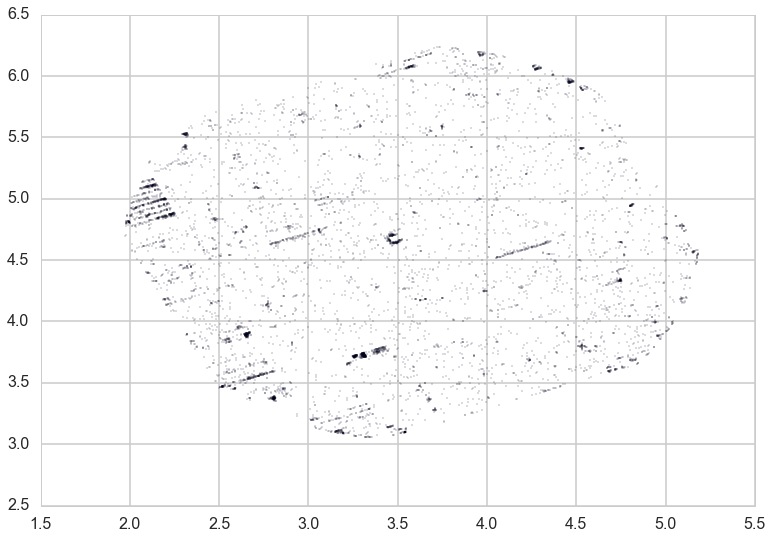

In [8]:
plt.scatter(ra_all, dec_all, s=0.1)
plt.xlim(1.5,5.5)
plt.ylim(2.5,6.5)
ra_all.shape

In [304]:
def make_colorful_plot(chip_dict, labels=True): # MJH: changed the default to drawing labels
    colors = cm.rainbow(np.linspace(0.1, 1, len(chip_dict)))
    for chip, c in zip(chip_dict, colors):
        plt.scatter(chip_dict[chip].RA_PSF, chip_dict[chip].DEC_PSF, s=0.1, label=chip, color=c)
        ram = chip_dict[chip].RA_PSF.mean()
        decm =chip_dict[chip].DEC_PSF.mean()
        if labels:
            plt.annotate(chip, xy=(ram,decm), xytext=(ram+0.1,decm-0.05), fontsize=15)
    # Note: I am inverting the x axis because that is the way it looks on the sky.
    # That is, right ascension (astro-speak for a longitude on the sky) increases to the left.
    plt.gca().invert_xaxis()
    if labels:
        plt.xlabel('RA (deg)')
        plt.ylabel('Dec (deg)')
        plt.title('Pan-STARRS-1 Gigapixel Camera')
    plt.savefig('colorful.png')

Inverting x axis to match how the detections would look in the sky (North up and East left).

Color-coding and labeling individual detectors within the array.  The detectors in the corners are vignetted by the optics (i.e. no light gets through).  Also, the poorer quality detectors have been placed on the periphery.

z 3.572163 4.640101 55895.2093599


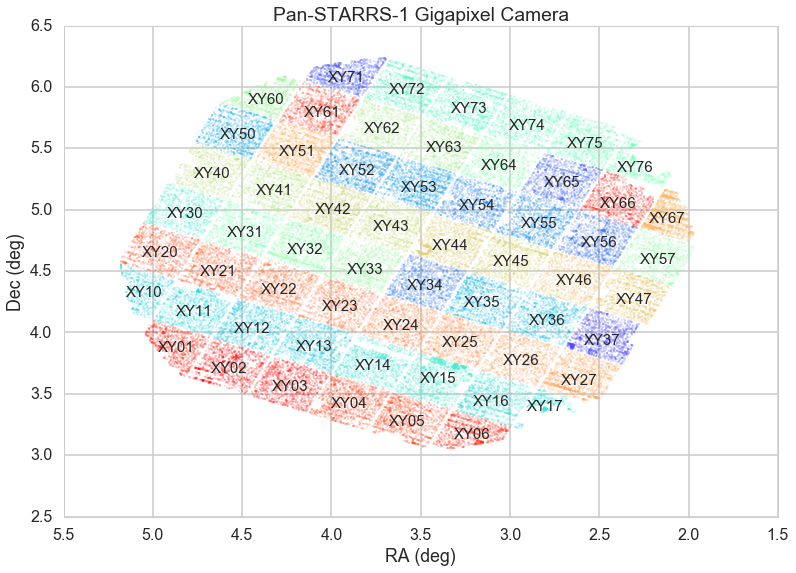

In [10]:
chip_dict, newdf = smf2pandas('test.star.smf', FLAGS_dict=FLAGS_dict, FLAGS2_dict=FLAGS2_dict)
make_colorful_plot(chip_dict)

## Identifying known sources

The majority of the detections in the Pan-STARRS-1 data (the smf files) correspond to sources that appear repeatedly in the same location from one exposure to the next.  These are stars, galaxies, distant quasars, and other astronomical objects.  A much smaller subset of the detections correspond to known moving objects, mostly main belt asteroids, whose orbits and thus positions on the sky at any given are well determined.

This large set of known stationary and moving sources in any given exposure is the primary ingredient to our classification.  Because the probability that a spurious detection coincides with a known source is less than 1%, we can assume that all detections that coinicde with a known source are real.

To identify the known stationary sources in each smf file we follow a few steps:

* Determine where the telescope was pointing at the time of the exposure.
* Determine which catalogs of known sources cover that region of the sky.
* Load those catalogs and build a KD-tree from the position vectors of those sources.  A KD-tree is needed in order to be able to efficiently search for matches.  A query of a KD-tree is $O(\log N)$, where N is the number of sources in the tree.
* For each detection in the smf file, query the KD-tree of known stationary sources to look for matches within an 1 arcsec angular radius on the sky.  (This is a very tight criterion for a match.)  If there are M sources in the smf file, this process is O(M log N).  In practice, it takes longer to read the catalogs from disk than it takes to complete the calculation. (An optimization would be to keep the catalogs in memory.)

To identify the known moving objects (asteroids) in each smf file we do the following:

* Build a KD-tree of all the positions of the detections in the smf file.
* Determine the time of the exposure and again where the telescope was pointing at that time.
* Determine the sky plane position of every known minor planet, based on their known orbital parameters, at the time of the exposure and from the vantange of the Pan-STARRS-1 telescope.  There are over 500,000 minor planets with well determined orbits.  This calculation is O(K), where K is the number of minor planets.  It's a detailed calculation but still takes just a few seconds for each smf file.
* Given the positions of all the minor planets, we query the KD-tree of detections in the smf to find matches.  Here we allow matches within 2 arcseconds, because the positions of the minor planets are not known as precisely.

Once the matches with known stationary and moving sources are identified, we record that information in the smf files so that we can use it later in our classifications.

This process is done on Harvard's Odyssey cluster using the code "filter_smf_list_v3.py".

In the smf file we just loaded there are many stationary and moving sources matched.  If the field "on_star" is set to 1 that detection matches a stationary source.   If the field "mp_desig" is set to something other than 'None' that detection matches the minor planet with that desgination.  (The designations are the IDs from the Minor Planet Center.)

In [11]:
newdf.head()

,AP_MAG,AP_MAG_RADIUS,AP_MAG_RAW,CAL_PSF_MAG,CAL_PSF_MAG_SIG,CR_NSIGMA,DEC_PSF,EXT_NSIGMA,FLAGS,FLAGS2,IPP_IDET,KRON_FLUX,KRON_FLUX_ERR,KRON_FLUX_INNER,KRON_FLUX_OUTER,MOMENTS_M3C,MOMENTS_M3S,MOMENTS_M4C,MOMENTS_M4S,MOMENTS_R1,MOMENTS_RH,MOMENTS_XX,MOMENTS_XY,MOMENTS_YY,N_FRAMES,PADDING,PADDING2,PEAK_FLUX_AS_MAG,PLTSCALE,POSANGLE,PSF_CHISQ,PSF_INST_FLUX,PSF_INST_FLUX_SIG,PSF_INST_MAG,PSF_INST_MAG_SIG,PSF_MAJOR,PSF_MINOR,PSF_NDOF,PSF_NPIX,PSF_QF,PSF_QF_PERFECT,PSF_THETA,RA_PSF,SKY,SKY_SIGMA,X_PSF,X_PSF_SIG,Y_PSF,Y_PSF_SIG,mp_dec_rate,mp_desig,mp_mag,mp_prox,mp_ra_rate,on_star,chip,filterID,mag,snr,fwhm,psf_extent,BIG_RADIUS,MOMENTS_FAILURE,EXT_LIMIT,EXTERNALPOS,DEFAULT,NONLINEAR_FIT,DEFECT,SKY_FAILURE,LINEAR_FIT,RADIAL_FLUX,PSFSTAR,POORFIT,SKYVAR_FAILURE,PAIR,OFF_CHIP,BLEND,FITFAIL,MOMENTS_SN,SATURATED,BLEND_FIT,AP_MAGS,SIZE_SKIPPED,CR_LIMIT,ON_SPIKE,BADPSF,EXTENDED_FIT,UNDEFINED,EXTENDED_STATS,SATSTAR,FITTED,EXTMODEL,ON_GHOST,PSFMODEL,HAS_BRIGHTER_NEIGHBOR,ON_STARCORE,ON_CONVPOOR,PASS1_SRC,DIFF_SELF_MATCH,BRIGHT_NEIGHBOR_1,SATSTAR_PROFILE,ON_BURNTOOL,BRIGHT_NEIGHBOR_10,DIFF_WITH_DOUBLE,DIFF_WITH_SINGLE,MATCHED
0,-15.724316,11,-15.649606,9.562006,0.0002,NaN,3.952620,42.940945,640680069,128,0,-inf,NaN,3023516.25000,1862353.000000,14.618450,4.760791,1.416535,0.608149,NaN,1.963364,39.411476,-4.489249,29.150957,0,0,0,-11.425479,0.255873,-44.950493,997430.562500,26142684.000000,15258.401367,-18.543377,0.000584,2.364025,2.205285,21047,21050,0.107734,0.075528,-25.710072,2.609610,151.263809,14.220932,3430.437744,0.001527,4232.690430,0.003072,NaN,None,NaN,NaN,NaN,1,XY37,z,9.562006,1860.724922,1.375740,14.844969,True,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,True,True,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False
1,-15.391106,11,-15.316396,15.057261,0.0002,NaN,3.864354,117.107620,103825415,160,1,1.337260e+06,1537.431396,341410.12500,1004.133301,-0.090274,-0.881527,0.350518,-0.037179,2.947113,1.234334,1.889432,0.134548,4.833177,0,0,0,-11.419569,0.255641,-44.923401,706189.250000,165671.843750,616.485168,-13.048121,0.003721,2.289338,2.232472,4086,4087,0.998310,0.422473,82.875938,2.542134,149.648865,14.414218,4190.956055,0.007917,2862.983154,0.007917,NaN,None,NaN,NaN,NaN,0,XY37,z,15.057261,292.276822,1.360920,1.336700,True,False,True,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,True,True,False,True,False,False,False,True,False,False,False,True,False,False,False,False
2,-14.712990,11,-14.638280,17.368683,0.0002,NaN,3.951783,159.373016,572522625,0,2,NaN,NaN,185575.15625,344422.281250,-0.135545,0.127662,0.154432,0.322281,NaN,0.557751,0.676340,-0.275254,2.873093,0,0,0,-11.416001,0.255869,-44.949932,938866.187500,19709.681641,302.497314,-10.736699,0.015348,2.363841,2.205340,4554,4555,0.897893,0.860194,-41.168640,2.607683,151.260513,14.208065,3430.452393,0.032655,4203.113281,0.032655,NaN,None,NaN,NaN,NaN,0,XY37,z,17.368683,71.244007,1.375682,0.610535,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False
3,-15.462722,11,-15.388012,12.681553,0.0002,NaN,3.799670,5.422551,103825415,128,3,1.403954e+06,1430.927002,338617.31250,88140.257812,0.153482,-0.495743,0.091551,0.015648,3.820368,1.893336,7.592988,0.083297,7.193233,0,0,0,-11.366590,0.255410,-44.925587,72203.671875,1477515.500000,1468.015991,-15.423830,0.000994,2.446745,2.155717,4086,4087,0.998891,0.878216,-51.509529,2.435251,151.996307,13.775016,4428.223145,0.002114,1115.403076,0.002114,NaN,None,NaN,NaN,NaN,1,XY37,z,12.681553,1093.262145,1.381284,3.217942,True,False,True,False,False,True,False,False,True,False,False,False,False,

In [12]:
newdf[newdf.on_star == 1].shape, newdf[newdf.mp_desig != 'None'].shape, newdf.shape

((51766, 106), (172, 106), (77824, 106))

Out of 78K detections, 52K match known stationary sources and 172 match known minor planets.  Those matched detections are very likely real.  Our primary focus is on classifying the unmatched detections.

### Exploring density of detections by potential classifiers

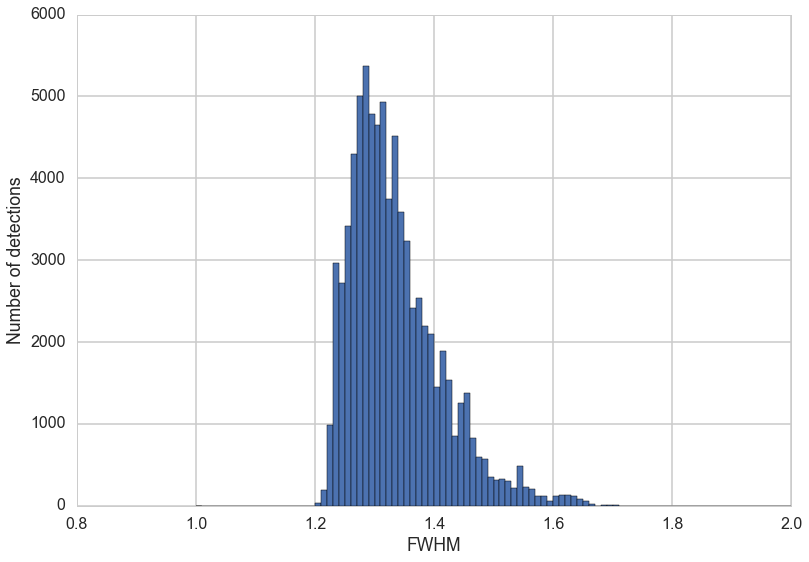

In [13]:
n, nbins, patches = plt.hist(newdf['fwhm'], bins=100, range=[1,2])
plt.xlabel("FWHM")
plt.ylabel("Number of detections")


0.997328579426


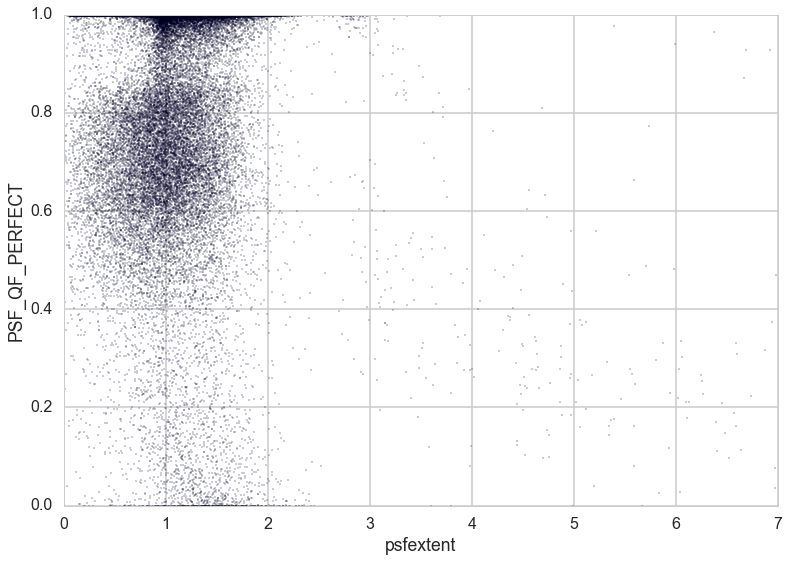

In [14]:
psfquality = newdf['PSF_QF_PERFECT']
print psfquality.median()
plt.scatter(newdf['psf_extent'], psfquality, s=0.2)
plt.xlim(0,7)
plt.ylim(0,2)
plt.xlabel("psfextent")
plt.ylabel("PSF_QF_PERFECT")
plt.ylim(0,1)
plt.show()

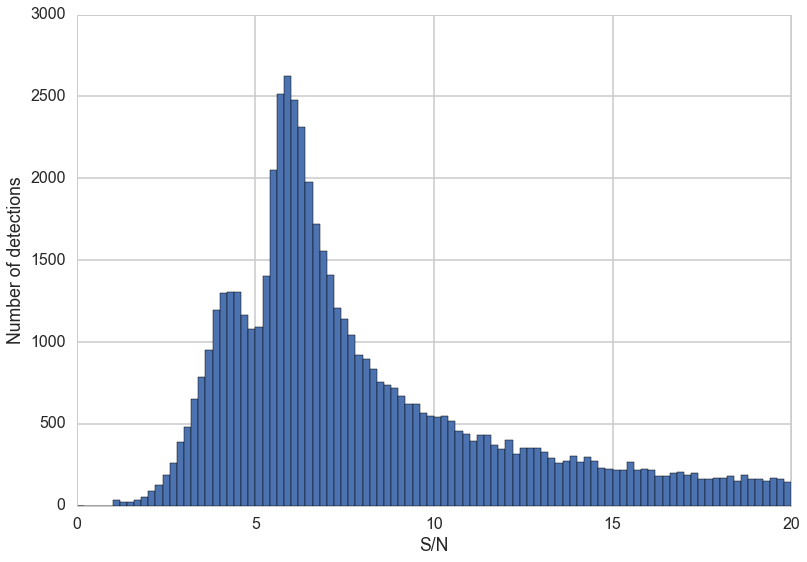

In [15]:
n, nbins, patches = plt.hist(newdf['snr'], bins=100, range=[0,20])
plt.xlabel("S/N")
plt.ylabel("Number of detections")


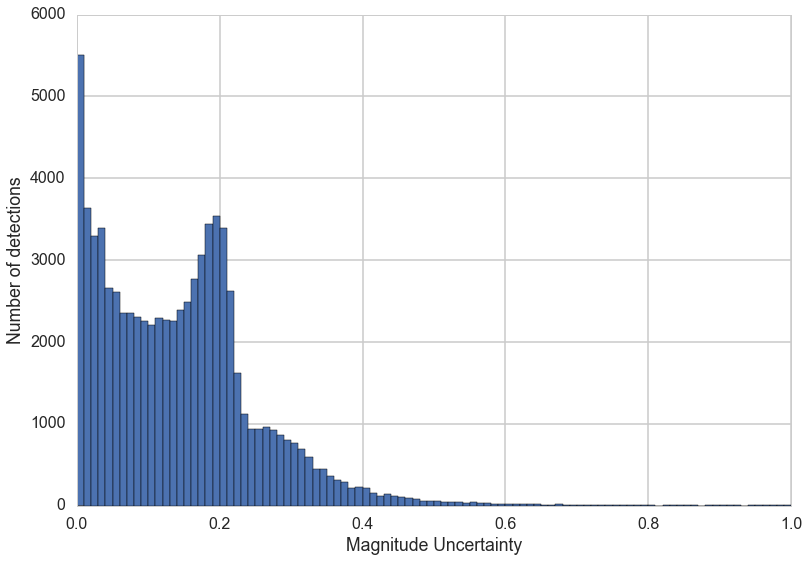

In [16]:

n, nbins, patches = plt.hist(newdf['PSF_INST_MAG_SIG'], bins=100, range=[0,1])
plt.xlabel("Magnitude Uncertainty")
plt.ylabel("Number of detections")


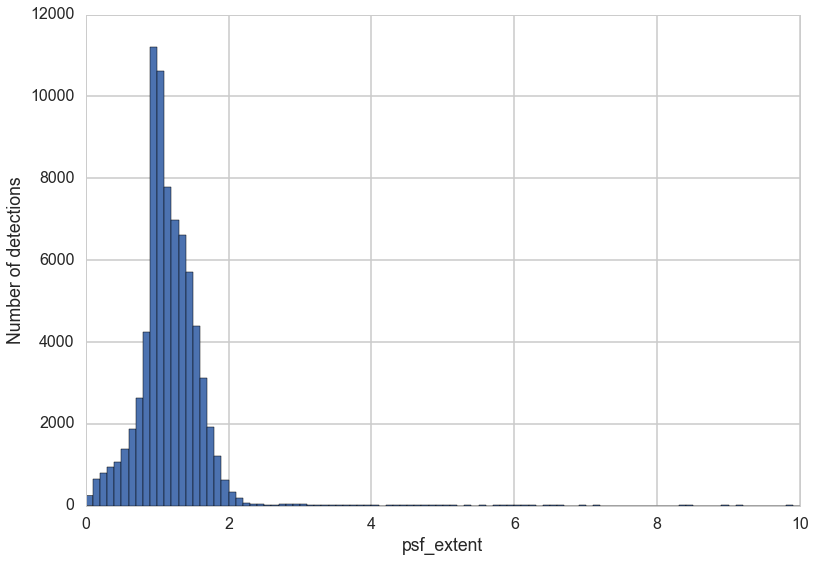

In [17]:

n, nbins, patches = plt.hist(newdf['psf_extent'], bins=100, range=[0,10])
plt.xlabel("psf_extent")
plt.ylabel("Number of detections")


The detectors in the Pan-STARRS-1 Gigapixel camera (GPC1) are prototypes, with many defects.  Each detector is a 4800x4800 Orthogonal Tranfer Array (OTA), composed of 64 cells, in an 8x8 grid.  Each 600 pixel x 600 pixel cell can be read out independently.

We see that many detections are associated with the edges of these cells.  That is evident in the two histograms below, of the x and y positions of the detections, respectively.

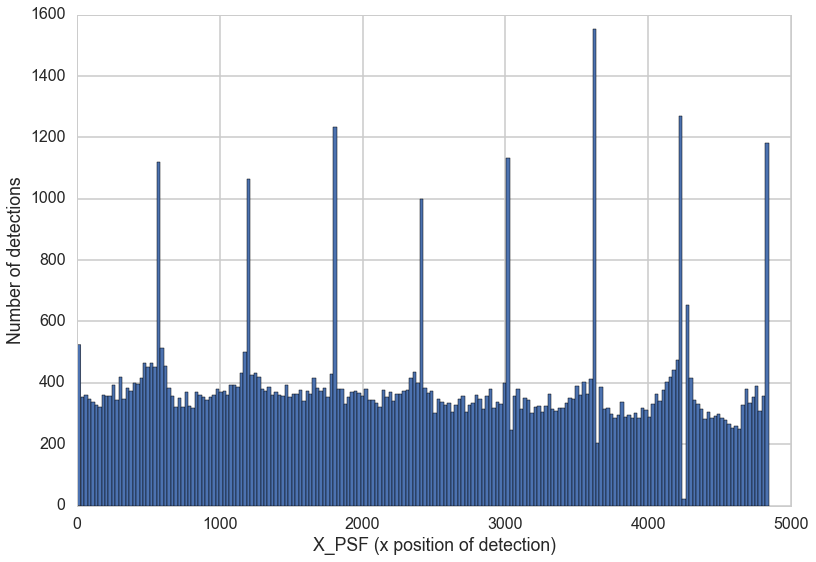

In [18]:
n, nbins, patches = plt.hist(newdf['X_PSF'], bins=200)
plt.xlabel("X_PSF (x position of detection)")
plt.ylabel("Number of detections")

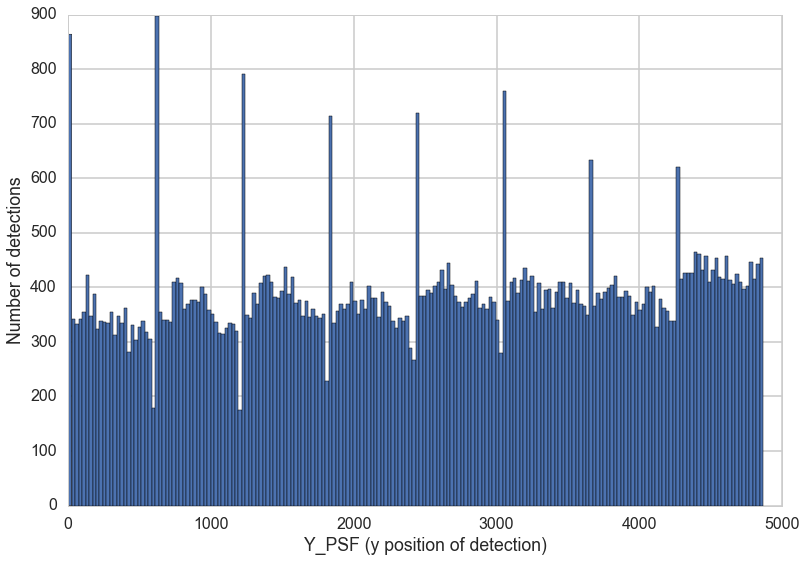

In [19]:
n, nbins, patches = plt.hist(newdf['Y_PSF'], bins=200)
plt.xlabel("Y_PSF (y position of detection)")
plt.ylabel("Number of detections")

Now we would like to add some more columns to the dataframe.  These are indicators of various characteristics of the detections.

In [20]:
# MJH: This was used for EDA; perhaps we won't need it later.

def generate_masks(df, snr_thresh=5.0, qfp_thresh=0.4):
    
    # Calculate masks based on threshold values and quantifies in df.
    flag_mask = df['FLAGS'].apply(flagOK)
    poor_mask = df['FLAGS'].apply(poorFlag)
    snr_mask =  df['snr'].apply(lambda x: x >= snr_thresh)
    inBox_mask = np.array(map(lambda (x, y): inBox(x, y), zip(df['X_PSF'], df['Y_PSF'])))
    magOK_mask = np.array(map(lambda (x, y): magOK(x, y), zip(df['mag'], df['PSF_INST_MAG_SIG'])))
    qfp_mask   = df['PSF_QF_PERFECT'].apply(lambda x: x >= qfp_thresh)
    offStar_mask =  df['on_star']==0
    
    # Add some columns to df.
    df['flagsOK'] = pd.Series(flag_mask,  index=df.index)
    df['in_box']  = pd.Series(inBox_mask, index=df.index)
    df['magOK']   = pd.Series(magOK_mask, index=df.index)
    df['qfpOK']   = pd.Series(qfp_mask,   index=df.index)

    return df, flag_mask, snr_mask, inBox_mask, magOK_mask, qfp_mask, offStar_mask, poor_mask


In [21]:
newdf, flag_mask, snr_mask, inBox_mask, magOK_mask, qfp_mask, offStar_mask, poor_mask = \
    generate_masks(newdf)

# good_mask refers to detections that pass all the various checks
good_mask = flag_mask & snr_mask & inBox_mask & magOK_mask & qfp_mask

# remainder_mask refers to detections that pass all the tests and which are not on a star.
remainder_mask = good_mask & offStar_mask


Use good_mask, defined in previous section, to visualize potential bad areas of the detectors:

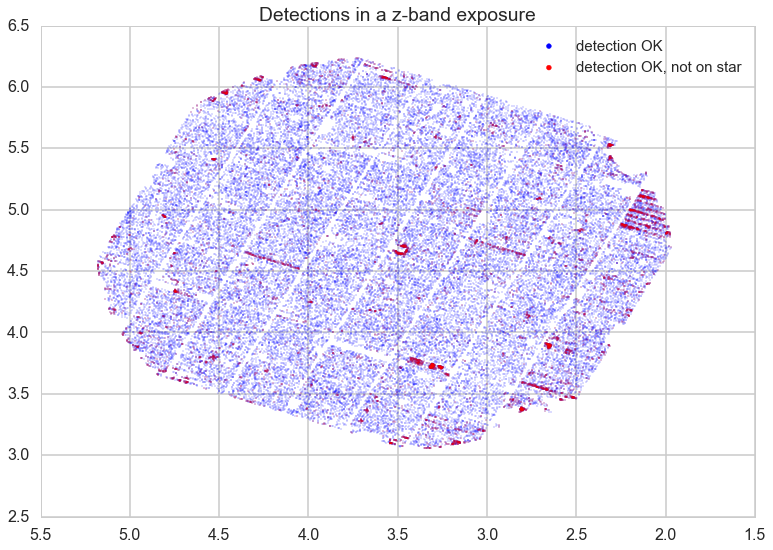

In [22]:
s1 = plt.scatter(newdf[good_mask].RA_PSF, newdf[good_mask].DEC_PSF, s=0.1, color='blue', label='detection OK')
s2 = plt.scatter(newdf[remainder_mask].RA_PSF, newdf[remainder_mask].DEC_PSF, s=0.1, color='red', label='detection OK, not on star')
plt.title('Detections in a z-band exposure')
leg = plt.legend(markerscale=15, fontsize=15)
plt.gca().invert_xaxis()

What we see in the plot above, aside from the expected roughly uniform distribution of astrophysical sources, are some linear groups of detections and some clumps of detections.  

The linear groups are probably the same kind of detections along the edges of cells that we've seen before.  Perhaps there is a bug in the inBox_mask or perhaps the region that should be removed varies from detector to detector.

The clumps of detections are either real, extended groups of stars such as globular clusters, or they are clumps of false detections around a saturated bright star or around a large detector defect.

It is hard to determine visually how many of the false positives are in these linear or clumped features, but it could be a significant fraction of the total (half).


Using the fold functions, plot detections based on a potential good/bad classification based on location within detector.  Note the concentration of bad detections along borders of detection.  Adjusting "inbox" parameters results in good detections being distributed within an area bordered by the bad detections.

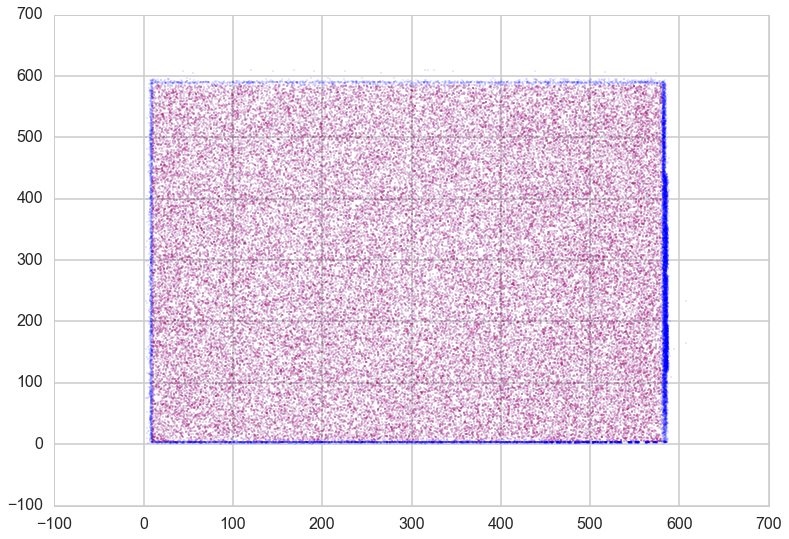

In [23]:
plt.scatter(xfold(newdf['X_PSF']), yfold(newdf['Y_PSF']), s=0.05, color='blue')
plt.scatter(xfold(newdf['X_PSF'][inBox_mask]), yfold(newdf['Y_PSF'][inBox_mask]), s=0.05, color='red')

# It can be that there are lines of false detections in individual detections that do not show
# up in this plot because they are obscured by the other detections.


Here's an example for a particularly bad detector ('XY67'), without folding:

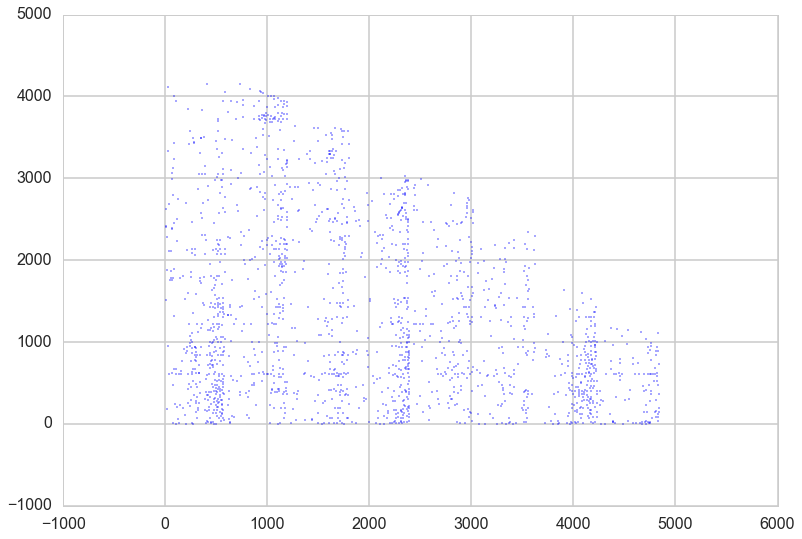

In [24]:
# Need to make this plot from many examples from the same chip, essentially to map out the
# the defect mask for each chip, not just those features that are common to all chips.
plt.scatter(chip_dict['XY67']['X_PSF'], chip_dict['XY67']['Y_PSF'], s=0.5, color='blue')


The "badFlags" mask that we used above is supposed to eliminate 20-25% of the false detections, according to Metcalfe et al. (2013) [MNRAS 435, 1825–1839 (2013] and Magnier et al. (2013) [ApJS 205, 20 (2013)].

If we take 2148 as 20% of the false detections the fraction of the total is 10740.

So, what are some things that remain to be done?

1. We can tune the SNR threshhold.
2. We can tune the PSF_QF_PERFECT threshhold.
3. We can tune the detector edge cuts.
4. We can use stacks of smf files to map out false positive regions of each detector.
5. We can look at the 'poor' masks to see if any of those fields are important.
6. I need to identify the known moving objects in the field.
7. I could use a bright star catalog (with proper motions incorporated) to locate the bright stars in the exposure in order to mask out bigger regions.

In [25]:
det_eff_tup = det_eff_dict['XY02']
count_max = det_eff_tup[1]
offs = np.array(map(lambda v: v[0], det_eff_tup[2]), dtype=np.float64)
fluxes = np.power(10.0,-0.4*offs)
counts = np.array(map(lambda v: float(v[1]), det_eff_tup[2]), dtype=np.float64)
mean_errs = np.array(map(lambda v: v[4], det_eff_tup[2]), dtype=np.float64)
fracs = counts/count_max


[ 0.78124728  0.06668515  0.33321289]


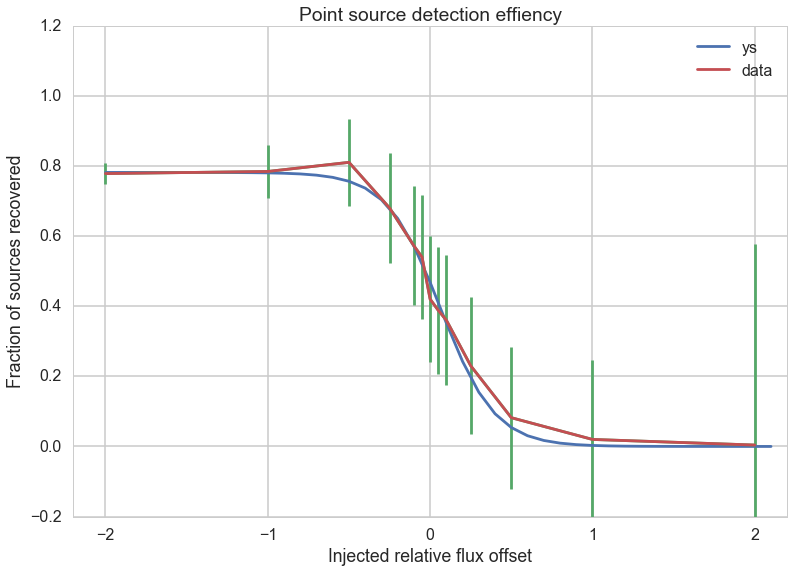

In [26]:
# MJH: we haven't yet made use of the detection efficiency information.  Perhaps for later work.
from scipy.optimize import curve_fit

def func(x, a, b, c):
    return a*0.5*(1.0-np.tanh((x-b)/c))

def func2(x, a, b, c):
    return a*0.5*(1.0-sp.special.erf((x-b)/c))

popt, pv = curve_fit(func, offs, fracs, p0=[0.3, 0.05, 0.3], sigma=mean_errs)
print popt

#popt2, pv = curve_fit(func2, offs, fracs, p0=[0.3, 0.05, 0.3], sigma=mean_errs)
#print popt2
xs = np.arange(-2,2.2,0.1)
ys = func(xs, popt[0], popt[1], popt[2])
#ys2 = func(xs, popt2[0], popt2[1], popt2[2])

plt.plot(xs,ys, label='ys')
#plt.plot(xs,ys2, label='ys2')
plt.errorbar(offs, fracs, yerr=mean_errs)
plt.plot(offs, fracs, label='data')
plt.ylim(-0.2,1.2)
plt.xlim(-2.2, 2.2)
plt.xlabel("Injected relative flux offset")
plt.ylabel("Fraction of sources recovered")
plt.title("Point source detection effiency")
plt.legend()

The question is how many of the remainig 80% of the false detections we can remove.

Let's look at some other smf files to see the variations.

y 5.754165 6.050334 55895.1872537


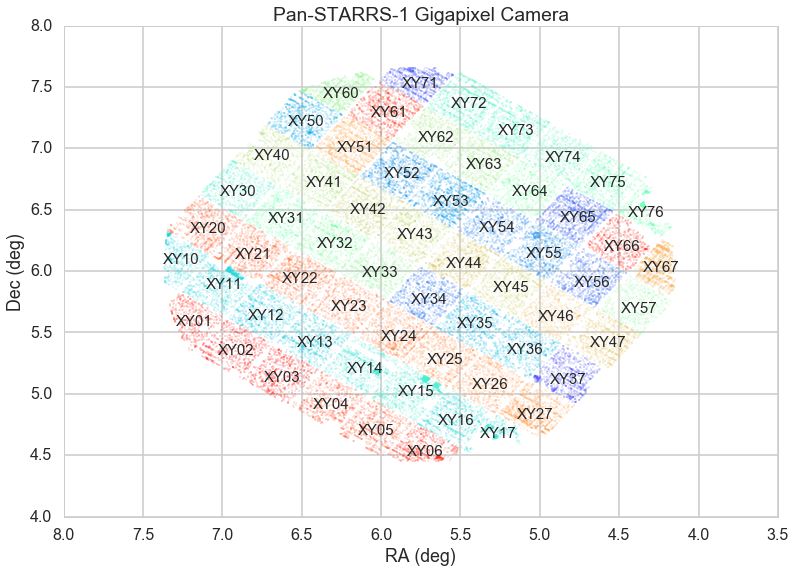

In [27]:
chip_dict, newdf = smf2pandas('data/o5895g0004o.424868.cm.333484.n.smf',FLAGS_dict=FLAGS_dict, FLAGS2_dict=FLAGS2_dict)
make_colorful_plot(chip_dict)

In [309]:
newdf, flag_mask, snr_mask, inBox_mask, magOK_mask, qfp_mask, offStar_mask, poor_mask = \
    generate_masks(newdf)

# good_mask refers to detections that pass all the various checks
good_mask = flag_mask & snr_mask & inBox_mask & magOK_mask & qfp_mask

# remainder_mask refers to detections that pass all the tests and which are not on a star.
remainder_mask = good_mask & offStar_mask


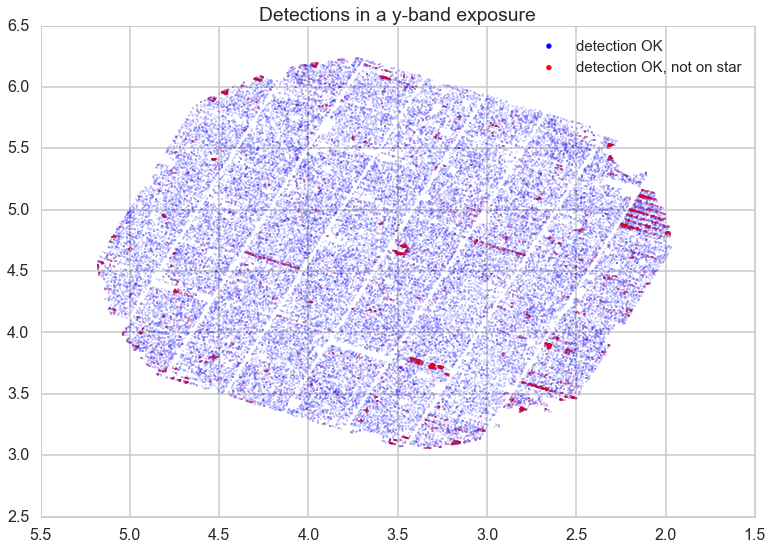

In [310]:
s1 = plt.scatter(newdf[good_mask].RA_PSF, newdf[good_mask].DEC_PSF, s=0.1, color='blue', label='detection OK')
s2 = plt.scatter(newdf[remainder_mask].RA_PSF, newdf[remainder_mask].DEC_PSF, s=0.1, color='red', label='detection OK, not on star')

plt.title('Detections in a y-band exposure')
leg = plt.legend(markerscale=15, fontsize=15)
plt.gca().invert_xaxis()

Here's another exposure, also in y-band.

y 5.961855 3.216078 55895.1877649


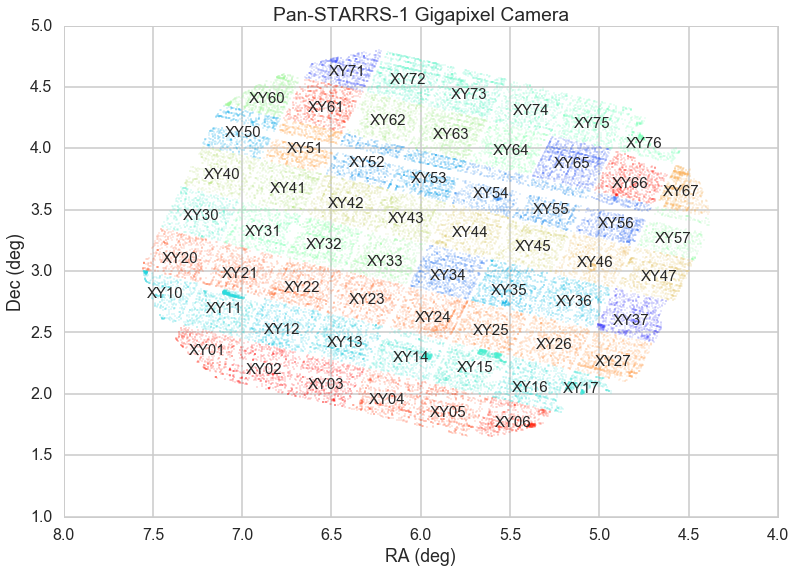

In [311]:
chip_dict, newdict = smf2pandas('data/o5895g0005o.424869.cm.333488.n.smf',FLAGS_dict=FLAGS_dict, FLAGS2_dict=FLAGS2_dict)
make_colorful_plot(chip_dict)

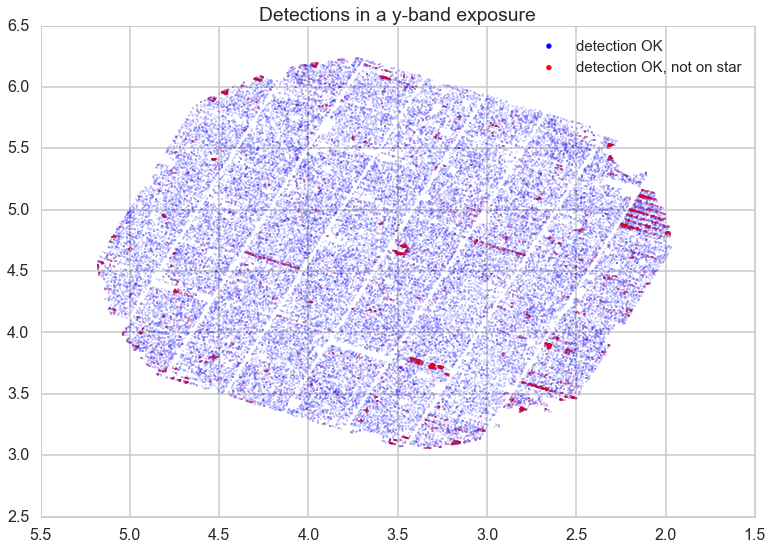

In [312]:
s1 = plt.scatter(newdf[good_mask].RA_PSF, newdf[good_mask].DEC_PSF, s=0.1, color='blue', label='detection OK')
s2 = plt.scatter(newdf[remainder_mask].RA_PSF, newdf[remainder_mask].DEC_PSF, s=0.1, color='red', label='detection OK, not on star')

plt.title('Detections in a y-band exposure')
leg = plt.legend(markerscale=15, fontsize=15)
plt.gca().invert_xaxis()

Let's plot it showing additional categories of detections.  

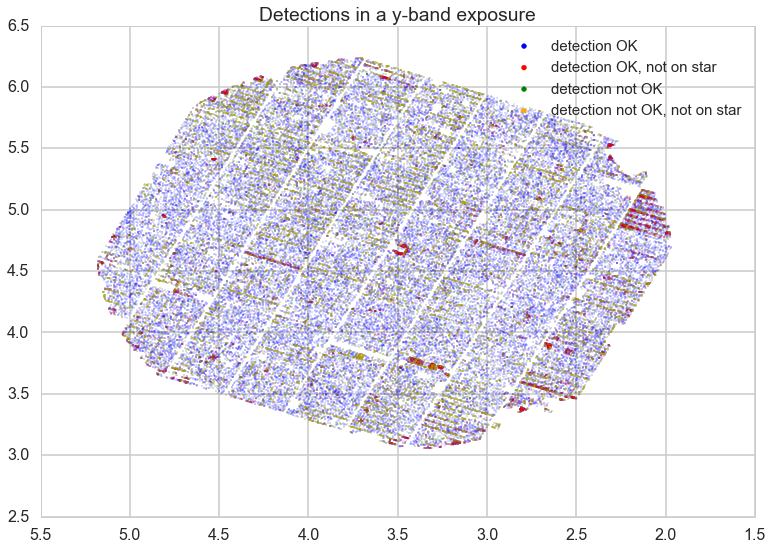

In [313]:
s1 = plt.scatter(newdf[good_mask].RA_PSF, newdf[good_mask].DEC_PSF, s=0.1, color='blue', label='detection OK')
s2 = plt.scatter(newdf[remainder_mask].RA_PSF, newdf[remainder_mask].DEC_PSF, s=0.1, color='red', label='detection OK, not on star')
s3 = plt.scatter(newdf[~good_mask].RA_PSF, newdf[~good_mask].DEC_PSF, s=0.1, color='green', label='detection not OK')
s4 = plt.scatter(newdf[~good_mask & offStar_mask].RA_PSF, newdf[~good_mask & offStar_mask].DEC_PSF, s=0.1, color='orange', label='detection not OK, not on star')

plt.title('Detections in a y-band exposure')
leg = plt.legend(markerscale=15, fontsize=15)
plt.gca().invert_xaxis()

What fraction of the detections that are "on-star" also have the flags and other characteristics of detections that we think are likely false positives?  From that number we can estimate the fraction of real moving sources that we might classify as false (aside from any additional issues with trailing).

How can we stack the files of remaining detections to better identify the per-chip regions that generate false positives?  

In [314]:
float(remainder_mask.sum())/remainder_mask.shape[0]

0.0984143708881579

The remainders (those detections that are not matched and that still satisfy the list of cuts) now account for about 10% of the total number of detections.

In [315]:
float((~good_mask & ~offStar_mask).sum())/(~offStar_mask).sum()

0.05855194529227679

At least in this case, about 6% of the detections that coincide with stars are also flagged as likely false positives.  

We can break this down further.

In [316]:
float((~flag_mask & ~offStar_mask).sum())/(~offStar_mask).sum()

0.009002047676080826

About 2% of the "on-star" detections also have bad flags.  Some of those are bright, known stars that are saturated.  Those are not moving objects; it's ok to exclude them.

In [317]:
float((~snr_mask & ~offStar_mask).sum())/(~offStar_mask).sum()

0.010663369779391878

About 1% of the "on-star" detections are below the S/N cut.  These are likely objects that were detected at higher S/N in other, more sensitive bands.

In [318]:
float((~inBox_mask & ~offStar_mask).sum())/(~offStar_mask).sum()

0.03819109067727852

About 4% of the "on-star" detections are along the edges.  This seems low, based on the ~8% of detector area that is eliminated (30 pixels out of 600 in the x direction and 20 pixels out of 600 in the y direction).  I will double check this, but it could mean that stars are less detectable on the edges as well.  That seems plausible, if the edge regions are less sensitive.

In [319]:
float((~qfp_mask & ~offStar_mask).sum())/(~offStar_mask).sum()

0.018004095352161652

Fewer than 2% of the "on-star" detections do not satisfy the PSF_QF_PERFECT cut.

In [320]:
float((~magOK_mask & ~offStar_mask).sum())/(~offStar_mask).sum()

0.0019317698875709925

An very small fraction of the "on-star" detections have a NaN or Inf for their magnitudes or magnitude uncertainties.

What about other flags and characteristics?

In [321]:
float((poor_mask & ~offStar_mask).sum())/(~offStar_mask).sum()

0.007591855658154001

In [322]:
float((poor_mask & offStar_mask).sum())/(offStar_mask).sum()

0.016693529818098088

Very few of the detections, either "on-star" or off, have any of the poor mask flags set.  The poor flags do not seem very helpful in distinguishing real and false detections.

In [323]:
float((good_mask & (newdf.mp_desig != 'None')).sum())/(newdf.mp_desig != 'None').sum()

0.9186046511627907

96% of the minor planet detections satisfy the "good mask" criteria.

In [324]:
# These are the asteroid detections that had a bad flag.
newdf[~good_mask & (newdf.mp_desig != 'None')]

,AP_MAG,AP_MAG_RADIUS,AP_MAG_RAW,CAL_PSF_MAG,CAL_PSF_MAG_SIG,CR_NSIGMA,DEC_PSF,EXT_NSIGMA,FLAGS,FLAGS2,IPP_IDET,KRON_FLUX,KRON_FLUX_ERR,KRON_FLUX_INNER,KRON_FLUX_OUTER,MOMENTS_M3C,MOMENTS_M3S,MOMENTS_M4C,MOMENTS_M4S,MOMENTS_R1,MOMENTS_RH,MOMENTS_XX,MOMENTS_XY,MOMENTS_YY,N_FRAMES,PADDING,PADDING2,PEAK_FLUX_AS_MAG,PLTSCALE,POSANGLE,PSF_CHISQ,PSF_INST_FLUX,PSF_INST_FLUX_SIG,PSF_INST_MAG,PSF_INST_MAG_SIG,PSF_MAJOR,PSF_MINOR,PSF_NDOF,PSF_NPIX,PSF_QF,PSF_QF_PERFECT,PSF_THETA,RA_PSF,SKY,SKY_SIGMA,X_PSF,X_PSF_SIG,Y_PSF,Y_PSF_SIG,mp_dec_rate,mp_desig,mp_mag,mp_prox,mp_ra_rate,on_star,chip,filterID,mag,snr,fwhm,psf_extent,BIG_RADIUS,MOMENTS_FAILURE,EXT_LIMIT,EXTERNALPOS,DEFAULT,NONLINEAR_FIT,DEFECT,SKY_FAILURE,LINEAR_FIT,RADIAL_FLUX,PSFSTAR,POORFIT,SKYVAR_FAILURE,PAIR,OFF_CHIP,BLEND,FITFAIL,MOMENTS_SN,SATURATED,BLEND_FIT,AP_MAGS,SIZE_SKIPPED,CR_LIMIT,ON_SPIKE,BADPSF,EXTENDED_FIT,UNDEFINED,EXTENDED_STATS,SATSTAR,FITTED,EXTMODEL,ON_GHOST,PSFMODEL,HAS_BRIGHTER_NEIGHBOR,ON_STARCORE,ON_CONVPOOR,PASS1_SRC,DIFF_SELF_MATCH,BRIGHT_NEIGHBOR_1,SATSTAR_PROFILE,ON_BURNTOOL,BRIGHT_NEIGHBOR_10,DIFF_WITH_DOUBLE,DIFF_WITH_SINGLE,MATCHED,flagsOK,in_box,magOK,qfpOK
2136,-6.631132,11,-6.554032,21.250675,0.0002,NaN,6.100206,0.235557,35651585,0,472,518.877319,133.917862,190.012817,-8.681839,-2.763675,-2.093162,0.493961,0.364254,3.074809,1.148732,2.885502,-0.068464,3.097178,0,0,0,-4.060670,0.255238,135.201157,2161.715088,551.929138,115.139915,-6.854708,0.208614,2.914266,2.279948,1360,1361,0.823979,0.823979,37.469509,4.047287,144.349106,13.819805,1192.187378,0.443859,1031.144531,0.443859,0.006809,Z1838,21.414,0.886979,0.088329,0,XY71,z,21.250675,5.720535,1.549267,1.159756,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True,True
3546,-6.957858,9,-6.860152,20.871445,0.0002,NaN,5.238645,0.586543,35651585,0,570,746.640015,125.784363,333.513458,295.105347,0.374217,-1.460120,0.120381,0.004326,2.650257,0.986058,2.995879,-0.192323,1.435624,0,0,0,-4.275744,0.256167,134.901901,1675.586304,782.664001,117.593384,-7.233938,0.150248,2.146771,1.980816,1510,1511,0.786602,0.786602,-33.152180,2.802868,153.423141,13.795354,1961.931030,0.319676,1223.109741,0.319676,0.013898,A0762,20.505,0.163595,0.029695,0,XY65,z,20.871445,7.737842,1.243920,1.005698,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True,True
4991,-7.453966,10,-7.367185,20.248837,0.0002,NaN,4.661976,-1.139019,35651585,0,564,1115.023926,151.370712,378.120880,-280.710388,-1.015035,0.451738,-0.054184,0.005833,2.832802,1.171512,2.040932,-0.116609,2.240532,0,0,0,-4.164267,0.256029,134.902390,1813.123657,1388.732544,122.731094,-7.856547,0.088376,2.253035,2.223338,1450,1451,0.857672,0.857672,50.278625,2.506423,157.069290,13.692428,1188.199097,0.188035,3113.466797,0.188035,-0.277560,K11S28L,19.867,0.423431,0.604501,0,XY56,z,20.248837,12.792155,1.349369,0.955439,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True,True
16237,-5.933946,10,-5.847915,21.587095,0.0002,NaN,4.189590,0.153222,35651585,0,817,372.972015,125.602341,175.227905,10.907112,-0.666301,-2.006094,0.007001,0.153032,2.791819,0.388061,1.567386,-0.354873,2.354031,0,0,0,-3.605236,0.256134,-44.962849,1496.795898,404.869659,118.446587,-6.518288,0.292555,2.296501,2.142831,1307,1308,0.796068,0.796068,-10.758411,2.577132,152.898163,13.399323,199.288589,0.622457,3.382306,0.622457,-0.044991,K1

Now we make a series of plots in which we see if what earlier explorations and what is in the literature do a good job of separating real and false detections. The detections in blue satisfy all the criteria, and the red fail at least one of them.

Applying the good_mask eliminates the spikes along the edges of the detectors, in both the x and y directions.

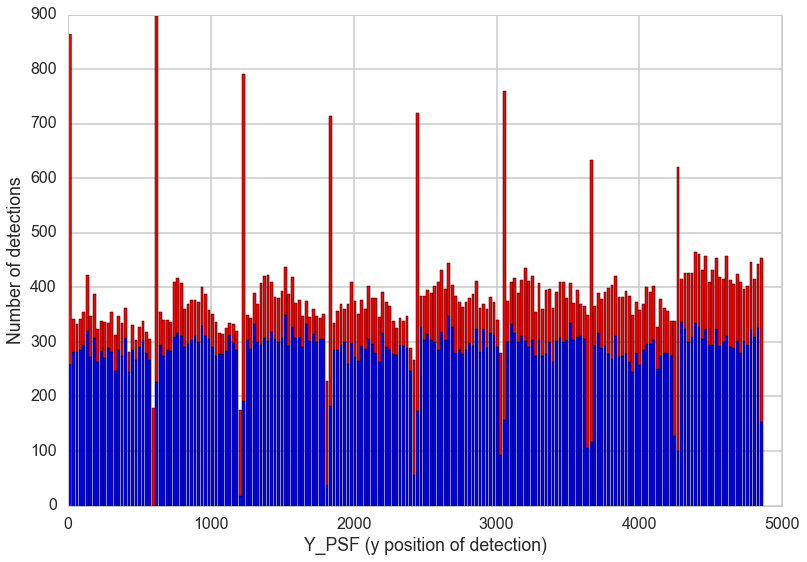

In [325]:
y0 = newdf[good_mask].Y_PSF.values
y1 = newdf[~good_mask].Y_PSF.values
colors = ['blue', 'red']
labels = ['good', 'not good']
n, nbins, patches = plt.hist([y0, y1], bins=200, color=colors, label=labels, stacked=True)

#n, nbins, patches = plt.hist(newdf[good_mask].Y_PSF, bins=200)
plt.xlabel("Y_PSF (y position of detection)")
plt.ylabel("Number of detections")

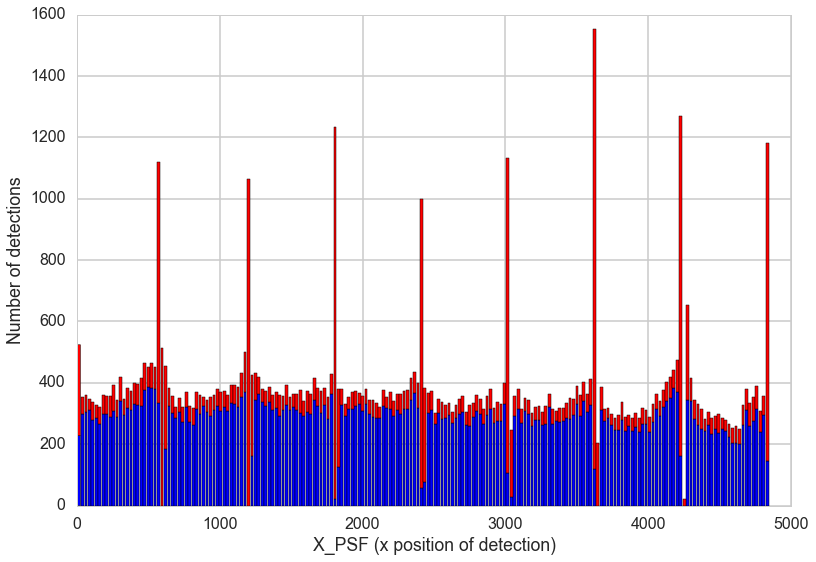

In [326]:
x0 = newdf[good_mask].X_PSF.values
x1 = newdf[~good_mask].X_PSF.values
colors = ['blue', 'red']
labels = ['good', 'not good']
n, nbins, patches = plt.hist([x0, x1], bins=200, color=colors, label=labels, stacked=True)

#n, nbins, patches = plt.hist(newdf[good_mask].Y_PSF, bins=200)
plt.xlabel("X_PSF (x position of detection)")
plt.ylabel("Number of detections")

There does seem to be something different about the detection with $SNR\ge5$ and those with $SNR<5$.

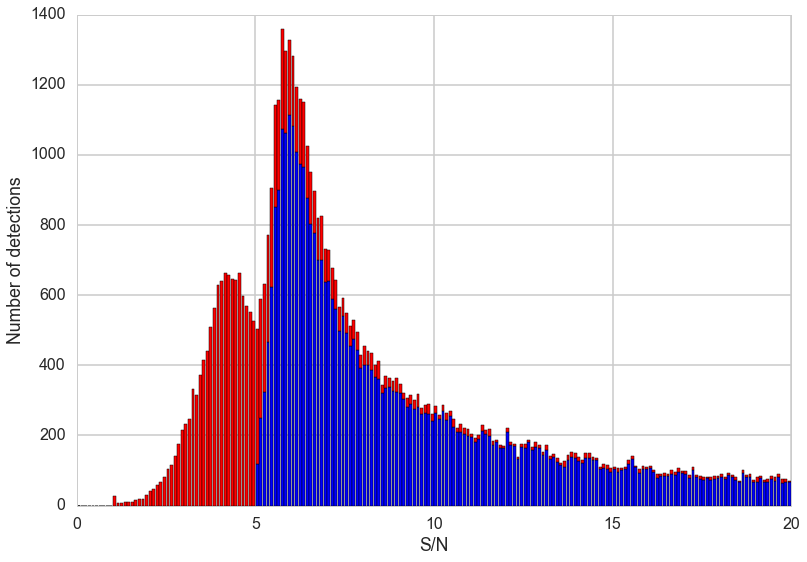

In [327]:
s0 = newdf[good_mask].snr.values
s1 = newdf[~good_mask].snr.values
colors = ['blue', 'red']
labels = ['good', 'not good']
n, nbins, patches = plt.hist([s0, s1], bins=200, color=colors, label=labels, stacked=True, range=[0,20])

#n, nbins, patches = plt.hist(newdf[good_mask].Y_PSF, bins=200)
plt.xlabel("S/N")
plt.ylabel("Number of detections")

Likewise, PSF_QF_PERFECT shows a transition near 0.85.

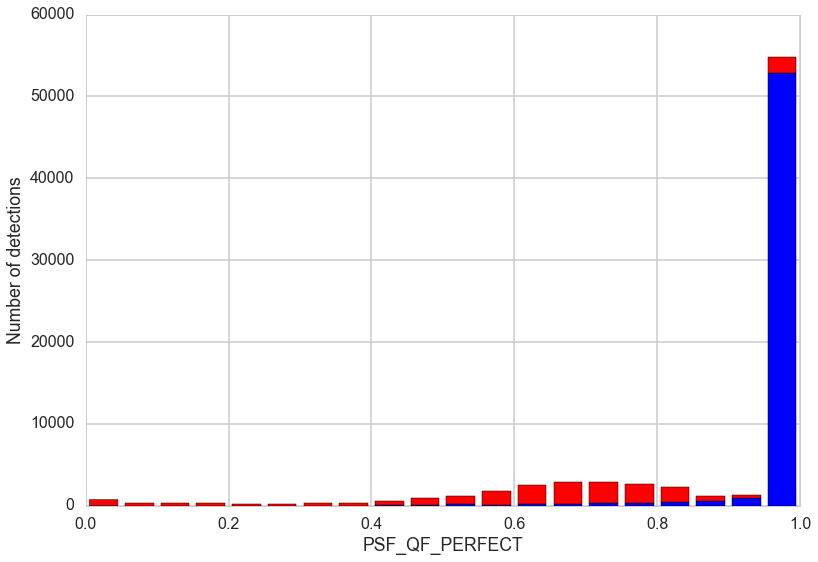

In [328]:
s0 = newdf[good_mask].PSF_QF_PERFECT.values
s1 = newdf[~good_mask].PSF_QF_PERFECT.values
colors = ['blue', 'red']
labels = ['good', 'not good']
n, nbins, patches = plt.hist([s0, s1], bins=20, color=colors, label=labels, stacked=True, range=[0,1])

#n, nbins, patches = plt.hist(newdf[good_mask].Y_PSF, bins=200)
plt.xlabel("PSF_QF_PERFECT")
plt.ylabel("Number of detections")

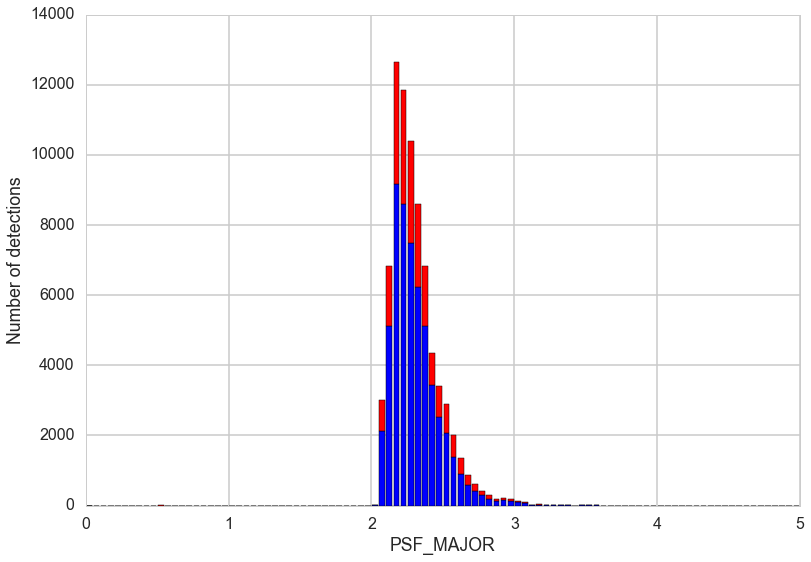

In [329]:
s0 = newdf[good_mask].PSF_MAJOR.values
s1 = newdf[~good_mask].PSF_MAJOR.values
colors = ['blue', 'red']
labels = ['good', 'not good']
n, nbins, patches = plt.hist([s0, s1], bins=100, color=colors, label=labels, stacked=True, range=[0,5])

#n, nbins, patches = plt.hist(newdf[good_mask].Y_PSF, bins=200)
plt.xlabel("PSF_MAJOR")
plt.ylabel("Number of detections")

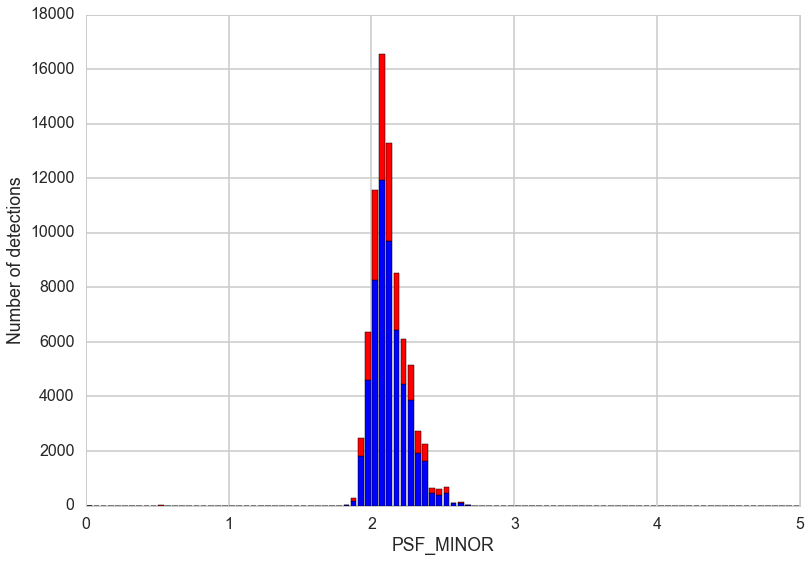

In [330]:
s0 = newdf[good_mask].PSF_MINOR.values
s1 = newdf[~good_mask].PSF_MINOR.values
colors = ['blue', 'red']
labels = ['good', 'not good']
n, nbins, patches = plt.hist([s0, s1], bins=100, color=colors, label=labels, stacked=True, range=[0,5])

#n, nbins, patches = plt.hist(newdf[good_mask].Y_PSF, bins=200)
plt.xlabel("PSF_MINOR")
plt.ylabel("Number of detections")

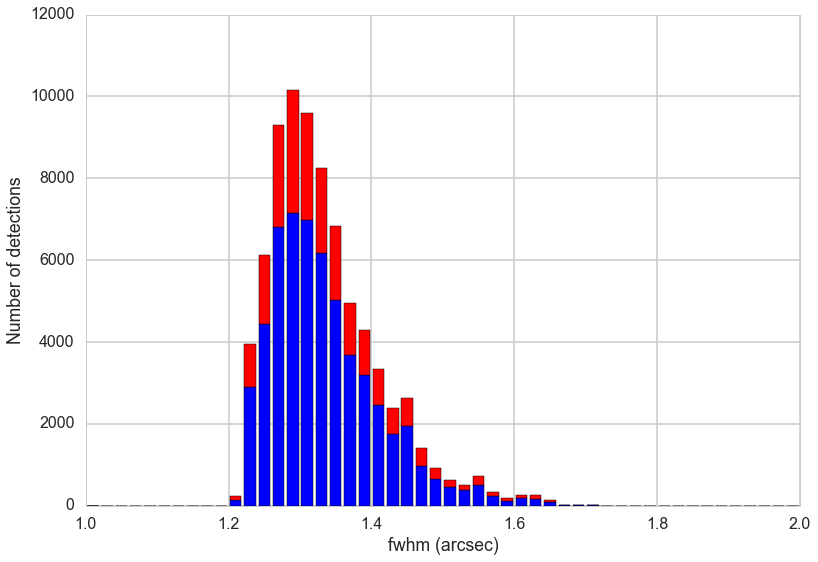

In [331]:
s0 = newdf[good_mask].fwhm.values
s1 = newdf[~good_mask].fwhm.values
colors = ['blue', 'red']
labels = ['good', 'not good']
n, nbins, patches = plt.hist([s0, s1], bins=50, color=colors, label=labels, stacked=True, range=[1,2])

#n, nbins, patches = plt.hist(newdf[good_mask].Y_PSF, bins=200)
plt.xlabel("fwhm (arcsec)")
plt.ylabel("Number of detections")

PSF_MAJOR, PSF_MINOR, and FWHM do not show much separation.

But the detections with the largest values of X_PSF_SIG (positional uncertainty) are predominantly those that fail one of our criteria for being "good".

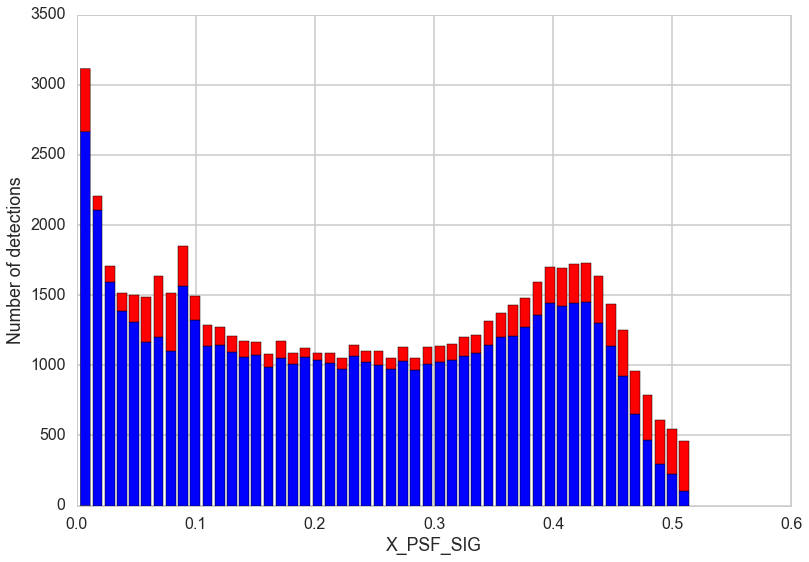

In [332]:
s0 = newdf[good_mask].X_PSF_SIG.values
s1 = newdf[~good_mask].X_PSF_SIG.values
colors = ['blue', 'red']
labels = ['good', 'not good']
n, nbins, patches = plt.hist([s0, s1], bins=50, color=colors, label=labels, stacked=True)

#n, nbins, patches = plt.hist(newdf[good_mask].Y_PSF, bins=200)
plt.xlabel("X_PSF_SIG")
plt.ylabel("Number of detections")

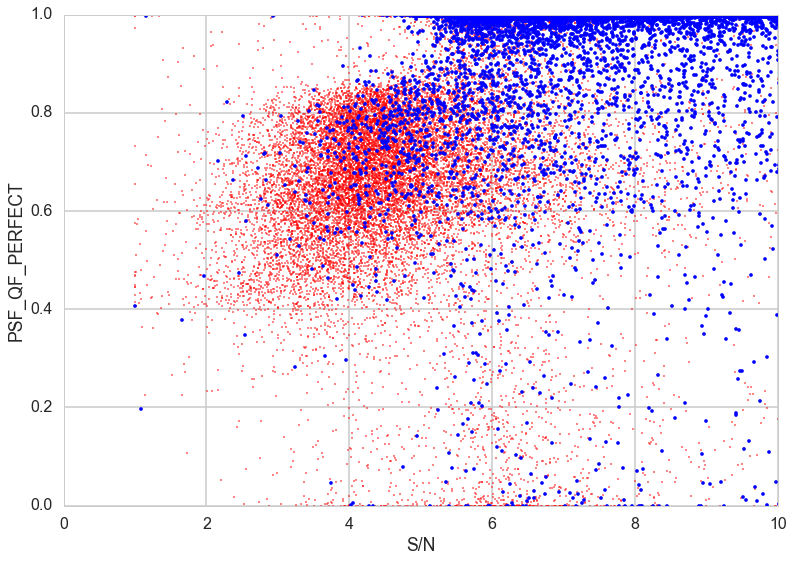

In [333]:
x0 = newdf[good_mask].snr.values
s0 = newdf[good_mask].PSF_QF_PERFECT.values
x1 = newdf[~good_mask].snr.values
s1 = newdf[~good_mask].PSF_QF_PERFECT.values
x2 = newdf[inBox_mask].snr.values
s2 = newdf[inBox_mask].PSF_QF_PERFECT.values
x3 = newdf[~inBox_mask].snr.values
s3 = newdf[~inBox_mask].PSF_QF_PERFECT.values
x4 = newdf[~offStar_mask].snr.values
x4m= newdf[~offStar_mask].mag.values
s4 = newdf[~offStar_mask].PSF_QF_PERFECT.values
x5 = newdf[offStar_mask].snr.values
x5m= newdf[offStar_mask].mag.values
s5 = newdf[offStar_mask].PSF_QF_PERFECT.values

#plt.scatter(x0, s0, color='blue', label='good', s=2.0, alpha=1.0)
#plt.scatter(x1, s1, color='red', label='not good', s=0.5, alpha=0.5)
#plt.scatter(x2, s2, color='blue', label='inBox', s=2.0, alpha=1.0)
#plt.scatter(x3, s3, color='red', label='not InBox', s=0.5, alpha=0.5)
plt.scatter(x5, s5, color='red', label='off star', s=2.5, alpha=0.5)
plt.scatter(x4, s4, color='blue', label='on star', s=10.0, alpha=1.0)
#plt.scatter(x5m, s5, color='red', label='off star', s=2.5, alpha=0.5)
#plt.scatter(x4m, s4, color='blue', label='on star', s=10, alpha=1.0)

plt.xlim(0,10)
#plt.xlim(18.0,22)
plt.xlabel("S/N")
#plt.xlabel("Mag")
plt.ylabel("PSF_QF_PERFECT")
plt.ylim(0,1)
plt.show()

In [334]:
x4.shape, x5.shape, newdf.shape

((51766,), (26058,), (77824, 110))

The plot above shows that although most "on star" detections (which are very likely real) have PSF_QF_PERFECT > 0.85 and SNR>5, there are other "on star" detections throughout the plot.  

One thing that is worth noting is we calculated SNR from the error in the instrumental magnitude that is provided in the smf file.  Clearly we see some sources with very low values of PSF_QF_PERFECT that are likely real.

It could be there are some very bright sources that happen to land on a bunch of bad pixels (so that they have low values of PSF_QF_PERFECT) and get lowish values of SNR because the uncertainty in the instrumental magnitude is high.

Here is a plot with the actual magnitude values, but that does not seem to provide more separation (less, if anything).

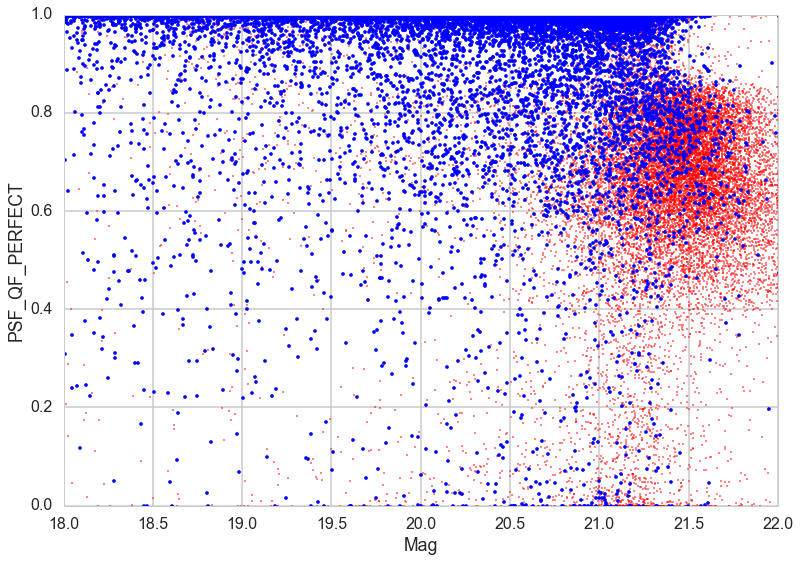

In [335]:
plt.scatter(x5m, s5, color='red', label='off star', s=2.5, alpha=0.5)
plt.scatter(x4m, s4, color='blue', label='on star', s=10, alpha=1.0)

plt.xlim(18.0,22)
plt.xlabel("Mag")
plt.ylabel("PSF_QF_PERFECT")
plt.ylim(0,1)
plt.show()

Now we define an "on_match" field, that combines both star and minor planet matches.  Detections that are "on_match" are predominantly real and can be used as a training set.

In [336]:
# Added to replace onmatch function from C.A.
# MJH: Not sure what we want to do here
#newdf['on_match'] = (newdf.on_star | (newdf.mp_desig != 'None')) & ~newdf.on_faulty
newdf['on_match'] = (newdf.on_star | (newdf.mp_desig != 'None'))

The "edges" classifier was used to mask out all outer detectors, but this was found to be overkill

In [337]:
# Added, moved it up from below to incorporate into on_match
# edges = ['XY01','XY02','XY03','XY04','XY05','XY06',
#          'XY10','XY20','XY30','XY40','XY50','XY60',
#          'XY17','XY27','XY37','XY47','XY57','XY67',
#          'XY71','XY72','XY73','XY74','XY75','XY76']
edges = ['XY67'] #this detector has the most known bad sensors

newdf['on_faulty'] = newdf['chip'].isin(edges)

For EDA, separate potential classifiers into "indicators" vs "continuous features" groups

In [338]:
# Separate potential classifiers into groups
lcols=list(newdf.columns)

# list of possible indicator features
INDICATORS = ['in_box', 'flagsOK', 'magOK', 'BIG_RADIUS','MOMENTS_FAILURE','EXT_LIMIT','EXTERNALPOS','DEFAULT','NONLINEAR_FIT','DEFECT',
              'SKY_FAILURE','LINEAR_FIT','RADIAL_FLUX','PSFSTAR','POORFIT','SKYVAR_FAILURE','PAIR','OFF_CHIP','BLEND',
              'FITFAIL','MOMENTS_SN','SATURATED','BLEND_FIT','AP_MAGS','SIZE_SKIPPED','CR_LIMIT','ON_SPIKE','BADPSF',
              'EXTENDED_FIT','UNDEFINED','EXTENDED_STATS','SATSTAR','FITTED','EXTMODEL','ON_GHOST','PSFMODEL',
              'HAS_BRIGHTER_NEIGHBOR','ON_STARCORE','ON_CONVPOOR','PASS1_SRC','DIFF_SELF_MATCH','BRIGHT_NEIGHBOR_1',
              'SATSTAR_PROFILE','ON_BURNTOOL','BRIGHT_NEIGHBOR_10','DIFF_WITH_DOUBLE','DIFF_WITH_SINGLE'
             ]

# list of possible continuous features
ccols = ['AP_MAG','AP_MAG_RADIUS','AP_MAG_RAW','CAL_PSF_MAG','CAL_PSF_MAG_SIG','DEC_PSF','EXT_NSIGMA','PEAK_FLUX_AS_MAG',
         'PLTSCALE','POSANGLE','PSF_CHISQ','PSF_INST_FLUX','PSF_INST_FLUX_SIG','PSF_INST_MAG','PSF_INST_MAG_SIG',
         'PSF_MAJOR','PSF_MINOR','PSF_NDOF','PSF_NPIX','PSF_QF','PSF_QF_PERFECT','PSF_THETA','RA_PSF','SKY',
         'SKY_SIGMA','X_PSF','X_PSF_SIG','Y_PSF','Y_PSF_SIG','mag','snr','fwhm','psf_extent'
        ]

# anything which isn't in INDICATORS or ccols will be added to 'other'
other = []

# list of all features under consideration
testfeatures = []
for i in INDICATORS:
    testfeatures.append(i)
for c in ccols:
    testfeatures.append(c)   
for c in lcols:
    if c not in testfeatures:
        other.append(c)

print 'potential continuous predictors:',len(ccols)
print 'potential indicators:',len(INDICATORS)
print 'other columns:',len(other)
print 'newdf shape:',newdf.shape

potential continuous predictors: 33
potential indicators: 47
other columns: 32
newdf shape: (77824, 112)


Kernel density plot for potential continuous features:

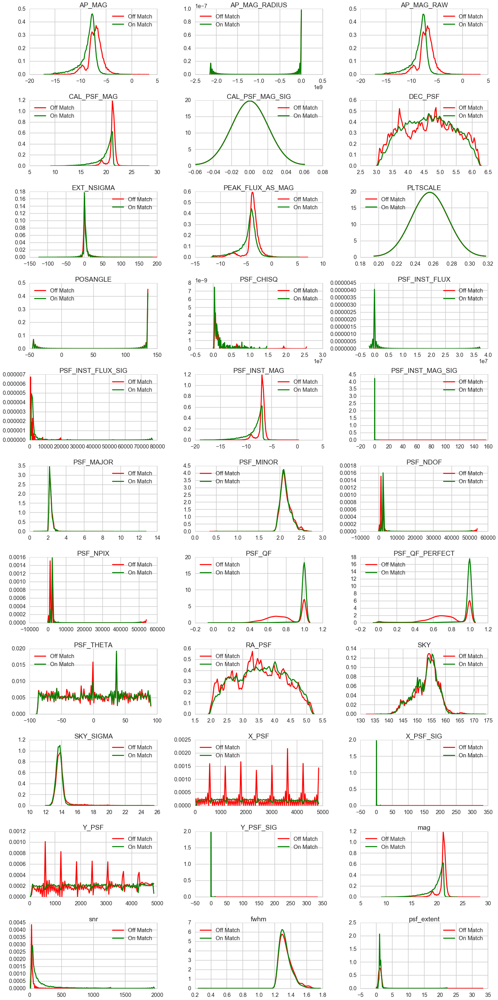

In [339]:
# create kernel density plots for continuous features EDA
fig, axes = plt.subplots(nrows=11, ncols=3, figsize=(20, 40), tight_layout=True)
colors=["r","g"]
labels=["Off Match", "On Match"]
for ax, col in zip(axes.ravel(), ccols): 
    for r in [0, 1]:
        color = colors[r]
        label = labels[r]
        mask_r = newdf.on_match == r
        # plot kernel densities - I've picked bandwidth to smooth out the plots a bit, but is this ideal?
        # more on bandwidths https://jakevdp.github.io/blog/2013/12/01/kernel-density-estimation/
        sns.kdeplot(newdf[mask_r][col], bw=0.02, ax=ax, color=color, label=label)
        ax.set_title(col)
fig.savefig('KDE.png')

The KDE plot also suggests a number of potential separators: the various forms of MAG, PSF_QF_PERFECT (PSF_QF is nearly the same thing), X_PSF, X_PSF_SIG, Y_PSF, Y_PSF_SIG, and snr.

Stacked histogram plots for potential indicator features:

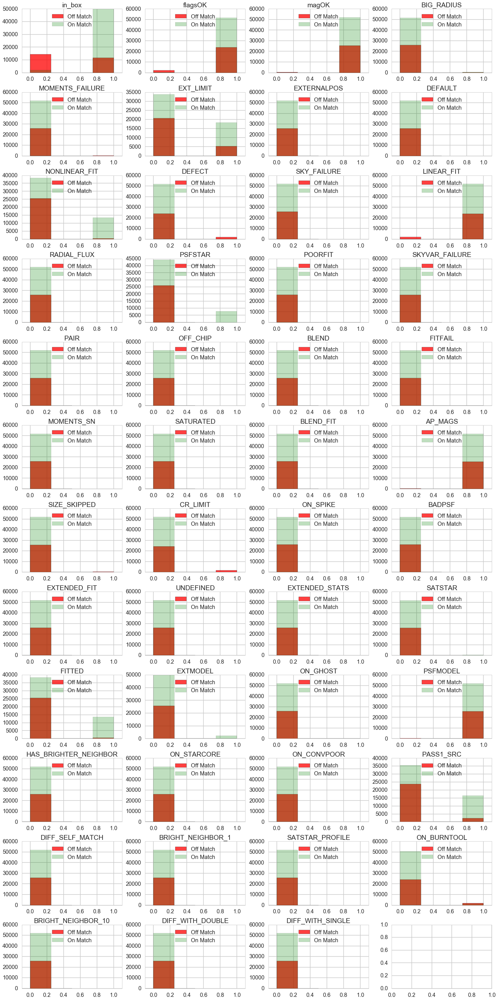

In [340]:
# Stacked histogram plots for indicator features EDA
fig, axes = plt.subplots(nrows=12, ncols=4, figsize=(20, 40), tight_layout=True)
colors=["r","g"]
labels=["Off Match", "On Match"]
alphas=[.75, .25]
for ax, ind in zip(axes.ravel(), INDICATORS):
    for r in [0, 1]:
        color = colors[r]
        label = labels[r]
        alpha = alphas[r]
        mask_r = newdf.on_match == r
        ax.hist(newdf[mask_r][ind].values, bins=4, color=color, alpha=alpha, label=label, stacked=True)
        ax.set_title(ind)
        ax.set_xlim([-.1,1.1])
        ax.legend(loc='upper center')

The KDE plot for indicator variables suggests that inBox and flagsOK indicators (which we defined) are indeed good separators.  Also, FITTED, PASS1_SRC, DEFECT, LINEAR_FIT, PSFSTAR, and NONLINEAR_FIT might be good.

We can look at how many good (on_match) detections there are by chip:

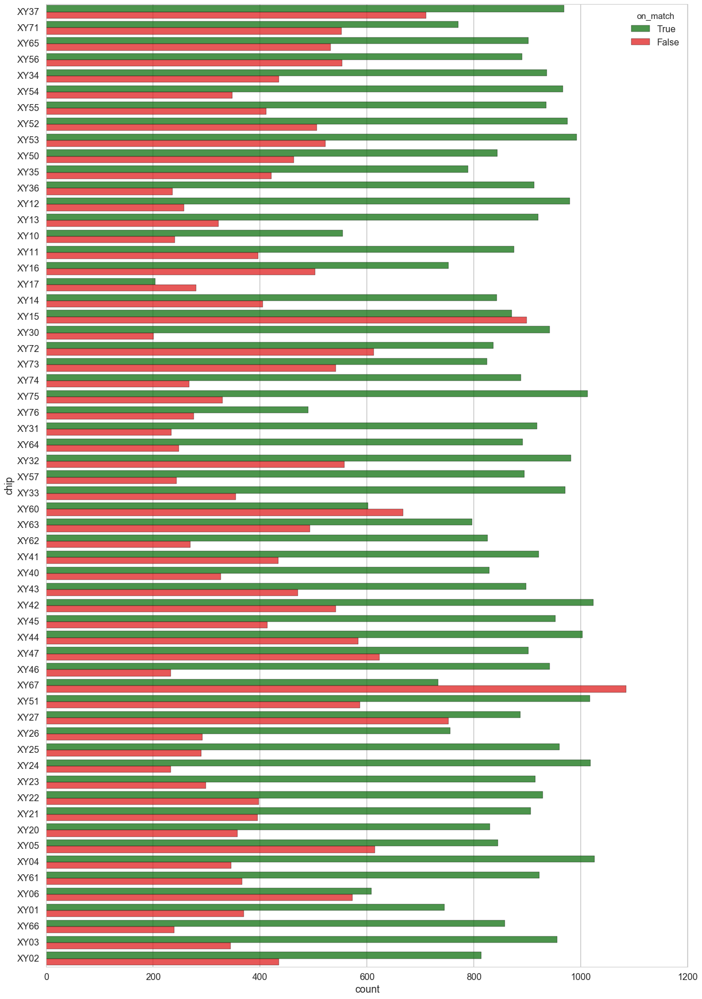

In [341]:
#ax=plt.figure(figsize=(20,30))
dims = (20, 30)
fig, ax = plt.subplots(figsize=dims)

colors=["g","r"]
labels=["On Match", "Off Match"]
alphas=[.75, .25]
sns.countplot(y='chip', hue='on_match', data=newdf, palette=colors, alpha=0.75, ax=ax)


Chips XY60, XY65, XY67, XY51, and XY27 generate a large number of unmatched detections.

And we can look at the individual chips for other structure, after applying a few cuts.

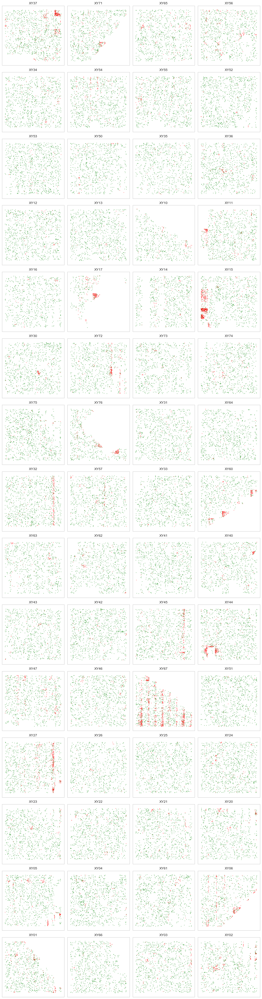

In [342]:
sns.set_style("whitegrid")
sns.set_context("poster")
# Looking at individual chips
gs = gridspec.GridSpec(20, 3,
                       width_ratios=[1,1],
                       height_ratios=[1,1]
                       )

from itertools import product 

colors=["r","g"]
labels=["Off Match", "On Match"]
alphas=[.5, .5]

#plt.close('all')
fig = plt.figure()

nrows = 15
ncols = 4
gs = gridspec.GridSpec(nrows, ncols)
#ax = plt.subplot(gs[0, 0])
        
colors=["r","g"]
#fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 40), tight_layout=True)
for chip, (c, d) in zip(chip_dict.keys(), product(range(nrows), range(ncols))):
    ax = plt.subplot(gs[c, d])
    #print chip, c, d
    x = newdf[newdf.chip==chip].X_PSF
    y = newdf[newdf.chip==chip].Y_PSF
    for r in [0, 1]:
        color = colors[r]
        label = labels[r]
        alpha = alphas[r]
        mask_r = newdf.on_match == r
        mask_r = mask_r \
                & (newdf.flagsOK) \
                & (newdf.in_box) & (newdf.magOK) \
                & (newdf.PSF_QF_PERFECT > 0.85) \
                & (newdf.snr >= 5)
        ax.scatter(x[mask_r], y[mask_r], color=color, alpha=alpha, s=2.0)
        ax.set_title(chip, fontsize=12)
        #ax.legend(loc='upper center')
        ax.get_xaxis().set_ticks([])
        ax.get_yaxis().set_ticks([])
        
gs.tight_layout(fig, rect=[0, 0, 1.0, 5.5])

It appears that there are couple of remaining types of common false detections after these cuts. These are chip specific.

* There are some additional columns and rows that are predominantly bad.
* There are some sub-cells that are almost entirely bad.

And then there are some other features that seem to be connected to internal reflections, or something like that.

## Making masks 
Here are some steps for generating masks of bad detector regions:

* Generate a list of smf files

* Open each file in sequence

* Call smf2pandas to get the chip dictionaries

* Loop through the chips to update the bad pixel masks--this is just recording how many detections in each region are on_known or not.

The bad pixel masks might be very large (1.4 Gigapixels) if kept at full resolution.  The challenge is doing that in a manageable way.

In [343]:
# Generate a list of smf data files
from os import listdir
from os.path import isfile, join
mypath = 'data/'
smffiles = [join(mypath, f) for f in listdir(mypath) if isfile(join(mypath, f)) & f.endswith('.smf')]

In [344]:
%%time
# Open those files in sequence
chip_dict_list = []
#df_list = []
for i, smf in enumerate(smffiles[0:20]):
    print i, smf
    chip_dict, df = smf2pandas(smf, FLAGS_dict=FLAGS_dict, FLAGS2_dict=FLAGS2_dict)
    chip_dict_list.append(chip_dict)
    #df_list.append(df)

0 data/o5895g0004o.424868.cm.333484.n.smf
y 5.754165 6.050334 55895.1872537
1 data/o5895g0005o.424869.cm.333488.n.smf
y 5.961855 3.216078 55895.1877649
2 data/o5895g0006o.424870.cm.333490.n.smf
y 8.291938 4.858724 55895.1882521
3 data/o5895g0007o.424871.cm.333491.n.smf
y 7.934674 7.717781 55895.1887406
4 data/o5895g0008o.424872.cm.333493.n.smf
y 7.734742 10.346359 55895.1892276
5 data/o5895g0009o.424873.cm.333497.n.smf
y 10.409221 9.305576 55895.189715
6 data/o5895g0010o.424874.cm.333498.n.smf
y 10.440059 12.06408 55895.1902009
7 data/o5895g0011o.424875.cm.333502.n.smf
y 5.754177 6.050339 55895.1907902
8 data/o5895g0012o.424876.cm.333500.n.smf
y 5.96185 3.216068 55895.1913137
9 data/o5895g0013o.424878.cm.333503.n.smf
y 8.291928 4.858725 55895.191806
10 data/o5895g0014o.424877.cm.333505.n.smf
y 7.934678 7.717775 55895.1922966
11 data/o5895g0015o.424879.cm.333507.n.smf
y 7.734749 10.346357 55895.1927884
12 data/o5895g0016o.424880.cm.333506.n.smf
y 10.409223 9.305568 55895.1933765
13 data

KeyboardInterrupt: 

In [72]:
%%time
# This routine is iterating over a large sample of exposures in the chip_dict_list.
# It takes all of the detections that do not coincide with a known star and figures
# out which chip cell the detection belongs to.  It then tallies up those counts.
#
# Note: an earlier version of this routine was not accounting for possible bursts 
# of detections in a single exposure.  Now it is by taking the median rate over many 
# exposures are representative.
#
cells_dict = collections.defaultdict(lambda: np.array([], dtype=np.int32))
for chip_dict in chip_dict_list:
    for chip, df in chip_dict.iteritems():
        cell_array = np.zeros((8, 8), dtype=np.int32)
        # Need to add the MPs here
        x = df[(df.on_star == False)].X_PSF.values
        y = df[(df.on_star == False)].Y_PSF.values
        for (cx, cy) in np.nditer(whichCell(x, y)):
            cx = int(cx)
            cy = int(cy)
            cell_array[cx, cy] += 1
        #cells_dict[chip] += cell_array
        cells_dict[chip] = np.append(cells_dict[chip], cell_array)

CPU times: user 4.32 s, sys: 10.3 ms, total: 4.33 s
Wall time: 4.33 s


In [73]:
for chip, val in cells_dict.iteritems():
    cells_dict[chip] = np.median(cells_dict[chip].reshape((len(chip_dict_list),8,8)), axis=0)

In [74]:
# We saved a version that was produced from 200 smf files.
import json
with open('cells_dict_200_med.json', 'r') as fp:
    cells_dict_tosave = json.load(fp)
   
cells_dict = {}
for chip, v in cells_dict_tosave.iteritems():
    cells_dict[chip] = np.array(v)

The median number of counts in each cell of a good chip looks like this:

In [75]:
cells_dict['XY33']

array([[  4. ,   3. ,   3. ,   5. ,   8. ,  13. ,   5. ,   3. ],
       [  5. ,   3. ,   4. ,   6. ,   8.5,  13. ,   6. ,   5. ],
       [  7. ,   4. ,   3. ,  12. ,   9. ,  14. ,   7. ,   6. ],
       [  6.5,   4. ,   4. ,   8. ,  10. ,  12. ,   8. ,   7. ],
       [  6. ,   4. ,   5. ,   9. ,  12. ,  12. ,   5. ,   4. ],
       [  5. ,   5. ,   4. ,   7. ,  11. ,  13. ,   5. ,   6. ],
       [  5. ,   5. ,   3. ,   9. ,  12. ,  12. ,   3. ,   7. ],
       [  5. ,   4. ,   7. ,   4. ,   8. ,  11. ,   3. ,  12. ]])

The median number of counts in each cell of a bad chip looks like this:

In [76]:
cells_dict['XY67']

array([[ 95. ,  33.5,  40.5,  69. ,  23. ,  47. ,  73. ,  31. ],
       [ 52. ,  17. ,  16. ,  40. ,  13. ,  22. ,  40.5,  16. ],
       [ 62. ,  24.5,  34. ,  32. ,  27. ,  23. ,  13. ,   0. ],
       [ 25.5,  36. ,  20. ,  28. ,  14. ,  17. ,   0. ,   0. ],
       [ 18. ,  16. ,  17. ,  26. ,  11. ,   0. ,   0. ,   0. ],
       [ 13. ,  12. ,  17. ,   0. ,   0. ,   0. ,   0. ,   0. ],
       [  4.5,  31. ,   0. ,   0. ,   0. ,   0. ,   0. ,   0. ],
       [  0. ,   0. ,   0. ,   0. ,   0. ,   0. ,   0. ,   0. ]])

Let's figure out what the distribution of the median detection count looks like.

In [77]:
cells_vec = np.empty([0])
for chip, v in cells_dict.iteritems():
    cells_vec = np.append(cells_vec, v.flatten())

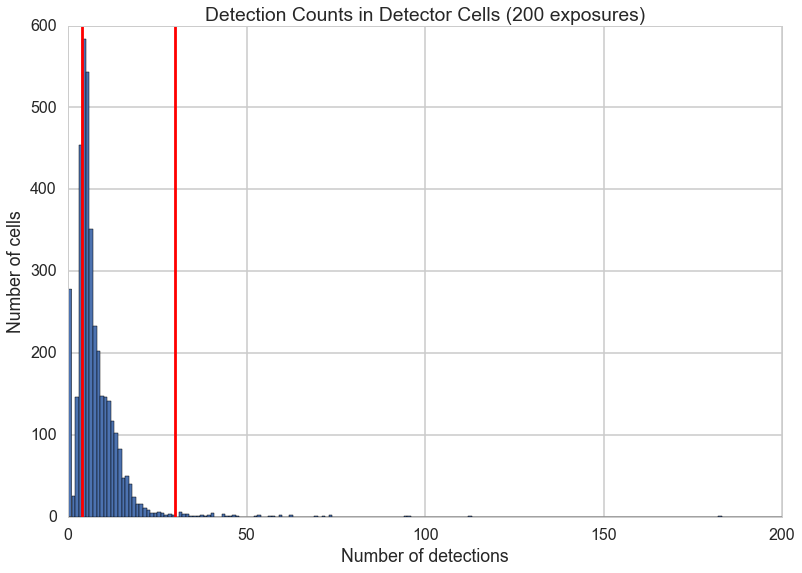

In [78]:
n, nbins, patches = plt.hist(cells_vec, bins=int(cells_vec.max()))
plt.title("Detection Counts in Detector Cells (200 exposures)")
plt.axvline(4, color='red')
plt.axvline(30, color='red')
plt.xlim(0, 200)
plt.xlabel("Number of detections")
plt.ylabel("Number of cells")

In [79]:
for chip, v in cells_dict.iteritems():
    print "%s %10d %10d %10d" % (chip, v.sum(), np.median(v), v.max())
    print chip, np.unravel_index(np.argmax(v), (8, 8))

XY62        312          4         14
XY62 (7, 7)
XY65        567          6         22
XY65 (4, 5)
XY11        635          5        182
XY11 (4, 0)
XY56        455          6         25
XY56 (6, 0)
XY34        425          6         18
XY34 (4, 7)
XY54        410          6         16
XY54 (6, 3)
XY55        430          6         14
XY55 (6, 0)
XY52        528          8         17
XY52 (4, 1)
XY53        604         10         16
XY53 (4, 3)
XY50        467          7         14
XY50 (7, 0)
XY35        465          6         17
XY35 (5, 6)
XY36        282          4         14
XY36 (2, 7)
XY12        332          4         18
XY12 (7, 5)
XY13        364          4         14
XY13 (1, 3)
XY10        261          3         21
XY10 (4, 3)
XY37        560          7         71
XY37 (7, 7)
XY16        508          7         15
XY16 (2, 5)
XY17        309          0         73
XY17 (5, 3)
XY14        339          4         15
XY14 (6, 2)
XY15       1059          5        309
XY15 (4, 0)


In [80]:
nbins[np.argmax(n)], np.mean(cells_vec), np.median(cells_vec), np.std(cells_vec)

(4.0, 7.2039062500000002, 5.0, 9.366702458685463)

The mode cell count is 4, the mean is 7, the median is 5, and the standard deviation is 9.  Guided by these numbers, we somewhat arbitrarily set a threshold of 30 in the median count rate.  Values above this indicate a cell that consistently generates an outlier number of unmatched detections.  That defines a bad detector cell.

In [81]:
# How many bad cells are there in total?
count_thresh=30
print (cells_vec > count_thresh).sum(), 'bad cells out of ', cells_vec.shape[0], 'total cells.'
print cells_vec[cells_vec>count_thresh].sum(), "bad cell detections out of ", \
    cells_vec.sum(), "total detections "
print "for a fraction of: ", cells_vec[cells_vec>count_thresh].sum() / cells_vec.sum()

51 bad cells out of  3840 total cells.
2995.0 bad cell detections out of  27663.0 total detections 
for a fraction of:  0.108267360735


This implies that about 2% of the cells are defective and that these defective cells account for 10% of the total **unmatched** detections.

In [82]:
print "The bad cells are: "
bad_cell_dict=collections.defaultdict(bool)
for chip, v in cells_dict.iteritems():
    high_cells = np.where(v>count_thresh)
    indices = zip(*high_cells)
    for cx, cy in indices:
        bad_cell_dict[(chip,(cx,cy))] = True
        print chip, cx, cy

def in_bad_cell(chip, x, y, bad_cell_dict=bad_cell_dict):
    return bad_cell_dict[(chip, whichCell(x,y))]

print 'position 100, 100 in chip XY67 is bad: ', in_bad_cell('XY67', 100, 100)

The bad cells are: 
XY11 2 0
XY11 3 0
XY11 4 0
XY37 4 7
XY37 7 7
XY17 5 3
XY17 7 2
XY15 0 1
XY15 1 0
XY15 2 0
XY15 4 0
XY15 5 0
XY72 3 5
XY76 1 5
XY76 2 3
XY32 7 6
XY57 7 0
XY60 2 3
XY60 5 7
XY71 2 4
XY45 2 6
XY45 7 6
XY44 1 0
XY44 1 2
XY44 2 1
XY67 0 0
XY67 0 1
XY67 0 2
XY67 0 3
XY67 0 5
XY67 0 6
XY67 0 7
XY67 1 0
XY67 1 3
XY67 1 6
XY67 2 0
XY67 2 2
XY67 2 3
XY67 3 1
XY67 6 1
XY27 0 6
XY27 3 6
XY27 4 6
XY27 5 6
XY27 6 6
XY27 7 4
XY27 7 6
XY05 1 7
XY06 0 0
XY06 1 3
XY06 2 4
position 100, 100 in chip XY67 is bad:  True


In [83]:
good_cell_mask = np.array(map(lambda (c, x, y): not(in_bad_cell(c, x, y)), zip(newdf['chip'], newdf['X_PSF'], newdf['Y_PSF'])))

In [84]:
float((~good_cell_mask).sum())/good_cell_mask.shape[0]

0.052521696413951206

That is, about 5% of the **total** detections, including both the **matched** and **unmatched** detections, fall in a bad cell.

In [85]:
newdf['cell_good'] = pd.Series(good_cell_mask, index=newdf.index)

In [86]:
newdf[0:5]

,AP_MAG,AP_MAG_RADIUS,AP_MAG_RAW,CAL_PSF_MAG,CAL_PSF_MAG_SIG,CR_NSIGMA,DEC_PSF,EXT_NSIGMA,FLAGS,FLAGS2,IPP_IDET,KRON_FLUX,KRON_FLUX_ERR,KRON_FLUX_INNER,KRON_FLUX_OUTER,MOMENTS_M3C,MOMENTS_M3S,MOMENTS_M4C,MOMENTS_M4S,MOMENTS_R1,MOMENTS_RH,MOMENTS_XX,MOMENTS_XY,MOMENTS_YY,N_FRAMES,PADDING,PADDING2,PEAK_FLUX_AS_MAG,PLTSCALE,POSANGLE,PSF_CHISQ,PSF_INST_FLUX,PSF_INST_FLUX_SIG,PSF_INST_MAG,PSF_INST_MAG_SIG,PSF_MAJOR,PSF_MINOR,PSF_NDOF,PSF_NPIX,PSF_QF,PSF_QF_PERFECT,PSF_THETA,RA_PSF,SKY,SKY_SIGMA,X_PSF,X_PSF_SIG,Y_PSF,Y_PSF_SIG,mp_dec_rate,mp_desig,mp_mag,mp_prox,mp_ra_rate,on_star,chip,filterID,mag,snr,fwhm,psf_extent,BIG_RADIUS,MOMENTS_FAILURE,EXT_LIMIT,EXTERNALPOS,DEFAULT,NONLINEAR_FIT,DEFECT,SKY_FAILURE,LINEAR_FIT,RADIAL_FLUX,PSFSTAR,POORFIT,SKYVAR_FAILURE,PAIR,OFF_CHIP,BLEND,FITFAIL,MOMENTS_SN,SATURATED,BLEND_FIT,AP_MAGS,SIZE_SKIPPED,CR_LIMIT,ON_SPIKE,BADPSF,EXTENDED_FIT,UNDEFINED,EXTENDED_STATS,SATSTAR,FITTED,EXTMODEL,ON_GHOST,PSFMODEL,HAS_BRIGHTER_NEIGHBOR,ON_STARCORE,ON_CONVPOOR,PASS1_SRC,DIFF_SELF_MATCH,BRIGHT_NEIGHBOR_1,SATSTAR_PROFILE,ON_BURNTOOL,BRIGHT_NEIGHBOR_10,DIFF_WITH_DOUBLE,DIFF_WITH_SINGLE,MATCHED,flagsOK,in_box,magOK,qfpOK,on_match,on_faulty,cell_good
0,-16.105915,8,-15.989053,11.544366,0.015625,NaN,5.188569,23.870026,640696327,128,0,2771294.25000,2088.662354,794063.500000,183158.296875,0.193679,-1.979877,0.660624,0.040192,5.168977,1.999534,5.839915,-0.347463,11.006875,0,0,0,-11.385881,0.255615,-44.986790,821271.8125,1693271.125000,1653.803101,-15.571816,0.000977,2.270140,1.697595,2703,2704,0.998480,0.998480,0.573213,4.755702,276.657104,17.481617,1575.474365,0.002078,2030.260132,0.002078,NaN,None,NaN,NaN,NaN,1,XY37,y,11.544366,1112.147383,1.181637,4.084059,True,False,True,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,True,True,False,True,False,False,False,True,False,False,False,False,False,False,False,False,True,True,True,True,True,False,True
1,-14.943736,8,-14.826873,12.057705,0.015625,NaN,5.153399,4.367692,103825415,128,1,987895.87500,1202.969482,211830.859375,76612.031250,0.269641,-0.458750,0.035072,-0.042921,3.854464,1.843775,5.546052,-0.261767,5.475727,0,0,0,-11.348567,0.255725,-44.969368,69091.5625,1055336.250000,1273.284912,-15.058477,0.001207,2.101094,1.628697,2690,2691,0.958371,0.958371,45.229836,4.835621,277.131989,17.105103,2631.537598,0.002567,2647.817383,0.002567,NaN,None,NaN,NaN,NaN,1,XY37,y,12.057705,900.390413,1.113961,2.978996,True,False,True,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,True,True,False,True,False,False,False,True,False,False,False,False,False,False,False,False,True,True,True,True,True,False,True
2,-15.665754,8,-15.548891,12.146197,0.015625,NaN,5.247891,38.314117,103825415,160,2,2104803.50000,1825.540527,879232.437500,309640.843750,-0.308689,-6.184803,-0.249143,0.015020,5.365948,1.728602,8.452147,-0.033962,12.142209,0,0,0,-11.265514,0.255899,-44.971111,1324781.8750,972734.437500,1277.515503,-14.969985,0.001313,2.036710,1.648822,2687,2688,0.993818,0.172318,44.426552,4.895709,277.821533,17.326918,2051.020020,0.002794,4115.729980,0.002794,NaN,None,NaN,NaN,NaN,1,XY37,y,12.146197,827.208689,1.104269,5.528164,True,False,True,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,True,True,False,True,False,False,False,True,False,False,False,True,False,False,False,False,True,True,True,False,True,False,True
3,-14.947728,8,-14.830865,14.733263,0.015625,NaN,5.248050,92.086113,36716545,32,3,409750.28125,1009.182800,602965.250000,259217.578125,-0.365963,-5.953179,-0.996090,-0.090508,2.423606,0.776113,4.258163,0.007898,14.550693,0,0,0,-11.234550,0.255900,-44.971077,1095452.8750,89777.585938,808.500732,-12.382919,0.009006,2.036703,1.648822,2687,2688,0.924442,0.165580,45.077869,4.895940,27

In [87]:
(newdf.on_star == 1).sum(), (newdf.on_star == 0).sum()

(26884, 21972)

In [88]:
(~newdf.cell_good & newdf.on_star).sum(), (~newdf.cell_good & ~newdf.on_star).sum()

(466, 2100)

We see that in bad cells the "on_star" detections are outnumbered by unmatched detections 5 to 1.

In [89]:
(newdf.cell_good & newdf.on_star).sum(), (newdf.cell_good & ~newdf.on_star).sum()

(26418, 19872)

However, in good cells the "on_star" detections outnumber the unmatched detections.

In [90]:
newdf[(newdf.mp_desig !='None')].shape

(73, 113)

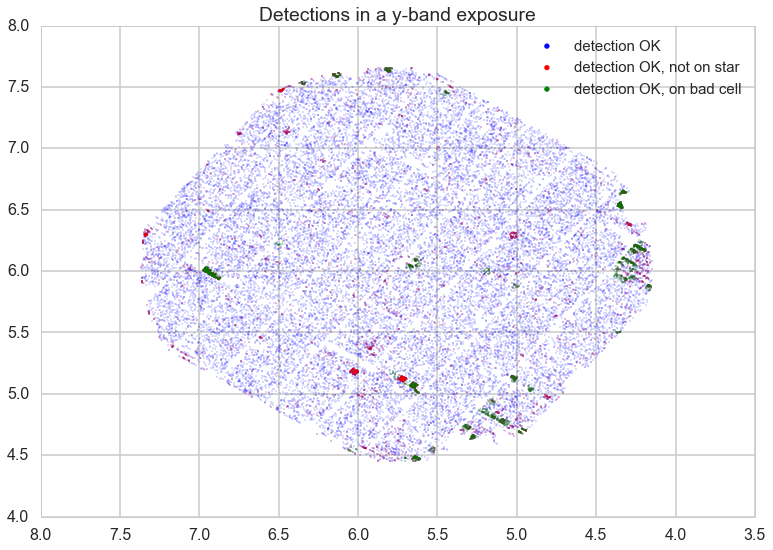

In [91]:
s1 = plt.scatter(newdf[good_mask].RA_PSF, newdf[good_mask].DEC_PSF, s=0.1, color='blue', label='detection OK')
s2 = plt.scatter(newdf[remainder_mask].RA_PSF, newdf[remainder_mask].DEC_PSF, s=0.1, color='red', label='detection OK, not on star')
s3 = plt.scatter(newdf[~good_cell_mask].RA_PSF, newdf[~good_cell_mask].DEC_PSF, s=0.1, color='green', label='detection OK, on bad cell')
plt.title('Detections in a y-band exposure')
leg = plt.legend(markerscale=15, fontsize=15)
plt.gca().invert_xaxis()

This seems to work at the cell level, but it appears that there are some cells that are intermittently bad.  That is, there are some concentrations of red points in the plot above that were not identified in the masking procedure.

Also, it seems like we need finer granularity, because there are some bad rows and columns that are not on the edges of cells.  Would we have enough detections to look for bad rows or columns within the cells?

In [106]:
nDets = 200*100000
nCells = 60*8*8
nCellRows = 60*8*8*600
nDets/nCellRows

8

That's very few detections. So, we would have to process many more images to be able to reliably find bad rows and colums within a cell.

But we can find bad rows and colums within a full chip. 

In [107]:
nRows = 60*600
nDets/nRows

555

We have enough detections to work with.  This is feasible.  

Let's figure out the row and column limits.

In [108]:
x = newdf[(newdf.on_star == False)].X_PSF.values
print x.min(), x.max(), 8*(600+8)-8
y = newdf[(newdf.on_star == False)].Y_PSF.values
print y.min(), y.max(), 8*(600+10)-10

3.11061 4844.72 4856
1.65444 4864.48 4870


In [109]:
%%time
# This routine is also iterating over a large sample of exposures in the chip_dict_list.
# It takes all of the detections that do not coincide with a known star and figures
# out which chip row and column the detection belongs to.  It then tallies up those counts.
#
# Note: this routine is not accounting for possible bursts of detections in a single
# exposure.
#
rows_dict = collections.defaultdict(lambda: np.zeros((4870), dtype=np.int32))
columns_dict = collections.defaultdict(lambda: np.zeros((4870), dtype=np.int32))
for chip_dict in chip_dict_list:
    for chip, df in chip_dict.iteritems():
        row_array = np.zeros((4870), dtype=np.int32)
        column_array = np.zeros((4870), dtype=np.int32)
        # Need to add the MPs here
        x = df[(df.on_star == False)].X_PSF.values
        y = df[(df.on_star == False)].Y_PSF.values
        #x = df.X_PSF.values
        #y = df.Y_PSF.values
        for (cx, cy) in np.nditer((x, y)):
            cx = int(cx)
            cy = int(cy)
            row_array[cy] += 1
            column_array[cx] += 1
        rows_dict[chip] += row_array
        columns_dict[chip] += column_array

CPU times: user 5.45 s, sys: 9.81 ms, total: 5.46 s
Wall time: 5.45 s


In [110]:
import json
with open('rows_dict_200.json', 'r') as fp:
    rows_dict_tosave = json.load(fp)

rows_dict = {}
for chip, v in rows_dict_tosave.iteritems():
    rows_dict[chip] = np.array(v)
    
with open('columns_dict_200.json', 'r') as fp:
    columns_dict_tosave = json.load(fp)

columns_dict = {}
for chip, v in columns_dict_tosave.iteritems():
    columns_dict[chip] = np.array(v)

In [111]:
rows_vec = np.empty([0])
for chip, v in rows_dict.iteritems():
    rows_vec = np.append(rows_vec, v.flatten())
    
columns_vec = np.empty([0])
for chip, v in columns_dict.iteritems():
    columns_vec = np.append(columns_vec, v.flatten())

In [112]:
print "Median row detection count", np.median(rows_vec)
print "Max row detection count   ", rows_vec.max()
print 
print "Median column detection ct", np.median(columns_vec)
print "Max column detection ct   ", columns_vec.max()

Median row detection count 15.0
Max row detection count    5323.0

Median column detection ct 10.0
Max column detection ct    10404.0


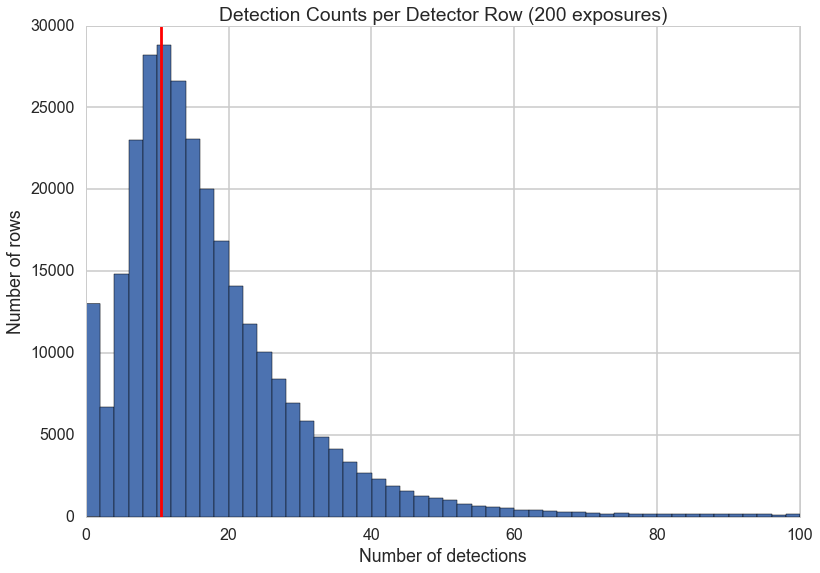

In [113]:
n, nbins, patches = plt.hist(rows_vec, bins=int(rows_vec.max())/2)
plt.title("Detection Counts per Detector Row (200 exposures)")
plt.axvline(nbins[np.argmax(n)]+0.5, color='red')
plt.xlim(0,100)
plt.xlabel("Number of detections")
plt.ylabel("Number of rows")

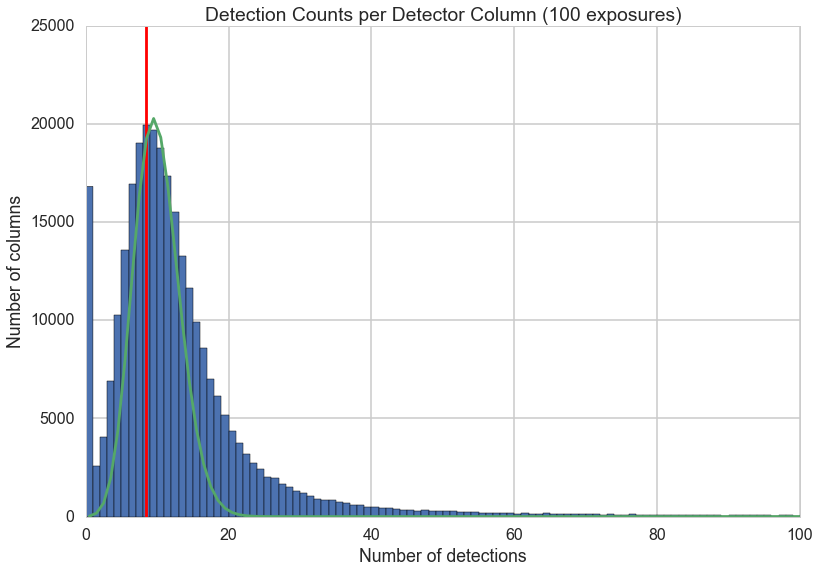

In [114]:
n, nbins, patches = plt.hist(columns_vec, bins=int(columns_vec.max()))
plt.title("Detection Counts per Detector Column (100 exposures)")
plt.axvline(nbins[np.argmax(n)]+0.5, color='red')
#plt.axvline(60, color='red')
plt.xlim(0,100)
#plt.ylim(0,1000)
plt.xlabel("Number of detections")
plt.ylabel("Number of columns")

# I tested and found that this is not well modeled by a single Poisson distribution.  
# The tail is much too broad.  However, since the distribution is summed over a bunch of
# chip the resulting distribution might be the sum of Poisson distributions with different
# means.  The real detections might have similar means across different chips, but the false
# detections might have different rates, since those rates depend up the details of chip
# defects.

nbins
# calculate binmiddles
midbins = 0.5*(nbins[1:] + nbins[:-1])

from scipy.misc import factorial

# poisson function, parameter lamb is the fit parameter
def poisson(k, lamb):
    return (lamb**k/factorial(k)) * np.exp(-lamb)

plt.plot(midbins, 160000.*poisson(midbins, 10))

Guided by the results we set, somewhat arbitrarily, threshold count values to identify bad rows and columns.

In [115]:
row_thresh = 70
column_thresh = 70

In [116]:
#print "The bad rows are: "
bad_row_dict=collections.defaultdict(bool)
for chip, v in rows_dict.iteritems():
    high_rows = np.where(v>row_thresh)
    for row in high_rows[0]:
        #print chip, row
        bad_row_dict[(chip, row)] = True

def in_bad_row(chip, x, y, bad_row_dict=bad_row_dict):
    return bad_row_dict[(chip, int(y))]

#print "The bad columns are: "
bad_column_dict=collections.defaultdict(bool)
for chip, v in columns_dict.iteritems():
    high_columns = np.where(v>column_thresh)
    for column in high_columns[0]:
        #print chip, column
        bad_column_dict[(chip, column)] = True

def in_bad_column(chip, x, y, bad_column_dict=bad_column_dict):
    return bad_column_dict[(chip, int(x))]


print 'position 4, 208 in chip XY03 is bad: ', in_bad_row('XY03', 208, 4)

position 4, 208 in chip XY03 is bad:  True


In [117]:
good_column_mask = np.array(map(lambda (c, x, y): not(in_bad_column(c, x, y)), zip(newdf['chip'], newdf['X_PSF'], newdf['Y_PSF'])))
good_row_mask = np.array(map(lambda (c, x, y): not(in_bad_row(c, x, y)), zip(newdf['chip'], newdf['X_PSF'], newdf['Y_PSF'])))
newdf['row_good'] = pd.Series(good_row_mask, index=newdf.index)
newdf['column_good'] = pd.Series(good_column_mask, index=newdf.index)

# good_mask refers to detections that pass all the various checks
good_mask = flag_mask & magOK_mask & snr_mask & qfp_mask & good_cell_mask & good_column_mask & good_row_mask

# remainder_mask refers to detections that pass all the tests and which are not on a star.
remainder_mask = good_mask & offStar_mask

print float(remainder_mask.sum())/newdf.shape[0]
print remainder_mask.sum()
print (~offStar_mask & good_mask).sum()
print (~offStar_mask).sum()

0.0558989683969
2731
24402
26884


In [118]:
newdf['valid_match'] = newdf.on_match & newdf.row_good & newdf.column_good & newdf.cell_good # FGV: added

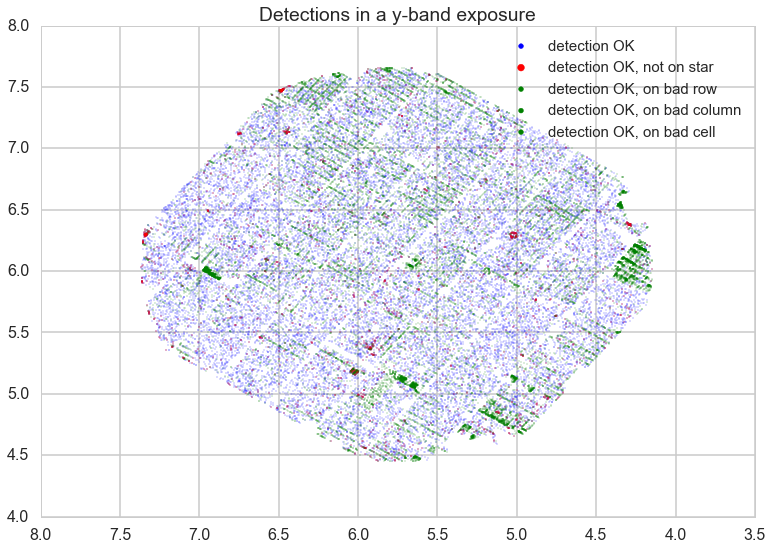

In [119]:
s1 = plt.scatter(newdf[good_mask].RA_PSF, newdf[good_mask].DEC_PSF, s=0.1, color='blue', label='detection OK')
s2 = plt.scatter(newdf[remainder_mask].RA_PSF, newdf[remainder_mask].DEC_PSF, s=0.2, color='red', label='detection OK, not on star')
s3 = plt.scatter(newdf[~good_row_mask].RA_PSF, newdf[~good_row_mask].DEC_PSF, s=0.1, color='green', label='detection OK, on bad row')
s4 = plt.scatter(newdf[~good_column_mask].RA_PSF, newdf[~good_column_mask].DEC_PSF, s=0.1, color='green', label='detection OK, on bad column')
s5 = plt.scatter(newdf[~good_cell_mask].RA_PSF, newdf[~good_cell_mask].DEC_PSF, s=0.1, color='green', label='detection OK, on bad cell')

plt.title('Detections in a y-band exposure')
leg = plt.legend(markerscale=15, fontsize=15)
plt.gca().invert_xaxis()

<a id='model_selection'></a>
## Model Selection

Now that we have explored the data, identified some important features that may distinguish real and false detections, and mapped out bad regions of the detectors, we now proceed with selecting models for classification.

In [120]:
from sklearn.grid_search import GridSearchCV
from sklearn.cross_validation import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import StandardScaler

In [121]:
def cv_optimize(clf, parameters, X, y, n_jobs=1, n_folds=5, score_func=None):
    if score_func:
        gs = GridSearchCV(clf, param_grid=parameters, cv=n_folds, n_jobs=n_jobs, scoring=score_func)
    else:
        gs = GridSearchCV(clf, param_grid=parameters, n_jobs=n_jobs, cv=n_folds)
    
    gs.fit(X, y)
    
    print "BEST", gs.best_params_, gs.best_score_, gs.grid_scores_
    best = gs.best_estimator_
    return best

In [122]:
def do_classify(clf, parameters, indf, featurenames, targetname, target1val, mask=None, score_func=None, n_folds=5, n_jobs=1):
    subdf=indf[featurenames]
    X=subdf.values
    y=(indf[targetname].values==target1val)*1
    
    if mask !=None:
        print "using mask"
        Xtrain, Xtest, ytrain, ytest = X[mask], X[~mask], y[mask], y[~mask]
    
    scaler = StandardScaler()
    Xtrain_scaled = scaler.fit_transform(Xtrain)
    
    if parameters:
        clf = cv_optimize(clf, parameters, Xtrain_scaled, ytrain, n_jobs=n_jobs, n_folds=n_folds, score_func=score_func)
    
    clf=clf.fit(Xtrain, ytrain)
    training_accuracy = clf.score(Xtrain, ytrain)
    test_accuracy = clf.score(Xtest, ytest)
    print "############# based on standard predict ################"
    print "Accuracy on training data: %0.2f" % (training_accuracy)
    print "Accuracy on test data:     %0.2f" % (test_accuracy)
    print confusion_matrix(ytest, clf.predict(Xtest))
    print "########################################################"
    return clf, Xtrain, ytrain, Xtest, ytest

In [123]:
import copy

This is a list of possible features based on the exploratory data analysis above.

In [124]:
# features = ['PSF_QF_PERFECT','snr']
features = ['PSF_QF_PERFECT','snr','CR_LIMIT','PSF_THETA','SKY','X_PSF','X_PSF_SIG',
            'Y_PSF','Y_PSF_SIG','EXT_LIMIT','NONLINEAR_FIT','PASS1_SRC']

# features = ['PSF_QF_PERFECT','snr','CR_LIMIT','PSF_THETA','SKY','X_PSF','X_PSF_SIG','chip',
#             'Y_PSF','Y_PSF_SIG','EXT_LIMIT','NONLINEAR_FIT','PASS1_SRC']

target   = 'valid_match' # Added

In [125]:
# The block below filters out records where the value is NaN
# MJH: it's worth noting that this is just filtering out the records where one of the features
# used for training is NaN.
init = np.ones(newdf.shape[0], dtype='int')

numerical_features = copy.deepcopy(features)

# numerical_features.remove('chip')

for i,feature in enumerate(numerical_features):
    temp_mask = ~np.isnan(newdf[feature])
    
    if i == 0:
        final_mask = init & temp_mask
    else:
        final_mask = final_mask & temp_mask

newdf_nonan = newdf[final_mask]

In [126]:
itrain, itest = train_test_split(xrange(newdf_nonan.shape[0]), train_size=0.6)

mask         = np.ones(newdf_nonan.shape[0], dtype='int')
mask[itrain] = 1
mask[itest]  = 0

mask = (mask == 1)

We now run several classifiers with several possible feature specifications.

In [127]:
from sklearn.linear_model import LogisticRegression

In [128]:
clflog = LogisticRegression(penalty='l1')

# parameters = {"C": [1]}
parameters = {"C": [1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2, 1e3]}

clflog, Xtrain, ytrain, Xtest, ytest=do_classify(clflog, parameters, newdf_nonan, 
                                                 featurenames = features,
                                                 targetname = target, # Edited 
                                                 target1val = 1, 
                                                 mask = mask)

using mask
BEST {'C': 0.1} 0.885741784683 [mean: 0.86711, std: 0.03796, params: {'C': 0.001}, mean: 0.88014, std: 0.03715, params: {'C': 0.01}, mean: 0.88574, std: 0.03329, params: {'C': 0.1}, mean: 0.88560, std: 0.03314, params: {'C': 1.0}, mean: 0.88567, std: 0.03315, params: {'C': 10.0}, mean: 0.88564, std: 0.03310, params: {'C': 100.0}, mean: 0.88557, std: 0.03303, params: {'C': 1000.0}]
############# based on standard predict ################
Accuracy on training data: 0.89
Accuracy on test data:     0.89
[[7856 1559]
 [ 598 9383]]
########################################################


/Users/mholman/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:6: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
/Users/mholman/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:420: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/Users/mholman/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:420: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


In [129]:
print 'snr_thresh =',clflog.coef_[0][0]
print 'qpf_thresh =',clflog.coef_[0][1]

snr_thresh = 9.26770667765
qpf_thresh = 0.00587024708501


In [130]:
from sklearn.svm import SVC

In [132]:
from sklearn.ensemble import GradientBoostingClassifier

In [133]:
%%time
parameters = {'n_estimators': [100],
              'max_depth': [6]}
                  
clfgbc = GradientBoostingClassifier()

clfgbc, Xtrain, ytrain, Xtest, ytest = do_classify(clfgbc, parameters, newdf_nonan, 
                                                   featurenames = features,
                                                   targetname = target,
                                                   target1val = 1, 
                                                   mask = mask)

/Users/mholman/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:6: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
/Users/mholman/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:420: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/Users/mholman/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:420: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


using mask
BEST {'n_estimators': 100, 'max_depth': 6} 0.893578990788 [mean: 0.89358, std: 0.03012, params: {'n_estimators': 100, 'max_depth': 6}]
############# based on standard predict ################
Accuracy on training data: 0.94
Accuracy on test data:     0.91
[[8313 1102]
 [ 599 9382]]
########################################################
CPU times: user 53.4 s, sys: 119 ms, total: 53.5 s
Wall time: 53.5 s


#### Feature importance:
According to the GBC classifier, the most important features appear to be: PSF_QF_PERFECT, X_PSF, X_PSF_SIG, snr, PSF_THETA

In [134]:
clfgbc.feature_importances_

array([ 0.23428689,  0.08907869,  0.0302109 ,  0.12099043,  0.10396491,
        0.11798213,  0.07849163,  0.1085934 ,  0.06299726,  0.04215014,
        0.00053705,  0.01071657])

```features = ['PSF_QF_PERFECT','snr','CR_LIMIT','PSF_THETA','SKY','X_PSF','X_PSF_SIG',
            'Y_PSF','Y_PSF_SIG','EXT_LIMIT','NONLINEAR_FIT','PASS1_SRC']```

In [135]:
from sklearn.metrics import roc_curve, auc
def make_roc(name, clf, ytest, xtest, ax=None, labe=5, proba=True, skip=0):
    initial=False
    if not ax:
        ax=plt.gca()
        initial=True
    if proba:
        fpr, tpr, thresholds=roc_curve(ytest, clf.predict_proba(xtest)[:,1])
    else:
        fpr, tpr, thresholds=roc_curve(ytest, clf.decision_function(xtest))
    roc_auc = auc(fpr, tpr)
    if skip:
        l=fpr.shape[0]
        ax.plot(fpr[0:l:skip], tpr[0:l:skip], '.-', alpha=0.3, label='ROC curve for %s (area = %0.2f)' % (name, roc_auc))
    else:
        ax.plot(fpr, tpr, '.-', alpha=0.3, label='ROC curve for %s (area = %0.2f)' % (name, roc_auc))
    label_kwargs = {}
    label_kwargs['bbox'] = dict(
        boxstyle='round,pad=0.3', alpha=0.2,
    )
    if labe!=None:
        for k in xrange(0, fpr.shape[0],labe):
            threshold = str(np.round(thresholds[k], 2))
            ax.annotate(threshold, (fpr[k], tpr[k]), **label_kwargs)
    if initial:
        ax.plot([0, 1], [0, 1], 'k--')
        ax.set_xlim([0.0, 1.0])
        ax.set_ylim([0.0, 1.05])
        ax.set_xlabel('False Positive Rate')
        ax.set_ylabel('True Positive Rate')
        ax.set_title('ROC')
    ax.legend(loc="lower right")
    return ax

In [136]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

For the decision tree, at least, it seems like there are only really four classifiers that make a difference. The others all contain roughly the same information.

In [137]:
%%time
clftree = DecisionTreeClassifier(random_state = 0)
tree_params = {"max_depth": range(1,11), "min_samples_split": [1, 5, 10, 50]}
tree_features = ['PSF_QF_PERFECT','snr', "PASS1_SRC", "CR_LIMIT"]
clftree, Xtrain_tree, ytrain_tree, Xtest_tree, ytest_tree=do_classify(clftree, tree_params, newdf_nonan, 
                                                                     featurenames = tree_features,
                                                                     targetname = 'on_match', 
                                                                     target1val = 1, 
                                                                     mask = mask)

using mask
BEST {'min_samples_split': 10, 'max_depth': 8} 0.895194555204 [mean: 0.83415, std: 0.02176, params: {'min_samples_split': 1, 'max_depth': 1}, mean: 0.83415, std: 0.02176, params: {'min_samples_split': 5, 'max_depth': 1}, mean: 0.83415, std: 0.02176, params: {'min_samples_split': 10, 'max_depth': 1}, mean: 0.83415, std: 0.02176, params: {'min_samples_split': 50, 'max_depth': 1}, mean: 0.87117, std: 0.01974, params: {'min_samples_split': 1, 'max_depth': 2}, mean: 0.87117, std: 0.01974, params: {'min_samples_split': 5, 'max_depth': 2}, mean: 0.87117, std: 0.01974, params: {'min_samples_split': 10, 'max_depth': 2}, mean: 0.87117, std: 0.01974, params: {'min_samples_split': 50, 'max_depth': 2}, mean: 0.87732, std: 0.02340, params: {'min_samples_split': 1, 'max_depth': 3}, mean: 0.87732, std: 0.02340, params: {'min_samples_split': 5, 'max_depth': 3}, mean: 0.87732, std: 0.02340, params: {'min_samples_split': 10, 'max_depth': 3}, mean: 0.87732, std: 0.02340, params: {'min_samples_s

/Users/mholman/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:6: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
/Users/mholman/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:420: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/Users/mholman/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:420: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


In [138]:
%%time
clfforest = RandomForestClassifier()
forest_params = {"n_estimators": [5, 10, 20, 25, 50], "max_depth": range(1,11), "min_samples_split": [1, 5, 10, 50]}
clfforest, Xtrain_tree, ytrain_tree, Xtest_tree, ytest_tree=do_classify(clfforest, forest_params, newdf_nonan, 
                                                                         featurenames = tree_features,
                                                                         targetname = 'on_match', 
                                                                         target1val = 1, 
                                                                         mask = mask)

using mask
BEST {'min_samples_split': 5, 'n_estimators': 50, 'max_depth': 8} 0.898597552592 [mean: 0.83552, std: 0.02201, params: {'min_samples_split': 1, 'n_estimators': 5, 'max_depth': 1}, mean: 0.84123, std: 0.02394, params: {'min_samples_split': 1, 'n_estimators': 10, 'max_depth': 1}, mean: 0.84291, std: 0.01423, params: {'min_samples_split': 1, 'n_estimators': 20, 'max_depth': 1}, mean: 0.85786, std: 0.02601, params: {'min_samples_split': 1, 'n_estimators': 25, 'max_depth': 1}, mean: 0.85336, std: 0.01864, params: {'min_samples_split': 1, 'n_estimators': 50, 'max_depth': 1}, mean: 0.84343, std: 0.02376, params: {'min_samples_split': 5, 'n_estimators': 5, 'max_depth': 1}, mean: 0.84882, std: 0.02533, params: {'min_samples_split': 5, 'n_estimators': 10, 'max_depth': 1}, mean: 0.85322, std: 0.01947, params: {'min_samples_split': 5, 'n_estimators': 20, 'max_depth': 1}, mean: 0.84267, std: 0.01773, params: {'min_samples_split': 5, 'n_estimators': 25, 'max_depth': 1}, mean: 0.85467, std

/Users/mholman/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:6: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
/Users/mholman/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:420: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/Users/mholman/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:420: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


Increasing the number of features was really critical for getting a better fit! Critically, it cut the number of false negatives by a lot (over 3000 for the `features` matrix vs about 2700 for the `tree_features` feature set) at the cost of only a few more false positives (about a hundred). This is a huge improvement!

Here, I make a visualization of the tree. I needed to type

> pip install pydot2

at the command line. **Make sure you are not using pydot**. Make sure you upgrade it as well to the most recent version. You also might need to install pyparser first. To do so, use

> pip install pyparsing

And then upgrade. *I cannot emphasize enough that this will not work if you do not upgrade.*

You may also need to install graphviz:

> brew install graphviz

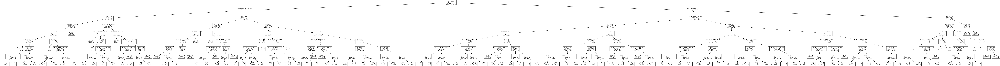

In [140]:
from StringIO import StringIO  
import pyparsing
import pydot
from IPython.display import Image  
from sklearn import tree
import subprocess
dot_data = StringIO()  
out = tree.export_graphviz(clftree, out_file=dot_data,feature_names=tree_features)  
graph = pydot.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())  

In [141]:
def get_code(tree, feature_names, target_names,
             spacer_base="    "):
    """Produce psuedo-code for decision tree.

    Args
    ----
    tree -- scikit-leant DescisionTree.
    feature_names -- list of feature names.
    target_names -- list of target (class) names.
    spacer_base -- used for spacing code (default: "    ").

    Notes
    -----
    based on http://stackoverflow.com/a/30104792.
    """
    left      = tree.tree_.children_left
    right     = tree.tree_.children_right
    threshold = tree.tree_.threshold
    features  = [feature_names[i] for i in tree.tree_.feature]
    value = tree.tree_.value

    def recurse(left, right, threshold, features, node, depth):
        spacer = spacer_base * depth
        if (threshold[node] != -2):
            print(spacer + "if ( " + features[node] + " <= " + \
                  str(threshold[node]) + " ) {")
            if left[node] != -1:
                    recurse(left, right, threshold, features,
                            left[node], depth+1)
            print(spacer + "}\n" + spacer +"else {")
            if right[node] != -1:
                    recurse(left, right, threshold, features,
                            right[node], depth+1)
            print(spacer + "}")
        else:
            target = value[node]
            for i, v in zip(np.nonzero(target)[1],
                            target[np.nonzero(target)]):
                target_name = target_names[i]
                target_count = int(v)
                print(spacer + "return " + str(target_name) + \
                      " ( " + str(target_count) + " examples )")

    recurse(left, right, threshold, features, 0, 0)

In [142]:
get_code(clftree, tree_features, ["observation", "false"])

if ( snr <= 6.01852750778 ) {
    if ( PSF_QF_PERFECT <= 0.9547483325 ) {
        if ( snr <= 4.88423538208 ) {
            if ( PASS1_SRC <= 0.5 ) {
                if ( snr <= 3.73568940163 ) {
                    if ( PSF_QF_PERFECT <= 0.18119995296 ) {
                        return observation ( 6 examples )
                        return false ( 1 examples )
                    }
                    else {
                        if ( snr <= 1.72494876385 ) {
                            if ( PSF_QF_PERFECT <= 0.747687935829 ) {
                                return observation ( 17 examples )
                            }
                            else {
                                return false ( 1 examples )
                            }
                        }
                        else {
                            if ( PSF_QF_PERFECT <= 0.816305994987 ) {
                                return observation ( 1790 examples )
                                return fal

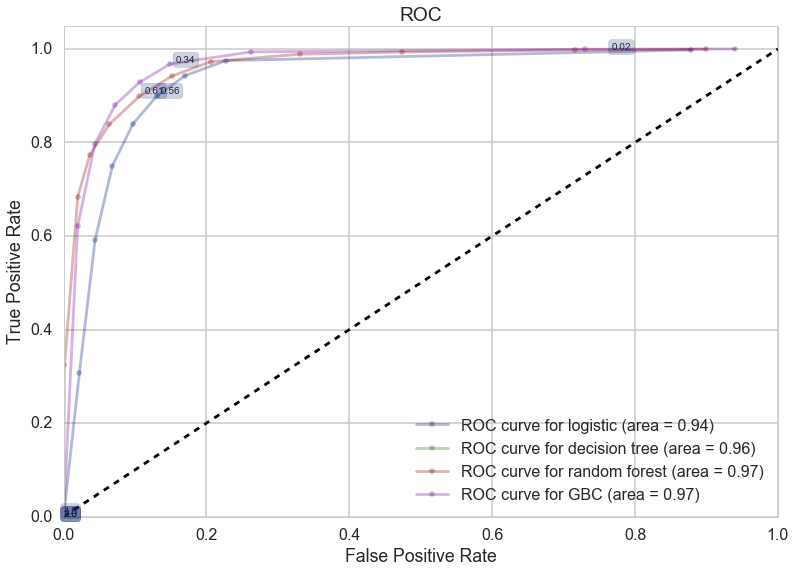

In [145]:
with sns.color_palette("dark"):
    ax = make_roc("logistic",clflog, ytest, Xtest, None, labe=2050, proba=True,  skip=400)

    #make_roc("svm",clfsvm, ytest, Xtest, ax=ax, labe=2050, proba=False, skip=400)
    
    make_roc("decision tree",clftree, ytest_tree, Xtest_tree, ax=ax, labe=2050, proba=True,  skip=400)
    make_roc("random forest",clfforest, ytest_tree, Xtest_tree, ax=ax, labe=2050, proba=True,  skip=400)
    
    make_roc("GBC",clfgbc, ytest, Xtest, ax=ax, labe=2050, proba=True,  skip=400)

In [146]:
from sklearn.pipeline import Pipeline

from sklearn.feature_selection import SelectFpr
from sklearn.feature_selection import f_classif

fprselector = SelectFpr(score_func = f_classif, alpha = 0.05)

In [147]:
%%time
pipe_params = {'log__C': [1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2, 1e3]}

pipelog = Pipeline([('selector', fprselector),
                     ('log', LogisticRegression(penalty='l2'))])
                                 
pipelog1,Xtrain, ytrain, Xtest, ytest = do_classify(pipelog, pipe_params, newdf_nonan, 
                                                 featurenames = features,
                                                 targetname = target,
                                                 target1val = 1, 
                                                 mask = mask)

/Users/mholman/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:6: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
/Users/mholman/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:420: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/Users/mholman/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:420: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


using mask
BEST {'log__C': 10.0} 0.884401209955 [mean: 0.86986, std: 0.03918, params: {'log__C': 0.001}, mean: 0.87608, std: 0.03701, params: {'log__C': 0.01}, mean: 0.88368, std: 0.03427, params: {'log__C': 0.1}, mean: 0.88426, std: 0.03299, params: {'log__C': 1.0}, mean: 0.88440, std: 0.03261, params: {'log__C': 10.0}, mean: 0.88430, std: 0.03244, params: {'log__C': 100.0}, mean: 0.88419, std: 0.03238, params: {'log__C': 1000.0}]
############# based on standard predict ################
Accuracy on training data: 0.89
Accuracy on test data:     0.89
[[7829 1586]
 [ 594 9387]]
########################################################
CPU times: user 3.58 s, sys: 180 ms, total: 3.76 s
Wall time: 3.75 s


In [148]:
%%time
pipe_params = {'gbc__n_estimators': [20,30,40,50],
               'gbc__max_depth': [3,4,5]}

pipegbc = Pipeline([('selector', fprselector),
                     ('gbc', GradientBoostingClassifier())])
                                 
pipegbc1, Xtrain, ytrain, Xtest, ytest = do_classify(pipegbc, pipe_params, newdf_nonan, 
                                                     featurenames = features,
                                                     targetname = target,
                                                     target1val = 1, 
                                                     mask = mask)

/Users/mholman/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:6: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
/Users/mholman/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:420: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/Users/mholman/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:420: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


using mask
BEST {'gbc__max_depth': 4, 'gbc__n_estimators': 50} 0.895985150557 [mean: 0.89251, std: 0.02699, params: {'gbc__max_depth': 3, 'gbc__n_estimators': 20}, mean: 0.89471, std: 0.02637, params: {'gbc__max_depth': 3, 'gbc__n_estimators': 30}, mean: 0.89523, std: 0.02688, params: {'gbc__max_depth': 3, 'gbc__n_estimators': 40}, mean: 0.89468, std: 0.02666, params: {'gbc__max_depth': 3, 'gbc__n_estimators': 50}, mean: 0.89509, std: 0.02776, params: {'gbc__max_depth': 4, 'gbc__n_estimators': 20}, mean: 0.89537, std: 0.02825, params: {'gbc__max_depth': 4, 'gbc__n_estimators': 30}, mean: 0.89588, std: 0.02844, params: {'gbc__max_depth': 4, 'gbc__n_estimators': 40}, mean: 0.89599, std: 0.02809, params: {'gbc__max_depth': 4, 'gbc__n_estimators': 50}, mean: 0.89361, std: 0.02859, params: {'gbc__max_depth': 5, 'gbc__n_estimators': 20}, mean: 0.89337, std: 0.02876, params: {'gbc__max_depth': 5, 'gbc__n_estimators': 30}, mean: 0.89368, std: 0.02863, params: {'gbc__max_depth': 5, 'gbc__n_esti

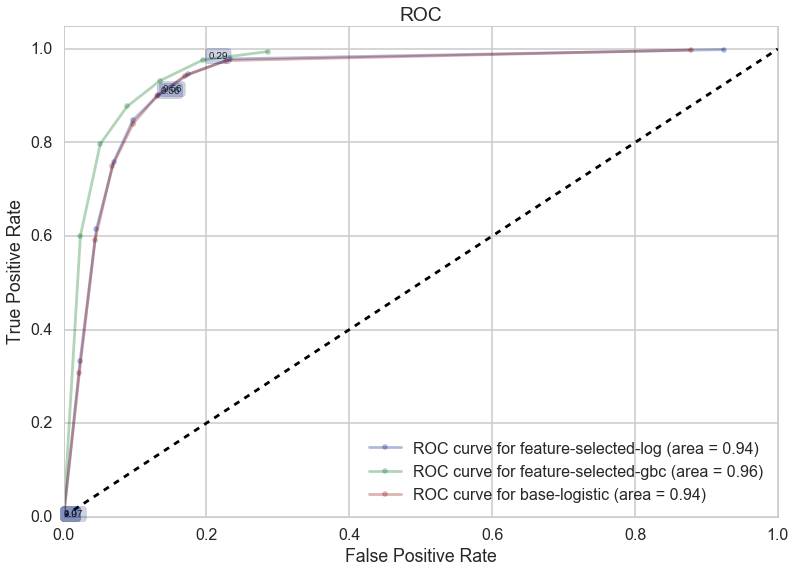

In [149]:
with sns.color_palette("dark"):
    ax = make_roc("feature-selected-log",pipelog1, ytest, Xtest, None, labe=2050, proba=True,  skip=400)
    make_roc("feature-selected-gbc",pipegbc1, ytest, Xtest, ax=ax, labe=2050, proba=True,  skip=400)
    make_roc("base-logistic",clflog, ytest, Xtest, ax=ax, labe=2050, proba=True,  skip=400)

Feature selection doesn't make a difference, and GBC is still the best choice.

### Balancing classes

In [150]:
positive_count = sum(newdf_nonan.on_match)
negative_count = newdf_nonan.shape[0] - positive_count

print positive_count, negative_count

26865 21623


In [151]:
indices  = np.arange(0, newdf_nonan.shape[0])

new_pos  = np.random.choice(indices[np.array(newdf_nonan.on_match, dtype=pd.Series) == True], size=negative_count, replace=False)

new_ind = np.concatenate((indices[np.array(newdf_nonan.on_match, dtype=pd.Series) == False], new_pos))

new_mask = newdf_nonan.index.isin(new_ind)

### After rebalancing

In [152]:
%%time
pipe_params = {'log__C': [1e-3, 1e-2, 1e-1, 1e0, 1e1]}

pipelog2 = Pipeline([('selector', fprselector),
                     ('log', LogisticRegression())])
                                 
pipelog2, Xtrain, ytrain, Xtest, ytest = do_classify(pipelog2, pipe_params, newdf_nonan, 
                                                     featurenames = features,
                                                     targetname = target,
                                                     target1val = 1, 
                                                     #mask = mask)
                                                     mask = new_mask)

/Users/mholman/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:6: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
/Users/mholman/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:420: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/Users/mholman/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:420: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


using mask
BEST {'log__C': 0.1} 0.883798388224 [mean: 0.86896, std: 0.03867, params: {'log__C': 0.001}, mean: 0.87749, std: 0.03620, params: {'log__C': 0.01}, mean: 0.88380, std: 0.03307, params: {'log__C': 0.1}, mean: 0.88357, std: 0.03205, params: {'log__C': 1.0}, mean: 0.88357, std: 0.03208, params: {'log__C': 10.0}]
############# based on standard predict ################
Accuracy on training data: 0.89
Accuracy on test data:     0.89
[[2049  420]
 [ 194 2891]]
########################################################
CPU times: user 4.42 s, sys: 261 ms, total: 4.68 s
Wall time: 4.68 s


In [153]:
%%time
pipe_params = {'svm__C': [1e-4, 1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2, 1e3], 
               'svm__gamma': [1e-5,1e-7,1e-9]}

pipesvm2 = Pipeline([('selector', fprselector),
                     ('svm', SVC(kernel='rbf'))])
                                 
pipesvm2,Xtrain, ytrain, Xtest, ytest  = do_classify(pipesvm2, pipe_params, newdf_nonan, 
                                                     featurenames = features,
                                                     targetname = target,
                                                     target1val = 1, 
                                                     mask = new_mask)

/Users/mholman/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:6: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
/Users/mholman/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:420: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/Users/mholman/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:420: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


using mask
BEST {'svm__C': 1000.0, 'svm__gamma': 1e-05} 0.868891787395 [mean: 0.51099, std: 0.00002, params: {'svm__C': 0.0001, 'svm__gamma': 1e-05}, mean: 0.51099, std: 0.00002, params: {'svm__C': 0.0001, 'svm__gamma': 1e-07}, mean: 0.51099, std: 0.00002, params: {'svm__C': 0.0001, 'svm__gamma': 1e-09}, mean: 0.51099, std: 0.00002, params: {'svm__C': 0.001, 'svm__gamma': 1e-05}, mean: 0.51099, std: 0.00002, params: {'svm__C': 0.001, 'svm__gamma': 1e-07}, mean: 0.51099, std: 0.00002, params: {'svm__C': 0.001, 'svm__gamma': 1e-09}, mean: 0.51099, std: 0.00002, params: {'svm__C': 0.01, 'svm__gamma': 1e-05}, mean: 0.51099, std: 0.00002, params: {'svm__C': 0.01, 'svm__gamma': 1e-07}, mean: 0.51099, std: 0.00002, params: {'svm__C': 0.01, 'svm__gamma': 1e-09}, mean: 0.51102, std: 0.00006, params: {'svm__C': 0.1, 'svm__gamma': 1e-05}, mean: 0.51099, std: 0.00002, params: {'svm__C': 0.1, 'svm__gamma': 1e-07}, mean: 0.51099, std: 0.00002, params: {'svm__C': 0.1, 'svm__gamma': 1e-09}, mean: 0.86

In [154]:
%%time
pipe_params = {'gbc__n_estimators': [50,100,150,200,250],
               'gbc__max_depth': [2,3,4,5,6]}

pipegbc2 = Pipeline([('selector', fprselector),
                     ('gbc', GradientBoostingClassifier())])
                                 
pipegbc2, Xtrain, ytrain, Xtest, ytest = do_classify(pipegbc2, pipe_params, newdf_nonan, 
                                                     featurenames = features,
                                                     targetname = target,
                                                     target1val = 1, 
                                                     mask = new_mask)

/Users/mholman/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:6: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
/Users/mholman/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:420: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/Users/mholman/anaconda/lib/python2.7/site-packages/sklearn/utils/validation.py:420: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


using mask
BEST {'gbc__max_depth': 4, 'gbc__n_estimators': 50} 0.893860343783 [mean: 0.89102, std: 0.02575, params: {'gbc__max_depth': 2, 'gbc__n_estimators': 50}, mean: 0.89300, std: 0.02689, params: {'gbc__max_depth': 2, 'gbc__n_estimators': 100}, mean: 0.89274, std: 0.02745, params: {'gbc__max_depth': 2, 'gbc__n_estimators': 150}, mean: 0.89186, std: 0.02767, params: {'gbc__max_depth': 2, 'gbc__n_estimators': 200}, mean: 0.89186, std: 0.02698, params: {'gbc__max_depth': 2, 'gbc__n_estimators': 250}, mean: 0.89349, std: 0.02713, params: {'gbc__max_depth': 3, 'gbc__n_estimators': 50}, mean: 0.89246, std: 0.02724, params: {'gbc__max_depth': 3, 'gbc__n_estimators': 100}, mean: 0.89207, std: 0.02799, params: {'gbc__max_depth': 3, 'gbc__n_estimators': 150}, mean: 0.89277, std: 0.02789, params: {'gbc__max_depth': 3, 'gbc__n_estimators': 200}, mean: 0.89225, std: 0.02859, params: {'gbc__max_depth': 3, 'gbc__n_estimators': 250}, mean: 0.89386, std: 0.02727, params: {'gbc__max_depth': 4, 'gbc

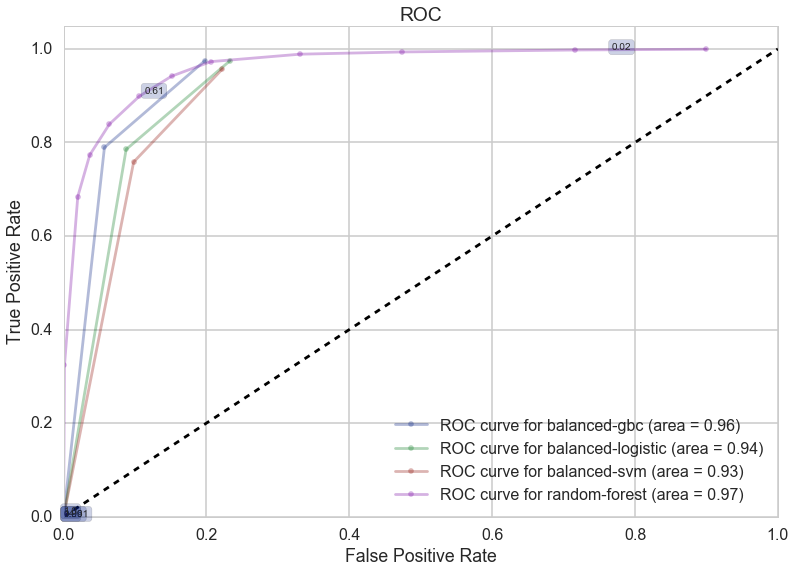

In [156]:
with sns.color_palette("dark"):
    ax = make_roc("balanced-gbc",pipegbc2, ytest, Xtest, None, labe=2050, proba=True,  skip=400)
    make_roc("balanced-logistic",pipelog2, ytest, Xtest, ax=ax, labe=2050, proba=True,  skip=400)
    make_roc("balanced-svm",pipesvm2, ytest, Xtest, ax=ax, labe=2050, proba=False,  skip=400)
    make_roc("random-forest",clfforest, ytest_tree, Xtest_tree, ax=ax, labe=2050, proba=True,  skip=400)

It looks like rebalancing is not generally needed to improve the accuracy of the classifiers. In face, the random forest outperformed the balanced GBC, which previously was a better choice on the ROC curve.

<a id='cost_profit'></a>
## Cost & Profit Curves

In [157]:
def percentage(tpr, fpr, priorp, priorn):
    perc = tpr*priorp + fpr*priorn
    return perc

In [158]:
def av_profit(tpr, fpr, util, priorp, priorn):
    """
    Function
    --------
    av_profit

    Inputs
    ------
    tpr: true positive rate
    fpr: false positive rate
    util: utility matrix for this problem
    priorp: the probability of observed +ives (OP) on our test set
    priorn: the probability of observed -ives (ON) on our test set


    Returns
    -------
    The average profit per person at this (fpr, tpr) point in this ROC space.

    Notes
    -----
    see make_profit below for an example of how this is used
    """
    # We multiply the profit for each quadrant of the confusion matrix by its probability.
    tp_profit = (util[1][1] * tpr)
    fn_profit = (util[1][0] * (1.0 - tpr))
    
    tn_profit = (util[0][0] * (1.0 - fpr))
    fp_profit = (util[0][1] * fpr)
    
    # We add the profit for positive and negatives before adjusting for prior probabilities
    profit_from_positives = tp_profit + fn_profit
    profit_from_negatives = tn_profit + fp_profit

    # The expected profit is weighted based on the incidence of +ives vs -ives
    # Avg profit needs to account for imbalances in the outcomes
    adj_profit_from_positives = priorp * profit_from_positives
    adj_profit_from_negatives = priorn * profit_from_negatives
    
    total_profit = adj_profit_from_negatives + adj_profit_from_positives
    
    return total_profit

In [159]:
def make_profit(name, clf, ytest, xtest, util, ax=None, threshold=False, labe=200, proba=True):
    initial=False
    if not ax:
        ax=plt.gca()
        initial=True
    if proba:
        fpr, tpr, thresholds=roc_curve(ytest, clf.predict_proba(xtest)[:,1])
    else:
        fpr, tpr, thresholds=roc_curve(ytest, clf.decision_function(xtest))
    priorp=np.mean(ytest)
    priorn=1. - priorp
    ben=[]
    percs=[]
    for i,t in enumerate(thresholds):
        perc=percentage(tpr[i], fpr[i], priorp, priorn)
        ev = av_profit(tpr[i], fpr[i], util, priorp, priorn)
        ben.append(ev)
        percs.append(perc*100)
    
    ax.plot(percs, ben, '-', alpha=0.3, markersize=5, label='utlity curve for %s' % name)
    
    if threshold:
        label_kwargs = {}
        label_kwargs['bbox'] = dict(
        boxstyle='round,pad=0.3', alpha=0.2,
        )
        for k in xrange(0, fpr.shape[0],labe):
            #from https://gist.github.com/podshumok/c1d1c9394335d86255b8
            threshold = str(np.round(thresholds[k], 2))
            ax.annotate(threshold, (percs[k], ben[k]), **label_kwargs)
    ax.legend(loc="lower right")
    
    ax.set_xlabel('Proportion of Detections Targeted (%)')
    ax.set_ylabel('Utility per Detection')
    ax.set_title('Utility curves')
    
    return ax

Here we are following the logic of classification problem in HW3, but our utilily matrix is different. The utility matrix here is antisymmetric.

The logic of our utility matrix is to see what happens depending on how strongly we are concerned about false negatives. In each case, there is a strong penalty for false classification, but false negatives are 10x worse than false positives.

In [160]:
tnu = 0.1
fnu = -1

fpu = -0.1
tpu = 1

In [161]:
util_matrix_1 = np.array([[tnu, fpu],[fnu, tpu]])

In [164]:
tnu = 0.1
fnu = -5

fpu = -0.5
tpu = 1

In [165]:
util_matrix_2 = np.array([[tnu, fpu],[fnu, tpu]])

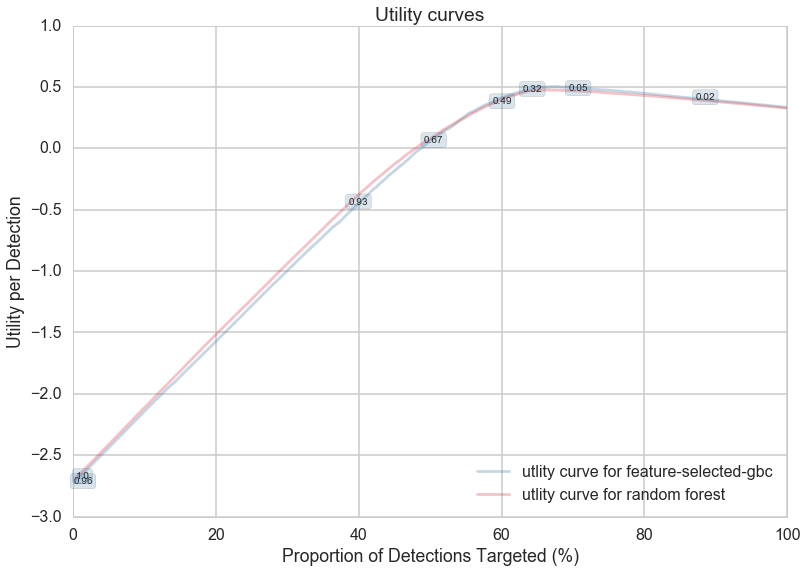

In [166]:
with sns.diverging_palette(240, 10, n=2):
    #ax = make_profit("feature-selected-logistic",pipelog2, ytest, Xtest, util_matrix_1, threshold=True, labe=800)
    #ax = make_profit("feature-selected-logistic_high_cost",pipelog2, ytest, Xtest, util_matrix_2, threshold=True, labe=800)
    
    ax = make_profit("feature-selected-gbc",pipegbc2, ytest, Xtest, util_matrix_2, threshold=True, labe=800)
    
#     make_profit("feature-selected-gbc_high_cost",pipegbc2, ytest, Xtest, util_matrix_2, threshold=True, labe=800)
    
#     make_profit("decision tree", clftree, ytest_tree, Xtest_tree, util_matrix_2, ax=ax, threshold=True, labe=800)
    make_profit("random forest", clfforest, ytest_tree, Xtest_tree, util_matrix_2, ax=ax, threshold=True, labe=800)

## Considering the costs in more detail

### Discoveries from detections

The number of real objects we discover in a search will depend upon the number of real detections of any particular object we can identify in the data.  Suppose there is some minimum number of detections $N_{min}$ we need to discover a moving object and that we have a number of opportunities $N_{tries}$ at getting those detections.  Also suppose that there is known probability that the light from any given object hits "live silicon" on the detector array.  Then the probability of making the detection is

$P(detect) = P(detect|silicon)P(silicon)$

For the Pan-STARRS-1 camera, $P(silicon)\sim 0.8$ (which is unfortunately low).  

We also have
$P(detect|silicon) \sim \frac{TP}{TP+FN} = TPR,$
where TP is the number of true positives (real detections identified as such), FN is the number of false negatives (real detections that are classified as false), and TPR is the true positive rate.

We cannot control $P(silicon)$, but we can try to improve $P(detect|silicon)$.

The probability of getting at least the minimum number of detections is

$P(N\ge N_{min}) = \sum_{i=N_{min}}^{N_{tries}}{N_{tries} \choose i} \left[P(detect)\right]^i \left[1-P(detect)\right]^{(N_{tries} - i)} $

This is obviously a strong function of $P(detect)$, given that $N_{min} = 3-10$, depending upon the technique and what is considered a "discovery."  So we need to increase $P(detect|silicon)$.

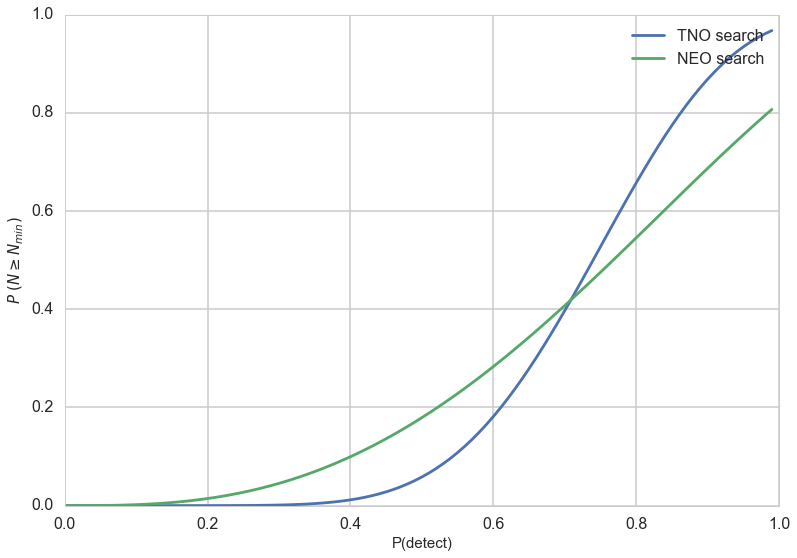

In [167]:
mpl.rcParams['mathtext.fontset'] = 'custom'
mpl.rcParams['mathtext.rm'] = 'Bitstream Vera Sans'
mpl.rcParams['mathtext.it'] = 'Bitstream Vera Sans:italic'
mpl.rcParams['mathtext.bf'] = 'Bitstream Vera Sans:bold'

from scipy.misc import comb
from scipy.stats import binom

def Pdetection(Nmin, Ntries, Psilicon, Pdet_sil):
    return 1.0 - binom.cdf(Nmin-1,Ntries,Psilicon*Pdet_sil)

Nmin = 3
Ntries = 4
Psilicon = 0.8

x = np.arange(0.0,1.0,0.01)
y_tno = Pdetection(10,16,Psilicon,x)
y_neo = Pdetection(3,4,Psilicon,x)
plt.plot(x, y_tno, label="TNO search")
plt.plot(x, y_neo, label="NEO search")
plt.legend()
plt.xlabel("P(detect)", fontsize=15)
plt.ylabel(r'$P\ (N\geq N_{min})$', fontsize=15)



### Computational load

The computational load of making those discoveries depends strongly upon the number of detections being considered.  Often it is the case that the computational burden scales as

$C \propto N_{det}^n$, 

where $N_{det}$ is the total number of detections and $n=4-8$.  The total number of detections is composed of real and false detections, so

$N_{det} = TP + FP$, 

where $TN$ and $FP$ are the true and false positives, respectively.  Thus,

$C \propto \left(TP+FP\right)^n$. 

It is reasonable to assume that a fixed amount of computational resource is available for the search.  If a desired search will not fit into the computational budget, then a more restricted search must be undertaken.  This amounts to either limiting $N_{dets}$ to a fixed value or to pursuing algorithmic improvements (i.e. reducing the exponent $n$).  We consider the former.


Up to some limit (i.e. running out of new objects to discover), the expected number of discoveries will be 

$N_{disc} \propto \frac{A}{N_{tries}} \cdot P(N\ge N_{tries})$,

where $A$ is the search area (which must be imaged $N_{tries}$ times) and $P(N\ge N_{tries})$ is the probability of accumulating a sufficient number of detections of any given object in that area.  As the calculation above shows, $N_{disc}$ depends on $TPR$ (albeit through a complicated formula).  

As we push up the true positive rate $TPR$ we push up $N_{disc}$.  But as we push up $TPR$ we eventually increase the false positive $FPR$ by following the ROC curve.  That increases the number of false positives in the calculation,  which correspondingly reduces the number of true positives, if the total number of detections is fixed.  That drives down $N_{disc}$.

### Profit function

The number of true positives is given by

$TP = \left(\frac{TP}{TP+FP}\right)\cdot N_{dets} = precision \cdot N_{dets}$,

and the number of discoveries is proportional to the total number of real detections $TP$.  When the total number of false positives FP goes up, we are forced to limit the area $A$ from which we draw data, in order to maintain a manageable value of $N_{dets}$.

In summary, we have

$N_{disc} \propto \frac{TP}{N_{tries}} \cdot P(N\ge N_{tries}) \propto \left(\frac{precision}{N_{tries}}\cdot N_{dets}\right) \cdot P(N\ge N_{tries}) $

I think this is our profit function.  It can be calculated from a precision-recall plot, correct?

In [168]:
def Ndiscoveries(prec,rec, Ntries=6, Nmin=3, Psilicon=0.8):
    score = (prec/Ntries)*(1.0-binom.cdf(Nmin-1,Ntries,Psilicon*rec))
    return score

In [300]:
from sklearn.metrics import precision_recall_curve
def make_discoveries(name, clf, ytest, xtest, Ntries=6, Nmin=3, Psilicon=0.8, ax=None, threshold=False, labe=200, proba=True):
    initial=False
    if not ax:
        ax=plt.gca()
        initial=True
    if proba:
        #fpr, tpr, thresholds=roc_curve(ytest, clf.predict_proba(xtest)[:,1])
        prec, rec, thresholds=precision_recall_curve(ytest, clf.predict_proba(xtest)[:,1])
    else:
        #fpr, tpr, thresholds=roc_curve(ytest, clf.decision_function(xtest))
        prec, rec, thresholds=precision_recall_curve(ytest, clf.decision_function(xtest))
        
    priorp=np.mean(ytest)
    priorn=1. - priorp
    ben=[]
    ndcs=[]
    percs=[]
    for i,t in enumerate(thresholds):
        #perc=percentage(tpr[i], fpr[i], priorp, priorn)
        ndisc = Ndiscoveries(prec[i], rec[i], Ntries=Ntries, Nmin=Nmin, Psilicon=Psilicon)
        ndcs.append(ndisc)
        #percs.append(perc*100)
        percs.append(t*100)
    
    ax.plot(percs, ndcs, '-', alpha=0.5, markersize=5, label='utlity curve for %s' % name)
    
    if threshold:
        label_kwargs = {}
        label_kwargs['bbox'] = dict(
        boxstyle='round,pad=0.3', alpha=0.2,
        )
        for k in xrange(0, prec.shape[0],labe):
            #from https://gist.github.com/podshumok/c1d1c9394335d86255b8
            threshold = str(np.round(thresholds[k], 2))
            ax.annotate(threshold, (percs[k], ndcs[k]), **label_kwargs)
    ax.legend(loc="lower left")
    
    ax.set_xlabel('Proportion of Detections Targeted (%)')
    ax.set_ylabel('Relative Number of Discoveries')
    ax.set_title('Utility Curves')
    
    return ax


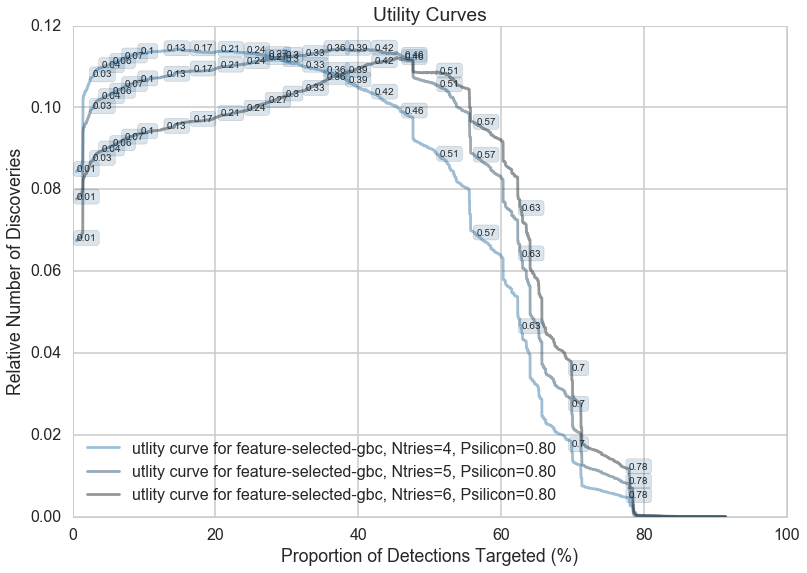

In [301]:
with sns.diverging_palette(240, 20, n=6, center='dark'):
#with sns.diverging_palette(240, 133, l=60, n=7, center='dark'):
    ax = make_discoveries("feature-selected-gbc, Ntries=4, Psilicon=0.80",pipegbc2, ytest, Xtest, Ntries=4, threshold=True, labe=800)
    #ax = make_discoveries("feature-selected-logistic, Ntries=4",pipelog2, ytest, Xtest, Ntries=4, threshold=True, labe=800)
   
    #ax = make_discoveries("feature-selected-gbc, Ntries=4, Psilicon=0.95",pipegbc2, ytest, Xtest, Ntries=4, Psilicon=0.95, threshold=True, labe=800)
    #ax = make_discoveries("feature-selected-logistic, Ntries=4, Psilicon=0.95",pipelog2, ytest, Xtest, Ntries=4, Psilicon=0.95, threshold=True, labe=800)

    ax = make_discoveries("feature-selected-gbc, Ntries=5, Psilicon=0.80",pipegbc2, ytest, Xtest, Ntries=5, threshold=True, labe=800)
    #ax = make_discoveries("feature-selected-logistic, Ntries=5",pipelog2, ytest, Xtest, Ntries=5, threshold=True, labe=800)

    #ax = make_discoveries("feature-selected-gbc, Ntries=5, Psilicon=0.95",pipegbc2, ytest, Xtest, Ntries=5, Psilicon=0.95, threshold=True, labe=800)
    #ax = make_discoveries("feature-selected-logistic, Ntries=5, Psilicon=0.95",pipelog2, ytest, Xtest, Ntries=5, Psilicon=0.95, threshold=True, labe=800)

    ax = make_discoveries("feature-selected-gbc, Ntries=6, Psilicon=0.80",pipegbc2, ytest, Xtest, Ntries=6, threshold=True, labe=800)
    #ax = make_discoveries("feature-selected-logistic, Ntries=6",pipelog2, ytest, Xtest, Ntries=6, threshold=True, labe=800)

    #ax = make_discoveries("feature-selected-gbc, Ntries=6, Psilicon=0.95",pipegbc2, ytest, Xtest, Ntries=6, Psilicon=0.95, threshold=True, labe=800)
    #ax = make_discoveries("feature-selected-logistic, Ntries=6, Psilicon=0.95",pipelog2, ytest, Xtest, Ntries=6, Psilicon=0.95, threshold=True, labe=800)


In [173]:
Xtest.shape

(5554, 12)

Now there is a clear optimimum fraction of detections to consider, given fixed computational and telescopic resources. This fraction depends upon the survey strategy. In particular, it depends upon the number of attempts that are made in an effort to achieve the minimum number of detections required to discover a moving object.

## Building Classifiers for Each Filter

The Pan-STARRS-1 exposres are taken through one of five different standard filters: g, r, i, z, and y, and one non-standard filter w.  The wavelength range increase from roughly 4000 Angstroms for g to roughly 1 micron for y.  The w-band filter is a wide, covering 4000 to 8000 Angstroms (roughly g, r, and i combined) and is well-suited to solar system work.  Here we focus on the standard filters.  We will examine w-band in future work.

In [174]:
# Generate a list of smf data files
from os import listdir
from os.path import isfile, join
mypath = 'data/'
smffiles = [join(mypath, f) for f in listdir(mypath) if isfile(join(mypath, f)) & f.endswith('.smf')]

smffiles

['data/o5895g0004o.424868.cm.333484.n.smf',
 'data/o5895g0005o.424869.cm.333488.n.smf',
 'data/o5895g0006o.424870.cm.333490.n.smf',
 'data/o5895g0007o.424871.cm.333491.n.smf',
 'data/o5895g0008o.424872.cm.333493.n.smf',
 'data/o5895g0009o.424873.cm.333497.n.smf',
 'data/o5895g0010o.424874.cm.333498.n.smf',
 'data/o5895g0011o.424875.cm.333502.n.smf',
 'data/o5895g0012o.424876.cm.333500.n.smf',
 'data/o5895g0013o.424878.cm.333503.n.smf',
 'data/o5895g0014o.424877.cm.333505.n.smf',
 'data/o5895g0015o.424879.cm.333507.n.smf',
 'data/o5895g0016o.424880.cm.333506.n.smf',
 'data/o5895g0017o.424881.cm.333508.n.smf',
 'data/o5895g0019o.424883.cm.333509.n.smf',
 'data/o5895g0020o.424884.cm.333511.n.smf',
 'data/o5895g0021o.424885.cm.333510.n.smf',
 'data/o5895g0022o.424886.cm.333513.n.smf',
 'data/o5895g0023o.424887.cm.333515.n.smf',
 'data/o5895g0024o.424888.cm.333516.n.smf',
 'data/o5895g0025o.424889.cm.333517.n.smf',
 'data/o5895g0026o.424890.cm.333518.n.smf',
 'data/o5895g0027o.424891.cm.333

In [175]:
def smf2filters(infile):

    with fits.open(infile) as hdulist:

        warnings.resetwarnings()
        warnings.filterwarnings('ignore', category=UserWarning, append=True)

        # Collect some primary header information
        ra_c     = hdulist[0].header["RA"]
        dec_c    = hdulist[0].header["DEC"]
        zpt_obs  = hdulist[0].header["ZPT_OBS"]
        filterID = hdulist[0].header["FILTERID"].rstrip('.00000')
        exptime  = hdulist[0].header["EXPTIME"]
        mjdObs   = hdulist[0].header["MJD-OBS"]
        airmass  = hdulist[0].header["AIRMASS"]
    
        # Do a few calculations
        jd = mjdObs + 2400000.5

        return filterID, ra_c, dec_c, mjdObs


In [176]:
with open('file_dict.json', 'r') as fp:
    file_dict = json.load(fp)

Now we are going to select 10 exposures for each of the filters. We will use these to train a GradientBoostClassifier that we can then test on the other exposures.

In [177]:
y_train_smfs = file_dict['y'][0:10]
z_train_smfs = file_dict['z'][0:10]
r_train_smfs = file_dict['r'][0:10]
i_train_smfs = file_dict['i'][0:10]
g_train_smfs = file_dict['g'][0:10]

y_test_smfs = file_dict['y'][10:]
z_test_smfs = file_dict['z'][10:]
r_test_smfs = file_dict['r'][10:]
i_test_smfs = file_dict['i'][10:]
g_test_smfs = file_dict['g'][10:]

In [178]:
# Here's a list of all the filters for the test night of data
filters = ['y','z','i','r','g']

In [182]:
%%time
parameters = {'n_estimators': [40],
              'max_depth': [4]}
                  
clfgbc = GradientBoostingClassifier()

# Will keep a dictionary of the results, keyed on filterID
classifier_dict={}

# For each filter, grab 10 smf files and train the classifier
for filt in filters:
    train_smfs = file_dict[filt][0:10]
    
    # Open the smf files in sequence
    print "Reading files for the " + filt + " filter"
    df_list=[]
    for i, smf in enumerate(train_smfs):
        print i, smf
        _, df = smf2pandas(smf, FLAGS_dict=FLAGS_dict, FLAGS2_dict=FLAGS2_dict)
        df_list.append(df)
    
    # Add the necessary columns tot he data frame
    print "Combing data frames and adding necssary columns"
    combined_df = pd.concat(df_list)

    good_cell_mask = np.array(map(lambda (c, x, y): not(in_bad_cell(c, x, y)), zip(combined_df['chip'], combined_df['X_PSF'], combined_df['Y_PSF'])))
    combined_df['cell_good'] = pd.Series(good_cell_mask, index=combined_df.index)

    good_column_mask = np.array(map(lambda (c, x, y): not(in_bad_column(c, x, y)), zip(combined_df['chip'], combined_df['X_PSF'], combined_df['Y_PSF'])))
    combined_df['column_good'] = pd.Series(good_column_mask, index=combined_df.index)

    good_row_mask = np.array(map(lambda (c, x, y): not(in_bad_row(c, x, y)), zip(combined_df['chip'], combined_df['X_PSF'], combined_df['Y_PSF'])))
    combined_df['row_good'] = pd.Series(good_row_mask, index=combined_df.index)

    combined_df['on_match'] = (combined_df.on_star | (combined_df.mp_desig != 'None'))
    combined_df['valid_match'] = combined_df.on_match & combined_df.row_good & combined_df.column_good & combined_df.cell_good # FGV: added

    # The block below filters out records where the value is NaN.
    # This is just filtering out the records where one of the features used 
    # or training is NaN.
    print "Getting rid of some NaNs"
    init = np.ones(combined_df.shape[0], dtype='int')

    numerical_features = copy.deepcopy(features)
    # numerical_features.remove('chip')

    for i,feature in enumerate(numerical_features):
        temp_mask = ~np.isnan(combined_df[feature])
    
        if i == 0:
            final_mask = init & temp_mask
        else:
            final_mask = final_mask & temp_mask

    combined_df_nonan = combined_df[final_mask]
    
    # Split the data into training and test test subsets
    itrain, itest = train_test_split(xrange(combined_df_nonan.shape[0]), train_size=0.6)

    mask         = np.ones(combined_df_nonan.shape[0], dtype='int')
    mask[itrain] = 1
    mask[itest]  = 0

    mask = (mask == 1)

    # Now we train a classifier for the 10 exposures using the hyperparameters we determined in the earlier step.
    print "Training the classifier"
    clfgbc_filt, Xtrain, ytrain, Xtest, ytest = do_classify(clfgbc, parameters, combined_df_nonan, 
                                                            featurenames = features,
                                                            targetname = target,
                                                            target1val = 1, 
                                                            mask = mask)
    
    pkl_filename = "clfgbc_%s.pkl" % (filt)
    # save the classifier
    print "Saving classifier ", pkl_filename
    with open(pkl_filename, 'wb') as fid:
        cPickle.dump(clfgbc_filt, fid)
    
    classifier_dict[filt] = clfgbc_filt
    print "Finished with filter ", filt

Reading files for the y filter
0 data/o5895g0004o.424868.cm.333484.n.smf
y 5.754165 6.050334 55895.1872537
1 data/o5895g0005o.424869.cm.333488.n.smf
y 5.961855 3.216078 55895.1877649
2 data/o5895g0006o.424870.cm.333490.n.smf
y 8.291938 4.858724 55895.1882521
3 data/o5895g0007o.424871.cm.333491.n.smf
y 7.934674 7.717781 55895.1887406
4 data/o5895g0008o.424872.cm.333493.n.smf
y 7.734742 10.346359 55895.1892276
5 data/o5895g0009o.424873.cm.333497.n.smf
y 10.409221 9.305576 55895.189715
6 data/o5895g0010o.424874.cm.333498.n.smf
y 10.440059 12.06408 55895.1902009
7 data/o5895g0011o.424875.cm.333502.n.smf
y 5.754177 6.050339 55895.1907902
8 data/o5895g0012o.424876.cm.333500.n.smf
y 5.96185 3.216068 55895.1913137
9 data/o5895g0013o.424878.cm.333503.n.smf
y 8.291928 4.858725 55895.191806
Combing data frames and adding necssary columns
Getting rid of some NaNs
Training the classifier
using mask
BEST {'n_estimators': 40, 'max_depth': 4} 0.898013143658 [mean: 0.89801, std: 0.00184, params: {'n_es

/Users/mholman/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:6: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.


In [183]:
features

['PSF_QF_PERFECT',
 'snr',
 'CR_LIMIT',
 'PSF_THETA',
 'SKY',
 'X_PSF',
 'X_PSF_SIG',
 'Y_PSF',
 'Y_PSF_SIG',
 'EXT_LIMIT',
 'NONLINEAR_FIT',
 'PASS1_SRC']

In [184]:
for k, clf in classifier_dict.iteritems():
    print "Filter ", k
    print "%20s %s" % ('Feature  ', 'Relative Importance')
    for i, feat in enumerate(features):
        print "%20s %6.3lf" % (feat, clf.feature_importances_[i])
        



Filter  y
           Feature   Relative Importance
      PSF_QF_PERFECT  0.383
                 snr  0.275
            CR_LIMIT  0.097
           PSF_THETA  0.000
                 SKY  0.009
               X_PSF  0.082
           X_PSF_SIG  0.011
               Y_PSF  0.049
           Y_PSF_SIG  0.013
           EXT_LIMIT  0.067
       NONLINEAR_FIT  0.003
           PASS1_SRC  0.010
Filter  i
           Feature   Relative Importance
      PSF_QF_PERFECT  0.223
                 snr  0.367
            CR_LIMIT  0.074
           PSF_THETA  0.000
                 SKY  0.028
               X_PSF  0.109
           X_PSF_SIG  0.018
               Y_PSF  0.059
           Y_PSF_SIG  0.043
           EXT_LIMIT  0.057
       NONLINEAR_FIT  0.010
           PASS1_SRC  0.014
Filter  r
           Feature   Relative Importance
      PSF_QF_PERFECT  0.359
                 snr  0.115
            CR_LIMIT  0.088
           PSF_THETA  0.000
                 SKY  0.025
               X_PSF  0.131
       

Based on this we see that PSF_QF_PERFECT and snr clearly matter for every filter.

X_PSF and Y_PSF matter, but it might be better to organize those values differently. For example, we might provide a measure of the distance from the edge of a cell. Or we might indicate whether the detection is on or near a known bad row or column.

X_PSF_SIG and Y_PSF_SIG look to be consistently somewhat important.

SKY is most important for the g-band, which is a little strange since the sky is actually darkest in g. It could be that SKY is picking up on chip defects or other things in the g-band but not in the other bands.

PASS1_SRC and NONLINEAR_FIT are not very important; they could be dropped if it were necessary to reduce the number of feature.

PSF_THETA is not a useful predictor. It looked like it might be because real detections have a PSF that is governed by passing through the atmosphere and telescope optics, which yield a characteristic shape. Most false detections to not have that characteristic shape. However, the source detection algorithm convolves the image with the model PSF first. So it is possible that the shape distinction is largely lost.

Create dict of dataframes, one for each filter present in the smf file set.
Run each resulting dataframe through the classifier's "predict" function
Append "prediction" column with prediction result

In [345]:
%%time
filters = ['g', 'r', 'i', 'z', 'y']  
df_pred = {}

# For each filter, grab 10 smf files and test the classifier predictions
for filt in filters:
    test_smfs = file_dict[filt][10:11]
    
    # Open the smf files in sequence
    print "Reading files for the " + filt + " filter"
    df_list=[]
    for i, smf in enumerate(test_smfs):
        print i, smf
        _, df = smf2pandas(smf, FLAGS_dict=FLAGS_dict, FLAGS2_dict=FLAGS2_dict)
        df_list.append(df)
    
    # Add the necessary columns tot he data frame
    print "Combining data frames and adding necssary columns"
    combined_df = pd.concat(df_list)

    good_cell_mask = np.array(map(lambda (c, x, y): not(in_bad_cell(c, x, y)), zip(combined_df['chip'], combined_df['X_PSF'], combined_df['Y_PSF'])))
    combined_df['cell_good'] = pd.Series(good_cell_mask, index=combined_df.index)

    good_column_mask = np.array(map(lambda (c, x, y): not(in_bad_column(c, x, y)), zip(combined_df['chip'], combined_df['X_PSF'], combined_df['Y_PSF'])))
    combined_df['column_good'] = pd.Series(good_column_mask, index=combined_df.index)

    good_row_mask = np.array(map(lambda (c, x, y): not(in_bad_row(c, x, y)), zip(combined_df['chip'], combined_df['X_PSF'], combined_df['Y_PSF'])))
    combined_df['row_good'] = pd.Series(good_row_mask, index=combined_df.index)

    combined_df['on_match'] = (combined_df.on_star | (combined_df.mp_desig != 'None'))
    combined_df['valid_match'] = combined_df.on_match & combined_df.row_good & combined_df.column_good & combined_df.cell_good # FGV: added

    # The block below filters out records where the value is NaN.
    # This is just filtering out the records where one of the features used 
    # or training is NaN.
    print "Getting rid of some NaNs"
    init = np.ones(combined_df.shape[0], dtype='int')

    numerical_features = copy.deepcopy(features)
    # numerical_features.remove('chip')

    for i,feature in enumerate(numerical_features):
        temp_mask = ~np.isnan(combined_df[feature])
    
        if i == 0:
            final_mask = init & temp_mask
        else:
            final_mask = final_mask & temp_mask

    combined_df_nonan = combined_df[final_mask]
    
    # create dataframe with only the features used in the classifier
    combined_features = combined_df_nonan[features]
    
    pkl_filename = "clfgbc_%s.pkl" % (filt)
    print "Reading classifier ", pkl_filename
    with open(pkl_filename, 'rb') as fid:
        clfgbc_filt = cPickle.load(fid)
                
    # predict results using classifier for filter
    combined_df_nonan['PREDICTED'] = clfgbc_filt.predict(combined_features)
    
    false_negatives = combined_df_nonan.valid_match & (~combined_df_nonan.PREDICTED)
    true_positives  = combined_df_nonan.valid_match & combined_df_nonan.PREDICTED
    
    combined_df_nonan['FN'] = false_negatives
    combined_df_nonan['TP'] = true_positives
    
    df_pred[filt]=combined_df_nonan
        
    print filt,":",len(df_pred[filt])
    print "Finished with filter ", filt

Reading files for the g filter
0 data/o5895g0237o.425101.cm.333781.n.smf
g 42.529579 -29.981193 55895.362256
Combining data frames and adding necssary columns
Getting rid of some NaNs
Reading classifier 

/Users/mholman/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:60: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/mholman/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


 clfgbc_g.pkl
g : 68024
Finished with filter  g
Reading files for the r filter
0 data/o5895g0095o.424959.cm.333607.n.smf
r 355.293622 -13.438966 55895.2536996
Combining data frames and adding necssary columns
Getting rid of some NaNs
Reading classifier  clfgbc_r.pkl
r : 82961
Finished with filter  r
Reading files for the i filter
0 data/o5895g0159o.425023.cm.333707.n.smf
i 64.235642 21.35924 55895.310549
Combining data frames and adding necssary columns
Getting rid of some NaNs
Reading classifier  clfgbc_i.pkl
i : 151877
Finished with filter  i
Reading files for the z filter
0 data/o5895g0029o.424893.cm.333522.n.smf
z 354.351063 8.325326 55895.2008498
Combining data frames and adding necssary columns
Getting rid of some NaNs
Reading classifier  clfgbc_z.pkl
z : 82508
Finished with filter  z
Reading files for the y filter
0 data/o5895g0014o.424877.cm.333505.n.smf
y 7.934678 7.717775 55895.1922966
Combining data frames and adding necssary columns
Getting rid of some NaNs
Reading classifi

/Users/mholman/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:66: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


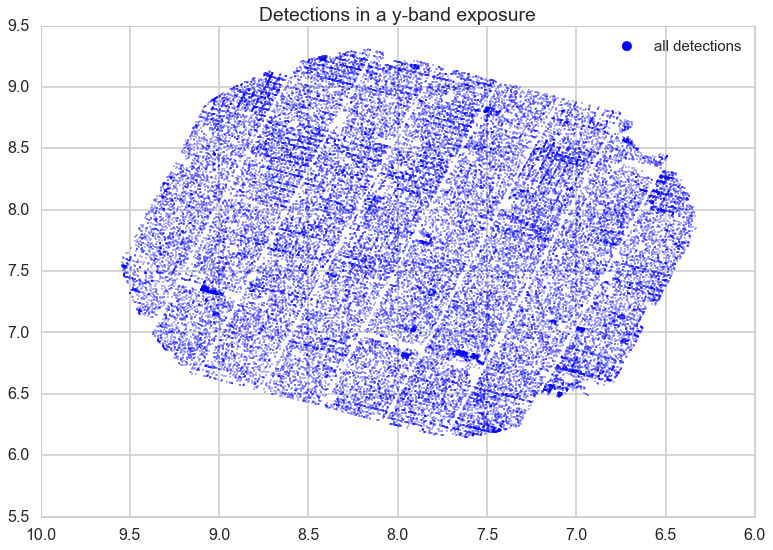

In [360]:
s1 = plt.scatter(df_pred['y'].RA_PSF, df_pred['y'].DEC_PSF, s=0.4, color='blue', label='all detections')
unmatched_real_mask =(~df_pred['y'].on_match) & (df_pred['y'].PREDICTED == 1)
plt.title('Detections in a y-band exposure')
leg = plt.legend(markerscale=15, fontsize=15)
plt.gca().invert_xaxis()
plt.savefig('all_detections.png')

0.0322487046632


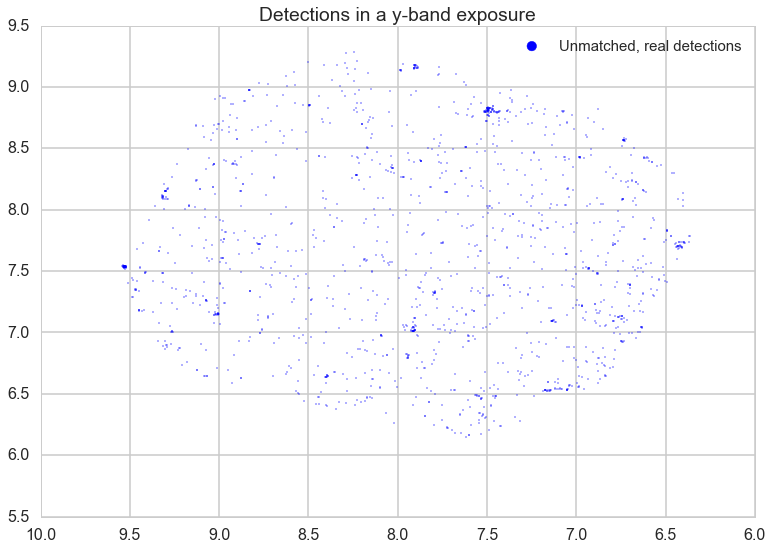

In [366]:
unmatched_real_mask =(~df_pred['y'].on_match) & (df_pred['y'].PREDICTED == 1) & df_pred['y'].cell_good & df_pred['y'].row_good & df_pred['y'].column_good 
s2 = plt.scatter(df_pred['y'][unmatched_real_mask].RA_PSF, df_pred['y'][unmatched_real_mask].DEC_PSF, s=0.4, color='blue', label='Unmatched, real detections')
plt.title('Detections in a y-band exposure')
leg = plt.legend(markerscale=15, fontsize=15)
plt.gca().invert_xaxis()
plt.savefig('real_detections.png')
print unmatched_real_mask.sum()/float(unmatched_real_mask.shape[0])

In [368]:
unmatched_real, unmatched_real_mask.sum()

(27101, 1556)

<a id='analysis'></a>
## Final Analysis

One thing we have notice is that the accuracy of our classifiers, trained on a set of ten exposures for each filter, decreases monotonically from the longest wavelength y to the shortest wavelength. The sky is brightest in y and darkest in g. One might naturally think that there would be more false positives (due to sky brightness fluctuations) and possibly lower accuracy at the longer wavelengths, which is opposite what we see.

If we look at the predictions from 10 exposures for each of the filters, we see the following:

In [284]:
for filt in filters:
    print filt + " band"
    print "-------------"
    total_detections = len(df_pred[filt])
    print 'Total detections           %s %10d' %(filt, total_detections)
    print 'Matched count              %s %10d' %(filt, df_pred[filt].on_match.sum()),
    print '  match rate: %6.3lf' % (float(df_pred[filt].on_match.sum())/len((df_pred[filt])))
    print
    print 'Valid Match count          %s %10d' %(filt, df_pred[filt].valid_match.sum())
    print 'True Positive count        %s %10d' %(filt, df_pred[filt].TP.sum())
    print 'False Negative count       %s %10d' %(filt, df_pred[filt].FN.sum()),
    print '         FNR: %6.3lf' % (float(df_pred[filt].FN.sum())/(df_pred[filt].TP.sum() + df_pred[filt].FN.sum()))
    print 
    print 'Umatched Count             %s %10d' %(filt,(~df_pred[filt].on_match).sum())
    unmatched_real =((~df_pred[filt].on_match) & (df_pred[filt].PREDICTED == 1)).sum()
    unmatched_bogus =((~df_pred[filt].on_match) & (df_pred[filt].PREDICTED == 0)).sum()
    print 'Unmatched, predicted bogus %s %10d' %(filt, unmatched_bogus)
    print 'Unmatched, predicted real  %s %10d' %(filt, unmatched_real),
    print '    fraction: %6.3lf' % (float(unmatched_real)/total_detections)
    print

g band
-------------
Total detections           g     697131
Matched count              g     311639   match rate:  0.447

Valid Match count          g     292942
True Positive count        g     233408
False Negative count       g      59534          FNR:  0.203

Umatched Count             g     385492
Unmatched, predicted bogus g     347854
Unmatched, predicted real  g      37638     fraction:  0.054

r band
-------------
Total detections           r     837471
Matched count              r     548763   match rate:  0.655

Valid Match count          r     513759
True Positive count        r     473607
False Negative count       r      40152          FNR:  0.078

Umatched Count             r     288708
Unmatched, predicted bogus r     227558
Unmatched, predicted real  r      61150     fraction:  0.073

i band
-------------
Total detections           i    1645343
Matched count              i    1295980   match rate:  0.788

Valid Match count          i    1222605
True Positive count    

## Conclusions

The results are extremely encouraging in all bands!  

The fraction of detections that are predicted to be real and that are not already matched with a known source (our target population) is now 4-7% of the total set of detections.  

And the false negative rate (the fraction of real detections that misclassify as false) is between 5 and 20%.  

(The highest FNR values are probably due to a problem with the catalog of stationary sources in the g-band, rather than with the classifiier.)



<a id='acknowledgements'></a>
## Acknowledegments

We would like to thank a number of people for helpful discussions.  Among these are Rahul Dave, Diana Zhang, Tim Spahr, Michael Lackner, and Matthew Payne.

z 3.572163 4.640101 55895.2093599


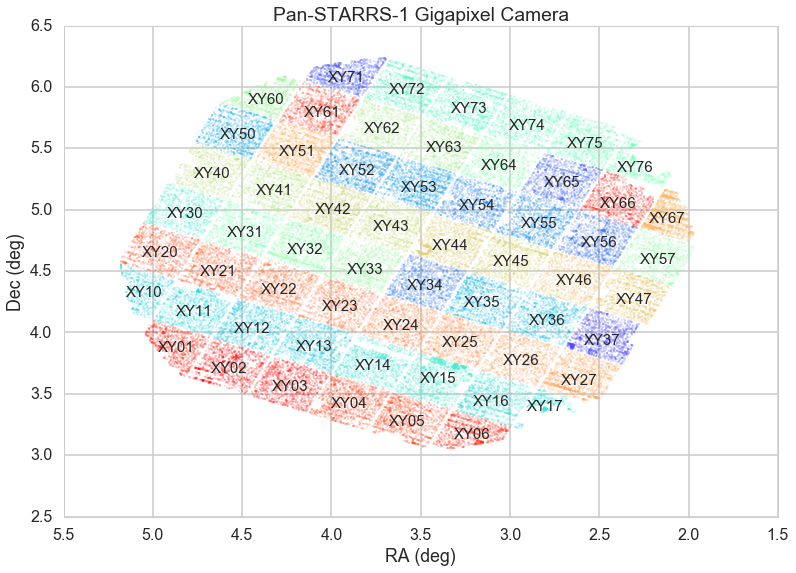

In [305]:
chip_dict, newdf = smf2pandas('test.star.smf', FLAGS_dict=FLAGS_dict, FLAGS2_dict=FLAGS2_dict)
make_colorful_plot(chip_dict)

## Exploring HDF5 as a data format

In [ ]:
import h5py

In [410]:
# Pandas provides methods for directly writing and reading HDF5 format files
newdf.to_hdf('foo.hdf5', 'newdf')

In [412]:
newdf2 = pd.read_hdf('foo.hdf5', 'newdf')
newdf2.head()

,AP_MAG,AP_MAG_RADIUS,AP_MAG_RAW,CAL_PSF_MAG,CAL_PSF_MAG_SIG,CR_NSIGMA,DEC_PSF,EXT_NSIGMA,FLAGS,FLAGS2,IPP_IDET,KRON_FLUX,KRON_FLUX_ERR,KRON_FLUX_INNER,KRON_FLUX_OUTER,MOMENTS_M3C,MOMENTS_M3S,MOMENTS_M4C,MOMENTS_M4S,MOMENTS_R1,MOMENTS_RH,MOMENTS_XX,MOMENTS_XY,MOMENTS_YY,N_FRAMES,PADDING,PADDING2,PEAK_FLUX_AS_MAG,PLTSCALE,POSANGLE,PSF_CHISQ,PSF_INST_FLUX,PSF_INST_FLUX_SIG,PSF_INST_MAG,PSF_INST_MAG_SIG,PSF_MAJOR,PSF_MINOR,PSF_NDOF,PSF_NPIX,PSF_QF,PSF_QF_PERFECT,PSF_THETA,RA_PSF,SKY,SKY_SIGMA,X_PSF,X_PSF_SIG,Y_PSF,Y_PSF_SIG,mp_dec_rate,mp_desig,mp_mag,mp_prox,mp_ra_rate,on_star,chip,filterID,mag,snr,fwhm,psf_extent,BIG_RADIUS,MOMENTS_FAILURE,EXT_LIMIT,EXTERNALPOS,DEFAULT,NONLINEAR_FIT,DEFECT,SKY_FAILURE,LINEAR_FIT,RADIAL_FLUX,PSFSTAR,POORFIT,SKYVAR_FAILURE,PAIR,OFF_CHIP,BLEND,FITFAIL,MOMENTS_SN,SATURATED,BLEND_FIT,AP_MAGS,SIZE_SKIPPED,CR_LIMIT,ON_SPIKE,BADPSF,EXTENDED_FIT,UNDEFINED,EXTENDED_STATS,SATSTAR,FITTED,EXTMODEL,ON_GHOST,PSFMODEL,HAS_BRIGHTER_NEIGHBOR,ON_STARCORE,ON_CONVPOOR,PASS1_SRC,DIFF_SELF_MATCH,BRIGHT_NEIGHBOR_1,SATSTAR_PROFILE,ON_BURNTOOL,BRIGHT_NEIGHBOR_10,DIFF_WITH_DOUBLE,DIFF_WITH_SINGLE,MATCHED,flagsOK,in_box,magOK,qfpOK,on_match,on_faulty
0,-15.724316,11,-15.649606,9.562006,0.0002,NaN,3.952620,42.940945,640680069,128,0,-inf,NaN,3023516.25000,1862353.000000,14.618450,4.760791,1.416535,0.608149,NaN,1.963364,39.411476,-4.489249,29.150957,0,0,0,-11.425479,0.255873,-44.950493,997430.562500,26142684.000000,15258.401367,-18.543377,0.000584,2.364025,2.205285,21047,21050,0.107734,0.075528,-25.710072,2.609610,151.263809,14.220932,3430.437744,0.001527,4232.690430,0.003072,NaN,None,NaN,NaN,NaN,1,XY37,z,9.562006,1860.724922,1.375740,14.844969,True,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,True,True,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,False,True,True,False,True,False
1,-15.391106,11,-15.316396,15.057261,0.0002,NaN,3.864354,117.107620,103825415,160,1,1.337260e+06,1537.431396,341410.12500,1004.133301,-0.090274,-0.881527,0.350518,-0.037179,2.947113,1.234334,1.889432,0.134548,4.833177,0,0,0,-11.419569,0.255641,-44.923401,706189.250000,165671.843750,616.485168,-13.048121,0.003721,2.289338,2.232472,4086,4087,0.998310,0.422473,82.875938,2.542134,149.648865,14.414218,4190.956055,0.007917,2862.983154,0.007917,NaN,None,NaN,NaN,NaN,0,XY37,z,15.057261,292.276822,1.360920,1.336700,True,False,True,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,True,True,False,True,False,False,False,True,False,False,False,True,False,False,False,False,True,True,True,True,False,False
2,-14.712990,11,-14.638280,17.368683,0.0002,NaN,3.951783,159.373016,572522625,0,2,NaN,NaN,185575.15625,344422.281250,-0.135545,0.127662,0.154432,0.322281,NaN,0.557751,0.676340,-0.275254,2.873093,0,0,0,-11.416001,0.255869,-44.949932,938866.187500,19709.681641,302.497314,-10.736699,0.015348,2.363841,2.205340,4554,4555,0.897893,0.860194,-41.168640,2.607683,151.260513,14.208065,3430.452393,0.032655,4203.113281,0.032655,NaN,None,NaN,NaN,NaN,0,XY37,z,17.368683,71.244007,1.375682,0.610535,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,True,False,False
3,-15.462722,11,-15.388012,12.681553,0.0002,NaN,3.799670,5.422551,103825415,128,3,1.403954e+06,1430.927002,338617.31250,88140.257812,0.153482,-0.495743,0.091551,0.015648,3.820368,1.893336,7.592988,0.083297,7.193233,0,0,0,-11.366590,0.255410,-44.925587,72203.671875,1477515.500000,1468.015991,-15.423830,0.000994,2.446745,2.155717,4086,4087,0.998891,0.878216,-51.509529,2.435251,151.996307,13.775016,4428.223145,0.002114,1115.403076,0.002114,

In [413]:
# We can also use the h5py methods, indpendent of pandas
f = h5py.File('foo.hdf5','r+')
print f.keys()
f.close()

[u'newdf']


In [427]:
%%time
# Let's read 10 smf files and same them as HDF5 files, keeping track of the time.
for i, smf in enumerate(smffiles[0:10]):
    print i, smf
    chip_dict, df = smf2pandas(smf, FLAGS_dict=FLAGS_dict, FLAGS2_dict=FLAGS2_dict)
    hdfn = smf.rsplit('.smf')[0]+'.hdf5'
    df.to_hdf(hdfn, 'df')    

0 data/o5895g0004o.424868.cm.333484.n.smf
y 5.754165 6.050334 55895.1872537
1 data/o5895g0005o.424869.cm.333488.n.smf
y 5.961855 3.216078 55895.1877649
2 data/o5895g0006o.424870.cm.333490.n.smf
y 8.291938 4.858724 55895.1882521
3 data/o5895g0007o.424871.cm.333491.n.smf
y 7.934674 7.717781 55895.1887406
4 data/o5895g0008o.424872.cm.333493.n.smf
y 7.734742 10.346359 55895.1892276
5 data/o5895g0009o.424873.cm.333497.n.smf
y 10.409221 9.305576 55895.189715
6 data/o5895g0010o.424874.cm.333498.n.smf
y 10.440059 12.06408 55895.1902009
7 data/o5895g0011o.424875.cm.333502.n.smf
y 5.754177 6.050339 55895.1907902
8 data/o5895g0012o.424876.cm.333500.n.smf
y 5.96185 3.216068 55895.1913137
9 data/o5895g0013o.424878.cm.333503.n.smf
y 8.291928 4.858725 55895.191806
CPU times: user 1min 27s, sys: 809 ms, total: 1min 27s
Wall time: 1min 28s


In [429]:
%%time
# Now let's read in those HDF5 files, adding each data frame to df_list, keeping track of the time.
df_list = []
for i, smf in enumerate(smffiles[0:10]):
    hdfn = smf.rsplit('.smf')[0]+'.hdf5'
    print i, hdfn
    df_list.append(pd.read_hdf(hdfn, 'df'))


0 data/o5895g0004o.424868.cm.333484.n.hdf5
1 data/o5895g0005o.424869.cm.333488.n.hdf5
2 data/o5895g0006o.424870.cm.333490.n.hdf5
3 data/o5895g0007o.424871.cm.333491.n.hdf5
4 data/o5895g0008o.424872.cm.333493.n.hdf5
5 data/o5895g0009o.424873.cm.333497.n.hdf5
6 data/o5895g0010o.424874.cm.333498.n.hdf5
7 data/o5895g0011o.424875.cm.333502.n.hdf5
8 data/o5895g0012o.424876.cm.333500.n.hdf5
9 data/o5895g0013o.424878.cm.333503.n.hdf5
CPU times: user 387 ms, sys: 231 ms, total: 619 ms
Wall time: 1.39 s


Most impressive!  Reading the smf files and writing HDF5 files took 90 sec, but reading the HDF5 files took 1.4 sec.  

I verified that writing the HDF5 files took a negligible amount of time; reading the smf dominated the time.  It's possible that some of the masking operations in smf2pandas take some time.

If all the smf files were read in as pandas dataframes and then saved as HDF5 files, the entire Pan-STARRS processing could be much faster, with the HDF5 files being rapidly read as needed.  This is essentially what Mario Juric does with his Large Scale Database.

It may also be important to also store the other information to store the other information that is contained in the smf files.  Much of the exposure information needs to be keep, as does the detection efficiency information for each chip.

Perhaps it would be better to store the information in a way that preserves much of the FITS organization of the original smf file.

In [431]:
df_list[9].head()

,AP_MAG,AP_MAG_RADIUS,AP_MAG_RAW,CAL_PSF_MAG,CAL_PSF_MAG_SIG,CR_NSIGMA,DEC_PSF,EXT_NSIGMA,FLAGS,FLAGS2,IPP_IDET,KRON_FLUX,KRON_FLUX_ERR,KRON_FLUX_INNER,KRON_FLUX_OUTER,MOMENTS_M3C,MOMENTS_M3S,MOMENTS_M4C,MOMENTS_M4S,MOMENTS_R1,MOMENTS_RH,MOMENTS_XX,MOMENTS_XY,MOMENTS_YY,N_FRAMES,PADDING,PADDING2,PEAK_FLUX_AS_MAG,PLTSCALE,POSANGLE,PSF_CHISQ,PSF_INST_FLUX,PSF_INST_FLUX_SIG,PSF_INST_MAG,PSF_INST_MAG_SIG,PSF_MAJOR,PSF_MINOR,PSF_NDOF,PSF_NPIX,PSF_QF,PSF_QF_PERFECT,PSF_THETA,RA_PSF,SKY,SKY_SIGMA,X_PSF,X_PSF_SIG,Y_PSF,Y_PSF_SIG,mp_dec_rate,mp_desig,mp_mag,mp_prox,mp_ra_rate,on_star,chip,filterID,mag,snr,fwhm,psf_extent,BIG_RADIUS,MOMENTS_FAILURE,EXT_LIMIT,EXTERNALPOS,DEFAULT,NONLINEAR_FIT,DEFECT,SKY_FAILURE,LINEAR_FIT,RADIAL_FLUX,PSFSTAR,POORFIT,SKYVAR_FAILURE,PAIR,OFF_CHIP,BLEND,FITFAIL,MOMENTS_SN,SATURATED,BLEND_FIT,AP_MAGS,SIZE_SKIPPED,CR_LIMIT,ON_SPIKE,BADPSF,EXTENDED_FIT,UNDEFINED,EXTENDED_STATS,SATSTAR,FITTED,EXTMODEL,ON_GHOST,PSFMODEL,HAS_BRIGHTER_NEIGHBOR,ON_STARCORE,ON_CONVPOOR,PASS1_SRC,DIFF_SELF_MATCH,BRIGHT_NEIGHBOR_1,SATSTAR_PROFILE,ON_BURNTOOL,BRIGHT_NEIGHBOR_10,DIFF_WITH_DOUBLE,DIFF_WITH_SINGLE,MATCHED
0,-15.024695,9,-14.919669,11.895079,0.011049,NaN,4.389031,4.007763,103809157,128,0,206575.03125,1056.043213,238613.562500,86714.335938,0.044535,-0.142357,0.154027,-0.003418,15.522929,1.973562,6.855516,0.167201,6.943382,0,0,0,-11.321756,0.255984,-44.969692,71839.835938,1219308.875000,1364.248901,-15.215284,0.001119,2.157714,1.925977,5770,5773,0.927558,0.927558,84.660248,7.205885,217.142990,15.233673,1361.587769,0.002482,3942.898926,0.002437,NaN,None,NaN,NaN,NaN,1,XY37,y,11.895079,970.885868,1.228824,3.384411,True,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,True,True,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False
1,-14.788421,9,-14.683394,12.207655,0.011049,NaN,4.389104,4.015464,103825415,128,1,847886.43750,1078.807739,183443.796875,62597.089844,0.122026,-0.050354,0.032485,-0.016016,4.001871,1.901604,6.386916,0.070381,6.276733,0,0,0,-11.312615,0.256120,-44.989368,36117.984375,914288.187500,1139.923462,-14.902708,0.001247,2.149914,1.919813,3362,3363,0.959379,0.959379,-60.748650,7.272204,218.449905,15.393497,1657.708618,0.002653,4826.154297,0.002653,NaN,None,NaN,NaN,NaN,1,XY37,y,12.207655,871.326766,1.225285,3.116539,True,False,True,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,True,True,False,True,False,False,False,True,False,False,False,False,False,False,False,False
2,-14.640458,9,-14.535432,10.013924,0.011049,NaN,4.347312,43.562935,103809157,128,2,2252587.50000,1831.960205,1121199.375000,137381.125000,-4.902041,2.935378,0.559379,-1.286125,11.761917,2.717471,26.822506,1.966643,22.784883,0,0,0,-11.267439,0.255332,-45.006275,375591.625000,6895653.500000,6026.586426,-17.096439,0.000874,2.800994,2.062833,10689,10692,0.164508,0.164508,-78.129387,6.973650,217.131409,17.243803,874.658203,0.002381,654.695190,0.003228,NaN,None,NaN,NaN,NaN,1,XY37,y,10.013924,1242.805490,1.445263,10.284540,True,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,True,True,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False
3,-14.809011,9,-14.703984,12.314927,0.011049,NaN,4.431749,5.475951,103825415,128,3,783728.06250,1029.795044,170631.250000,58420.703125,0.168229,0.009584,0.094390,0.004665,3.870167,1.875967,6.291239,0.041291,6.065761,0,0,0,-11.257868,0.256020,-44.976700,31337.716797,828274.437500,1066.788574,-14.795436,0.001288,2.167396,1.919491,3363,3364,0.998046,0.998046,-89.099480,7.188097,217.990677,15.070188,714.136841,0.002740,3899.535889,0.002740,NaN,None,NaN,NaN,NaN,1,XY37,y,12.314927,843.485754,1.229672,3.028646,True,False,True,False,False,Tr

In [434]:
f = h5py.File('data_hdf/o5895g0004o.424868.cm.333484.n.h5', 'r')

In [440]:
f['PRIMARY'].items()

[(u'HISTORY', <HDF5 dataset "HISTORY": shape (4,), type "|O">)]

In [590]:
for k, v in f['PRIMARY'].attrs.iteritems():
    print k, v

CLASS ['HDU']
POSITION [1]
ZPT_ERR [ 0.015625]
ZPT_ERR_COMMENT ['error on zero point']
OBJECT ['ps1_10_3949']
OBJECT_COMMENT ['Object of observation']
ZPT_OFF [-1.223381]
ZPT_OFF_COMMENT ['zero point offset']
PSFORMAT ['MEF']
PSFORMAT_COMMENT ['']
RA [ 5.754165]
RA_COMMENT ['Right Ascension of boresight']
IMNAXIS1 [40002]
IMNAXIS1_COMMENT ['Mosaic Dimensions']
IMNAXIS2 [41305]
IMNAXIS2_COMMENT ['Mosaic Dimensions']
AST_T0 [ 0.06069503]
AST_T0_COMMENT ['boresite angle (degrees)']
CRPIX1 [-1.61879411]
CRPIX1_COMMENT ['']
CTYPE2 ['DEC--DIS']
CTYPE2_COMMENT ['']
CTYPE1 ['RA---DIS']
CTYPE1_COMMENT ['']
EXPTIME [ 30.]
EXPTIME_COMMENT ['Exposure time (sec)']
DETTEM [-80.2]
DETTEM_COMMENT ['Temperature of focal plane']
CDELT1 [  7.07911929e-05]
CDELT1_COMMENT ['']
CDELT2 [  7.08540988e-05]
CDELT2_COMMENT ['']
MAG_ZP [ 23.42338]
MAG_ZP_COMMENT ['Magnitude zero point']
PCA1X1Y1 [  6.87224319e-05]
PCA1X1Y1_COMMENT ['']
DEC [ 6.050334]
DEC_COMMENT ['Declination of boresight']
AST_D0 [ 29.38883]
AS

In [608]:
for k,v in f['XY01.psf'].attrs.iteritems():
    if not k.endswith('_COMMENT'):
        print k, v

CLASS ['HDU']
POSITION [4]
SOURCE.MASK.RADIAL_FLUX [134217728]
SOURCE.MASK.PSFSTAR [64]
SOURCE.MASK.SATURATED [4096]
SOURCE.MASK.FAIL [8]
SOURCE.MASK.LINEAR_FIT [33554432]
SOURCE.MASK.EXTENDED_FIT [8388608]
EXTHEAD ['XY01.hdr']
SOURCE.MASK.EXTERNAL [512]
SOURCE.MASK.PAIR [32]
SOURCE.MASK.BIG_RADIUS [1048576]
SOURCE.MASK.MOMENTS_FAILURE [32768]
SOURCE.MASK.EXT_LIMIT [16384]
SOURCE.MASK.EXTENDED_STATS [16777216]
SOURCE.MASK.BADPSF [1024]
SOURCE.MASK.DEFECT [2048]
SOURCE.MASK.SIZE_SKIPPED [268435456]
SOURCE.MASK.OFF_CHIP [2147483648]
SOURCE.MASK.BLEND [256]
SOURCE.MASK.ON_GHOST [1073741824]
SOURCE.MASK.SKY_FAILURE [65536]
SOURCE.MASK.SKYVAR_FAILURE [131072]
SOURCE.MASK.ON_SPIKE [536870912]
SOURCE.MASK.NONLINEAR_FIT [67108864]
SOURCE.MASK.FITTED [4]
SOURCE.MASK.AP_MAGS [2097152]
SOURCE.MASK.POOR [16]
SOURCE.MASK.BLEND_FIT [4194304]
SOURCE.MASK.SATSTAR [128]
SOURCE.MASK.BELOW_MOMENTS_SN [262144]
SOURCE.MASK.CR_LIMIT [8192]
SOURCE.MASK.PSFMODEL [1]
SOURCE.MASK.EXTMODEL [2]
EXTTYPE ['PS1_V3']

In [624]:
type(f['XY01.psf/DATA/AP_MAG'])

h5py._hl.dataset.Dataset

In [451]:
f['MATCHED_REFS']['DATA'].keys()

[u'CHIP_ID',
 u'COLOR_REF',
 u'DEC',
 u'MAG_INST',
 u'MAG_REF',
 u'RA',
 u'X_CHIP',
 u'X_CHIP_FIT',
 u'X_FPA',
 u'Y_CHIP',
 u'Y_CHIP_FIT',
 u'Y_FPA']

In [640]:
def print_attrs(name, obj):
    print "Name: ", name
    for key, val in obj.attrs.iteritems():
        print "    %s: %s" % (key, val)

f.visititems(print_attrs)
#f['XY01.psf/DATA/X_PSF'][...]

Name:  MATCHED_REFS
    CLASS: ['HDU']
    POSITION: [2]
Name:  MATCHED_REFS/DATA
    CLASS: ['DATA_GROUP']
Name:  MATCHED_REFS/DATA/CHIP_ID
    CLASS: ['COLUMN']
    COLUMN_ID: [11]
Name:  MATCHED_REFS/DATA/COLOR_REF
    CLASS: ['COLUMN']
    COLUMN_ID: [10]
Name:  MATCHED_REFS/DATA/DEC
    CLASS: ['COLUMN']
    COLUMN_ID: [1]
Name:  MATCHED_REFS/DATA/MAG_INST
    CLASS: ['COLUMN']
    COLUMN_ID: [8]
Name:  MATCHED_REFS/DATA/MAG_REF
    CLASS: ['COLUMN']
    COLUMN_ID: [9]
Name:  MATCHED_REFS/DATA/RA
    CLASS: ['COLUMN']
    COLUMN_ID: [0]
Name:  MATCHED_REFS/DATA/X_CHIP
    CLASS: ['COLUMN']
    COLUMN_ID: [2]
Name:  MATCHED_REFS/DATA/X_CHIP_FIT
    CLASS: ['COLUMN']
    COLUMN_ID: [4]
Name:  MATCHED_REFS/DATA/X_FPA
    CLASS: ['COLUMN']
    COLUMN_ID: [6]
Name:  MATCHED_REFS/DATA/Y_CHIP
    CLASS: ['COLUMN']
    COLUMN_ID: [3]
Name:  MATCHED_REFS/DATA/Y_CHIP_FIT
    CLASS: ['COLUMN']
    COLUMN_ID: [5]
Name:  MATCHED_REFS/DATA/Y_FPA
    CLASS: ['COLUMN']
    COLUMN_ID: [7]
Name:  P

In [523]:
for i, (k, v) in enumerate(f['PRIMARY'].iteritems()):
    print i, v.size, k, v

0 4 HISTORY <HDF5 dataset "HISTORY": shape (4,), type "|O">


In [524]:
fitsfile = fits.open('data/o5895g0004o.424868.cm.333484.n.smf')

In [549]:
hstringp = fitsfile['PRIMARY'].header

In [613]:
for k, v in fitsfile['PRIMARY'].header.iteritems():
    print k, v

SIMPLE True
BITPIX 16
NAXIS 0
EXTEND True
COMMENT   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H
COMMENT   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H
CONTROLR STARGRASP
PSFORMAT MEF
PSMOSAIC CHIP
IMNAXIS1 40002
IMNAXIS2 41305
CTYPE1 RA---DIS
CTYPE2 DEC--DIS
CRVAL1 5.75416342487
CRVAL2 6.05033482424
CRPIX1 -1.61879411366
CRPIX2 3.496903318
CDELT1 7.07911928909e-05
CDELT2 7.08540987824e-05
PC001001 0.586414552725
PC001002 0.80929194757
PC002001 -0.810596281385
PC002002 0.586600262324
PCA1X0Y2 -6.16668777017e-05
PCA2X0Y2 -1.22612510324e-06
PCA1X0Y3 -0.00145714613895
PCA2X0Y3 -0.0010170716033
PCA1X1Y1 6.87224319424e-05
PCA2X1Y1 6.959504621e-05
PCA1X1Y2 -0.00091640953758
PCA2X1Y2 0.00119493640821
PCA1X2Y0 2.4364086486e-05
PCA2X2Y0 -7.70636028413e-05
PCA1X2Y1 -0.00139552011234
PCA2

In [642]:
for k, v in fitsfile['XY01.hdr'].header.iteritems():
    print k, v

XTENSION IMAGE
BITPIX 16
NAXIS 0
PCOUNT 0
GCOUNT 1
EXTEND True
COMMENT   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H
NEXTEND 66
QUEUEID 147.3PI.00.W-3.Q1.y
TESSEL -9999
FILENAME o5895g0004o01
DATE 2011-11-30T04:29:37
IMGSWPRG grasp_save_ota v1.35 SVN 4362 (Nov 10 2010)
IMAGESWV 4362
ORIGIN PS1
INSTRUME gpc1
FPPOS xy01
SATTIME 16750
TRKTIME 68432
VDOTIME 238446
COMMENT Detector
COMMENT --------
NAMPS 64
DETPKGID 184
COMMENT If DETTEMOV is T, DETTEMP was overridden. Old
COMMENT temp. is CDETTEM and new temp. was derived as:
COMMENT V = (ADU-B) / (A*32768)
COMMENT T = 3369-sqrt[3369^2+1313^2*(13.1*V-1)/(V-1)]
DETTEMOV True
DETTEADU 1831
DETTCOFA 1.019
DETTCOFB 47
PIXSIZE1 10.0
PIXSIZE2 10.0
COMMENT xy(0,7) S S S S S S S S  ------------------------------------------
COMMENT xy(0,6) S S S S S S S S  Cell usage for EXTNAME='xy__'
COMMENT xy(0,5) S S S S S S S S
COMMENT xy(0,4) S S S S S

XY01.hdr
XY02.hdr
XY03.hdr
XY04.hdr
XY05.hdr
XY06.hdr
XY10.hdr
XY11.hdr
XY12.hdr
XY13.hdr
XY14.hdr
XY15.hdr
XY16.hdr
XY17.hdr
XY20.hdr
XY21.hdr
XY22.hdr
XY23.hdr
XY24.hdr
XY25.hdr
XY26.hdr
XY27.hdr
XY30.hdr
XY31.hdr
XY32.hdr
XY33.hdr
XY34.hdr
XY35.hdr
XY36.hdr
XY37.hdr
XY40.hdr
XY41.hdr
XY42.hdr
XY43.hdr
XY44.hdr
XY45.hdr
XY46.hdr
XY47.hdr
XY50.hdr
XY51.hdr
XY52.hdr
XY53.hdr
XY54.hdr
XY55.hdr
XY56.hdr
XY57.hdr
XY60.hdr
XY61.hdr
XY62.hdr
XY63.hdr
XY64.hdr
XY65.hdr
XY66.hdr
XY67.hdr
XY71.hdr
XY72.hdr
XY73.hdr
XY74.hdr
XY75.hdr
XY76.hdr


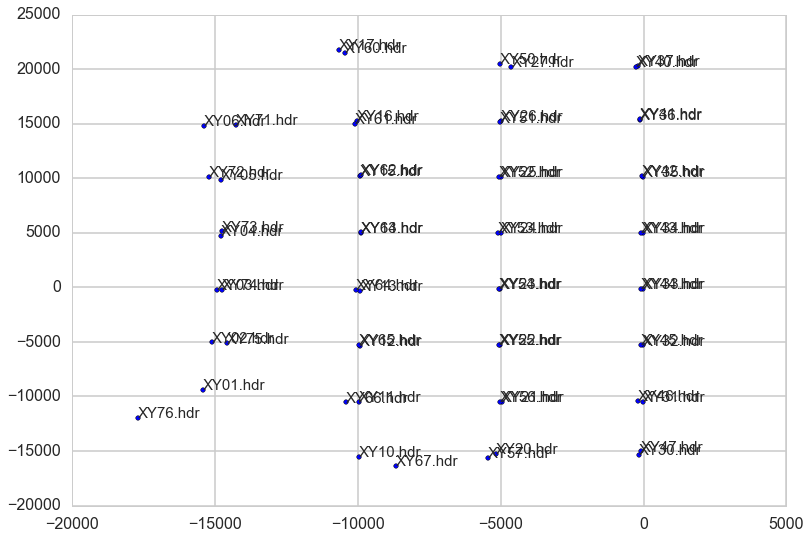

In [582]:
xpts = []
ypts = []
names = []
for hdu in fitsfile:
    if hdu.name.endswith('.hdr'):
        name, x, y = hdu.name, hdu.header['CRPIX1'], hdu.header['CRPIX2']
        print name
        xpts.append(x)
        ypts.append(y)
        names.append(name)
        
plt.scatter(xpts, ypts, label=names)
for name, x, y, in zip(names, xpts, ypts):
    plt.annotate(name, xy=(x,y), xytext=(x+0.1,y-0.05), fontsize=15)


In [525]:
for hdu in fitsfile:
    print hdu.name

PRIMARY
MATCHED_REFS
XY01.hdr
XY01.psf
XY01.deteff
XY02.hdr
XY02.psf
XY02.deteff
XY03.hdr
XY03.psf
XY03.deteff
XY04.hdr
XY04.psf
XY04.deteff
XY05.hdr
XY05.psf
XY05.deteff
XY06.hdr
XY06.psf
XY06.deteff
XY10.hdr
XY10.psf
XY10.deteff
XY11.hdr
XY11.psf
XY11.deteff
XY12.hdr
XY12.psf
XY12.deteff
XY13.hdr
XY13.psf
XY13.deteff
XY14.hdr
XY14.psf
XY14.deteff
XY15.hdr
XY15.psf
XY15.deteff
XY16.hdr
XY16.psf
XY16.deteff
XY17.hdr
XY17.psf
XY17.deteff
XY20.hdr
XY20.psf
XY20.deteff
XY21.hdr
XY21.psf
XY21.deteff
XY22.hdr
XY22.psf
XY22.deteff
XY23.hdr
XY23.psf
XY23.deteff
XY24.hdr
XY24.psf
XY24.deteff
XY25.hdr
XY25.psf
XY25.deteff
XY26.hdr
XY26.psf
XY26.deteff
XY27.hdr
XY27.psf
XY27.deteff
XY30.hdr
XY30.psf
XY30.deteff
XY31.hdr
XY31.psf
XY31.deteff
XY32.hdr
XY32.psf
XY32.deteff
XY33.hdr
XY33.psf
XY33.deteff
XY34.hdr
XY34.psf
XY34.deteff
XY35.hdr
XY35.psf
XY35.deteff
XY36.hdr
XY36.psf
XY36.deteff
XY37.hdr
XY37.psf
XY37.deteff
XY40.hdr
XY40.psf
XY40.deteff
XY41.hdr
XY41.psf
XY41.deteff
XY42.hdr
XY42.psf
X

In [641]:
3.4*3600/(24*60*60)

0.14166666666666666